In [1]:
import GEOparse
import os
import sys
import anndata as ad
import pandas as pd
import gzip
from tqdm import tqdm
from gears.utils import dataverse_download
from gears import PertData
import scanpy as sc
import plotly.express as px
from itertools import combinations
from zipfile import ZipFile
from scipy.sparse import csr_matrix, issparse
import numpy as np
import pickle

from data_processing.data_loader import find_sample_files, select_unique_samples, load_anndata_from_files
from data_processing.anndata_utils import combine_anndatas
from data_processing.preprocessing import run_pca, run_harmony # Add run_combat if you plan to use it
from data_processing.analysis import find_differentially_expressed_genes, find_upregulated_genes_manual

# Download AML scRNA dataset
https://pubmed.ncbi.nlm.nih.gov/30827681/

In [2]:
scRNA_aml = GEOparse.get_GEO(geo="GSE116256")
scrna_dataDir = f"scrna_data"
os.makedirs(scrna_dataDir, exist_ok=True)

30-Apr-2025 18:21:39 DEBUG utils - Directory ./ already exists. Skipping.
30-Apr-2025 18:21:39 INFO GEOparse - File already exist: using local version.
30-Apr-2025 18:21:39 INFO GEOparse - Parsing ./GSE116256_family.soft.gz: 
30-Apr-2025 18:21:39 DEBUG GEOparse - DATABASE: GeoMiame
30-Apr-2025 18:21:39 DEBUG GEOparse - SERIES: GSE116256
30-Apr-2025 18:21:39 DEBUG GEOparse - PLATFORM: GPL18573
30-Apr-2025 18:21:39 DEBUG GEOparse - PLATFORM: GPL24106
30-Apr-2025 18:21:39 DEBUG GEOparse - SAMPLE: GSM3587923
30-Apr-2025 18:21:39 DEBUG GEOparse - SAMPLE: GSM3587924
30-Apr-2025 18:21:39 DEBUG GEOparse - SAMPLE: GSM3587925
30-Apr-2025 18:21:39 DEBUG GEOparse - SAMPLE: GSM3587926
30-Apr-2025 18:21:39 DEBUG GEOparse - SAMPLE: GSM3587927
30-Apr-2025 18:21:39 DEBUG GEOparse - SAMPLE: GSM3587928
30-Apr-2025 18:21:39 DEBUG GEOparse - SAMPLE: GSM3587929
30-Apr-2025 18:21:39 DEBUG GEOparse - SAMPLE: GSM3587930
30-Apr-2025 18:21:39 DEBUG GEOparse - SAMPLE: GSM3587931
30-Apr-2025 18:21:39 DEBUG GEOpars

In [3]:
for i, (gsm_name, gsm) in enumerate(scRNA_aml.gsms.items()):
  gsm.download_supplementary_files(download_sra=False, email='emockler@ucsc.edu', directory=scrna_dataDir)

30-Apr-2025 18:21:39 DEBUG utils - Directory /home/noot/ML-AML/scrna_data/Supp_GSM3587923_AML1012-D0 already exists. Skipping.
30-Apr-2025 18:21:39 INFO downloader - File /home/noot/ML-AML/scrna_data/Supp_GSM3587923_AML1012-D0/GSM3587923_AML1012-D0.dem.txt.gz already exist. Use force=True if you would like to overwrite it.
30-Apr-2025 18:21:39 DEBUG utils - Directory /home/noot/ML-AML/scrna_data/Supp_GSM3587924_AML1012-D0-anno already exists. Skipping.
30-Apr-2025 18:21:39 INFO downloader - File /home/noot/ML-AML/scrna_data/Supp_GSM3587924_AML1012-D0-anno/GSM3587924_AML1012-D0.anno.txt.gz already exist. Use force=True if you would like to overwrite it.
30-Apr-2025 18:21:39 DEBUG utils - Directory /home/noot/ML-AML/scrna_data/Supp_GSM3587925_AML210A-D0 already exists. Skipping.
30-Apr-2025 18:21:39 INFO downloader - File /home/noot/ML-AML/scrna_data/Supp_GSM3587925_AML210A-D0/GSM3587925_AML210A-D0.dem.txt.gz already exist. Use force=True if you would like to overwrite it.
30-Apr-2025 18

30-Apr-2025 18:21:39 DEBUG utils - Directory /home/noot/ML-AML/scrna_data/Supp_GSM3587963_AML556-D0 already exists. Skipping.
30-Apr-2025 18:21:39 INFO downloader - File /home/noot/ML-AML/scrna_data/Supp_GSM3587963_AML556-D0/GSM3587963_AML556-D0.dem.txt.gz already exist. Use force=True if you would like to overwrite it.
30-Apr-2025 18:21:39 DEBUG utils - Directory /home/noot/ML-AML/scrna_data/Supp_GSM3587964_AML556-D0-anno already exists. Skipping.
30-Apr-2025 18:21:39 INFO downloader - File /home/noot/ML-AML/scrna_data/Supp_GSM3587964_AML556-D0-anno/GSM3587964_AML556-D0.anno.txt.gz already exist. Use force=True if you would like to overwrite it.
30-Apr-2025 18:21:39 DEBUG utils - Directory /home/noot/ML-AML/scrna_data/Supp_GSM3587965_AML556-D15 already exists. Skipping.
30-Apr-2025 18:21:39 INFO downloader - File /home/noot/ML-AML/scrna_data/Supp_GSM3587965_AML556-D15/GSM3587965_AML556-D15.dem.txt.gz already exist. Use force=True if you would like to overwrite it.
30-Apr-2025 18:21:39

# Load AML scRNA dataset

In [4]:
# Discover and categorize sample files using the new function
aml_files, control_files, cell_line_files = find_sample_files(scrna_dataDir)

# Optional: Print summary (as the function does internally)
print(f"Identified {len(aml_files)} AML, {len(control_files)} control, {len(cell_line_files)} cell line samples.")
print("AML Samples:", aml_files.keys())
print("Control Samples:", control_files.keys())

Found 35 AML, 6 control, 2 cell line samples with both files.
Identified 35 AML, 6 control, 2 cell line samples.
AML Samples: dict_keys(['AML997-D0', 'AML921A-D0', 'AML1012-D0', 'AML314-D31', 'AML328-D171', 'AML556-D31', 'AML556-D15', 'AML722B-D0', 'AML707B-D97', 'AML210A-D0', 'AML997-D35', 'AML328-D113', 'AML314-D0', 'AML707B-D113', 'AML371-D34', 'AML475-D0', 'AML556-D0', 'AML707B-D0', 'AML419A-D0', 'AML328-D0', 'AML916-D0', 'AML707B-D18', 'AML329-D0', 'AML329-D20', 'AML707B-D41', 'AML870-D14', 'AML870-D0', 'AML475-D29', 'AML722B-D49', 'AML420B-D35', 'AML420B-D0', 'AML371-D0', 'AML420B-D14', 'AML329-D37', 'AML328-D29'])
Control Samples: dict_keys(['BM5-34p38n', 'BM5-34p', 'BM3', 'BM4', 'BM1', 'BM2'])


In [5]:
# Select unique representatives for AML samples
_, unique_aml_samples_paths = select_unique_samples(aml_files)

# Select unique representatives for Control samples
_, unique_control_samples_paths = select_unique_samples(control_files)

# Combine the selected samples for processing
all_selected_samples = unique_aml_samples_paths | unique_control_samples_paths
aml_keys = list(unique_aml_samples_paths.keys()) # Needed later to identify 'case' samples

print(f"\nTotal unique samples selected for processing: {len(all_selected_samples)}")


Selecting unique samples from 35 total samples:
  Base ID AML1012: Found ['AML1012-D0'], selected AML1012-D0
  Base ID AML210A: Found ['AML210A-D0'], selected AML210A-D0
  Base ID AML314: Found ['AML314-D31', 'AML314-D0'], selected AML314-D0
  Base ID AML328: Found ['AML328-D171', 'AML328-D113', 'AML328-D0', 'AML328-D29'], selected AML328-D0
  Base ID AML329: Found ['AML329-D0', 'AML329-D20', 'AML329-D37'], selected AML329-D0
  Base ID AML371: Found ['AML371-D34', 'AML371-D0'], selected AML371-D0
  Base ID AML419A: Found ['AML419A-D0'], selected AML419A-D0
  Base ID AML420B: Found ['AML420B-D35', 'AML420B-D0', 'AML420B-D14'], selected AML420B-D0
  Base ID AML475: Found ['AML475-D0', 'AML475-D29'], selected AML475-D0
  Base ID AML556: Found ['AML556-D31', 'AML556-D15', 'AML556-D0'], selected AML556-D0
  Base ID AML707B: Found ['AML707B-D97', 'AML707B-D113', 'AML707B-D0', 'AML707B-D18', 'AML707B-D41'], selected AML707B-D0
  Base ID AML722B: Found ['AML722B-D0', 'AML722B-D49'], selected 

In [6]:
# Define the target gene list for consistent features across samples.
# Strategy: Load the first sample and use its genes as the reference.

if not all_selected_samples:
    raise ValueError("No samples selected for processing.")

# Get the first sample ID and its paths
first_sample_id = next(iter(all_selected_samples))
first_sample_paths = all_selected_samples[first_sample_id]

print(f"Defining target gene list based on first sample: {first_sample_id}")
try:
    # Load only the first sample to get its gene list
    # Use the basic loader directly, no need for full processing yet
    temp_adata = load_anndata_from_files(first_sample_paths['dem_path'], first_sample_paths['anno_path'])
    target_gene_list = temp_adata.var_names.tolist()
    print(f"Target gene list defined with {len(target_gene_list)} genes.")
    del temp_adata # Free up memory
except Exception as e:
    raise RuntimeError(f"Failed to load first sample {first_sample_id} to define target gene list: {e}")


Defining target gene list based on first sample: AML1012-D0
Loading AnnData: DEM='GSM3587923_AML1012-D0.dem.txt.gz', ANNO='GSM3587924_AML1012-D0.anno.txt.gz'
Loading gzipped file: scrna_data/Supp_GSM3587923_AML1012-D0/GSM3587923_AML1012-D0.dem.txt.gz


Loading gzipped file: scrna_data/Supp_GSM3587924_AML1012-D0-anno/GSM3587924_AML1012-D0.anno.txt.gz
Target gene list defined with 27899 genes.


In [7]:
# Load, process (align genes, normalize, filter cells), and combine samples
combined_adata, batch_to_sample = combine_anndatas(
    sample_dict=all_selected_samples,
    target_gene_list=target_gene_list,
    case_keys=aml_keys
)

# Store the unadjusted log-normalized data (already done inside combine_anndatas)
# combined_adata.layers['lognorm_unadjusted'] = combined_adata.layers['lognorm'].copy() # Renaming layer if needed

if combined_adata is not None:
    print("\nCombined AnnData object created:")
    print(combined_adata)
    print(f"Layer 'lognorm' contains log-normalized data before correction.")
    # Optional: Save intermediate object
    # combined_adata.write('combined_lognorm_filtered.h5ad')
else:
    print("Data combination failed.")


Starting processing and combination for 21 samples.


Processing samples:   0%|                                                                                                  | 0/21 [00:00<?, ?it/s]

Processing sample: AML1012-D0
Loading AnnData: DEM='GSM3587923_AML1012-D0.dem.txt.gz', ANNO='GSM3587924_AML1012-D0.anno.txt.gz'
Loading gzipped file: scrna_data/Supp_GSM3587923_AML1012-D0/GSM3587923_AML1012-D0.dem.txt.gz
Loading gzipped file: scrna_data/Supp_GSM3587924_AML1012-D0-anno/GSM3587924_AML1012-D0.anno.txt.gz
Aligning genes to a target list of 27899 genes...
Gene alignment complete. Final var count: 27899
Normalizing total counts and log-transforming...
Normalization and log-transform complete.
Filtering cells based on condition and prediction...


Processing samples:   5%|████▎                                                                                     | 1/21 [00:00<00:18,  1.10it/s]

Filtering complete. Kept 856 out of 1136 cells.
Finished processing sample AML1012-D0. Shape: (856, 27899)
Processing sample: AML210A-D0
Loading AnnData: DEM='GSM3587925_AML210A-D0.dem.txt.gz', ANNO='GSM3587926_AML210A-D0.anno.txt.gz'
Loading gzipped file: scrna_data/Supp_GSM3587925_AML210A-D0/GSM3587925_AML210A-D0.dem.txt.gz


Processing samples:  10%|████████▌                                                                                 | 2/21 [00:01<00:13,  1.44it/s]

Loading gzipped file: scrna_data/Supp_GSM3587926_AML210A-D0-anno/GSM3587926_AML210A-D0.anno.txt.gz
Aligning genes to a target list of 27899 genes...
Gene alignment complete. Final var count: 27899
Normalizing total counts and log-transforming...
Normalization and log-transform complete.
Filtering cells based on condition and prediction...
Filtering complete. Kept 464 out of 748 cells.
Finished processing sample AML210A-D0. Shape: (464, 27899)
Processing sample: AML314-D0
Loading AnnData: DEM='GSM3587927_AML314-D0.dem.txt.gz', ANNO='GSM3587928_AML314-D0.anno.txt.gz'
Loading gzipped file: scrna_data/Supp_GSM3587927_AML314-D0/GSM3587927_AML314-D0.dem.txt.gz


Processing samples:  14%|████████████▊                                                                             | 3/21 [00:01<00:07,  2.30it/s]

Loading gzipped file: scrna_data/Supp_GSM3587928_AML314-D0-anno/GSM3587928_AML314-D0.anno.txt.gz
Aligning genes to a target list of 27899 genes...
Gene alignment complete. Final var count: 27899
Normalizing total counts and log-transforming...
Normalization and log-transform complete.
Filtering cells based on condition and prediction...
Filtering complete. Kept 0 out of 162 cells.
Processing sample: AML328-D0
Loading AnnData: DEM='GSM3587931_AML328-D0.dem.txt.gz', ANNO='GSM3587932_AML328-D0.anno.txt.gz'
Loading gzipped file: scrna_data/Supp_GSM3587931_AML328-D0/GSM3587931_AML328-D0.dem.txt.gz
Loading gzipped file: scrna_data/Supp_GSM3587932_AML328-D0-anno/GSM3587932_AML328-D0.anno.txt.gz
Aligning genes to a target list of 27899 genes...
Gene alignment complete. Final var count: 27899
Normalizing total counts and log-transforming...
Normalization and log-transform complete.
Filtering cells based on condition and prediction...


Processing samples:  19%|█████████████████▏                                                                        | 4/21 [00:02<00:10,  1.64it/s]

Filtering complete. Kept 693 out of 1094 cells.
Finished processing sample AML328-D0. Shape: (693, 27899)
Processing sample: AML329-D0
Loading AnnData: DEM='GSM3587940_AML329-D0.dem.txt.gz', ANNO='GSM3587941_AML329-D0.anno.txt.gz'
Loading gzipped file: scrna_data/Supp_GSM3587940_AML329-D0/GSM3587940_AML329-D0.dem.txt.gz


Processing samples:  24%|█████████████████████▍                                                                    | 5/21 [00:02<00:08,  1.88it/s]

Loading gzipped file: scrna_data/Supp_GSM3587941_AML329-D0-anno/GSM3587941_AML329-D0.anno.txt.gz
Aligning genes to a target list of 27899 genes...
Gene alignment complete. Final var count: 27899
Normalizing total counts and log-transforming...
Normalization and log-transform complete.
Filtering cells based on condition and prediction...
Filtering complete. Kept 253 out of 525 cells.
Finished processing sample AML329-D0. Shape: (253, 27899)
Processing sample: AML371-D0
Loading AnnData: DEM='GSM3587946_AML371-D0.dem.txt.gz', ANNO='GSM3587947_AML371-D0.anno.txt.gz'
Loading gzipped file: scrna_data/Supp_GSM3587946_AML371-D0/GSM3587946_AML371-D0.dem.txt.gz


Processing samples:  29%|█████████████████████████▋                                                                | 6/21 [00:03<00:07,  1.91it/s]

Loading gzipped file: scrna_data/Supp_GSM3587947_AML371-D0-anno/GSM3587947_AML371-D0.anno.txt.gz
Aligning genes to a target list of 27899 genes...
Gene alignment complete. Final var count: 27899
Normalizing total counts and log-transforming...
Normalization and log-transform complete.
Filtering cells based on condition and prediction...
Filtering complete. Kept 0 out of 756 cells.
Processing sample: AML419A-D0
Loading AnnData: DEM='GSM3587950_AML419A-D0.dem.txt.gz', ANNO='GSM3587951_AML419A-D0.anno.txt.gz'
Loading gzipped file: scrna_data/Supp_GSM3587950_AML419A-D0/GSM3587950_AML419A-D0.dem.txt.gz
Loading gzipped file: scrna_data/Supp_GSM3587951_AML419A-D0-anno/GSM3587951_AML419A-D0.anno.txt.gz
Aligning genes to a target list of 27899 genes...
Gene alignment complete. Final var count: 27899
Normalizing total counts and log-transforming...
Normalization and log-transform complete.


Processing samples:  33%|██████████████████████████████                                                            | 7/21 [00:04<00:09,  1.49it/s]

Filtering cells based on condition and prediction...
Filtering complete. Kept 1068 out of 1189 cells.
Finished processing sample AML419A-D0. Shape: (1068, 27899)
Processing sample: AML420B-D0
Loading AnnData: DEM='GSM3587953_AML420B-D0.dem.txt.gz', ANNO='GSM3587954_AML420B-D0.anno.txt.gz'
Loading gzipped file: scrna_data/Supp_GSM3587953_AML420B-D0/GSM3587953_AML420B-D0.dem.txt.gz


Processing samples:  38%|██████████████████████████████████▎                                                       | 8/21 [00:04<00:07,  1.72it/s]

Loading gzipped file: scrna_data/Supp_GSM3587954_AML420B-D0-anno/GSM3587954_AML420B-D0.anno.txt.gz
Aligning genes to a target list of 27899 genes...
Gene alignment complete. Final var count: 27899
Normalizing total counts and log-transforming...
Normalization and log-transform complete.
Filtering cells based on condition and prediction...
Filtering complete. Kept 100 out of 485 cells.
Finished processing sample AML420B-D0. Shape: (100, 27899)
Processing sample: AML475-D0
Loading AnnData: DEM='GSM3587959_AML475-D0.dem.txt.gz', ANNO='GSM3587960_AML475-D0.anno.txt.gz'
Loading gzipped file: scrna_data/Supp_GSM3587959_AML475-D0/GSM3587959_AML475-D0.dem.txt.gz


Processing samples:  43%|██████████████████████████████████████▌                                                   | 9/21 [00:05<00:05,  2.00it/s]

Loading gzipped file: scrna_data/Supp_GSM3587960_AML475-D0-anno/GSM3587960_AML475-D0.anno.txt.gz
Aligning genes to a target list of 27899 genes...
Gene alignment complete. Final var count: 27899
Normalizing total counts and log-transforming...
Normalization and log-transform complete.
Filtering cells based on condition and prediction...
Filtering complete. Kept 308 out of 423 cells.
Finished processing sample AML475-D0. Shape: (308, 27899)
Processing sample: AML556-D0
Loading AnnData: DEM='GSM3587963_AML556-D0.dem.txt.gz', ANNO='GSM3587964_AML556-D0.anno.txt.gz'
Loading gzipped file: scrna_data/Supp_GSM3587963_AML556-D0/GSM3587963_AML556-D0.dem.txt.gz
Loading gzipped file: scrna_data/Supp_GSM3587964_AML556-D0-anno/GSM3587964_AML556-D0.anno.txt.gz
Aligning genes to a target list of 27899 genes...
Gene alignment complete. Final var count: 27899
Normalizing total counts and log-transforming...
Normalization and log-transform complete.
Filtering cells based on condition and prediction...


Processing samples:  48%|██████████████████████████████████████████▍                                              | 10/21 [00:07<00:12,  1.10s/it]

Filtering complete. Kept 2062 out of 2328 cells.
Finished processing sample AML556-D0. Shape: (2062, 27899)
Processing sample: AML707B-D0
Loading AnnData: DEM='GSM3587969_AML707B-D0.dem.txt.gz', ANNO='GSM3587970_AML707B-D0.anno.txt.gz'
Loading gzipped file: scrna_data/Supp_GSM3587969_AML707B-D0/GSM3587969_AML707B-D0.dem.txt.gz
Loading gzipped file: scrna_data/Supp_GSM3587970_AML707B-D0-anno/GSM3587970_AML707B-D0.anno.txt.gz
Aligning genes to a target list of 27899 genes...
Gene alignment complete. Final var count: 27899
Normalizing total counts and log-transforming...


Processing samples:  52%|██████████████████████████████████████████████▌                                          | 11/21 [00:08<00:12,  1.22s/it]

Normalization and log-transform complete.
Filtering cells based on condition and prediction...
Filtering complete. Kept 1370 out of 1586 cells.
Finished processing sample AML707B-D0. Shape: (1370, 27899)
Processing sample: AML722B-D0
Loading AnnData: DEM='GSM3587980_AML722B-D0.dem.txt.gz', ANNO='GSM3587981_AML722B-D0.anno.txt.gz'
Loading gzipped file: scrna_data/Supp_GSM3587980_AML722B-D0/GSM3587980_AML722B-D0.dem.txt.gz
Loading gzipped file: scrna_data/Supp_GSM3587981_AML722B-D0-anno/GSM3587981_AML722B-D0.anno.txt.gz
Aligning genes to a target list of 27899 genes...
Gene alignment complete. Final var count: 27899
Normalizing total counts and log-transforming...
Normalization and log-transform complete.
Filtering cells based on condition and prediction...
Filtering complete. Kept 0 out of 79 cells.
Processing sample: AML870-D0
Loading AnnData: DEM='GSM3587984_AML870-D0.dem.txt.gz', ANNO='GSM3587985_AML870-D0.anno.txt.gz'
Loading gzipped file: scrna_data/Supp_GSM3587984_AML870-D0/GSM358

Processing samples:  62%|███████████████████████████████████████████████████████                                  | 13/21 [00:09<00:05,  1.37it/s]

Normalization and log-transform complete.
Filtering cells based on condition and prediction...
Filtering complete. Kept 314 out of 345 cells.
Finished processing sample AML870-D0. Shape: (314, 27899)
Processing sample: AML916-D0
Loading AnnData: DEM='GSM3587988_AML916-D0.dem.txt.gz', ANNO='GSM3587989_AML916-D0.anno.txt.gz'
Loading gzipped file: scrna_data/Supp_GSM3587988_AML916-D0/GSM3587988_AML916-D0.dem.txt.gz
Loading gzipped file: scrna_data/Supp_GSM3587989_AML916-D0-anno/GSM3587989_AML916-D0.anno.txt.gz
Aligning genes to a target list of 27899 genes...
Gene alignment complete. Final var count: 27899
Normalizing total counts and log-transforming...
Normalization and log-transform complete.
Filtering cells based on condition and prediction...


Processing samples:  67%|███████████████████████████████████████████████████████████▎                             | 14/21 [00:10<00:05,  1.39it/s]

Filtering complete. Kept 775 out of 933 cells.
Finished processing sample AML916-D0. Shape: (775, 27899)
Processing sample: AML921A-D0
Loading AnnData: DEM='GSM3587990_AML921A-D0.dem.txt.gz', ANNO='GSM3587991_AML921A-D0.anno.txt.gz'
Loading gzipped file: scrna_data/Supp_GSM3587990_AML921A-D0/GSM3587990_AML921A-D0.dem.txt.gz
Loading gzipped file: scrna_data/Supp_GSM3587991_AML921A-D0-anno/GSM3587991_AML921A-D0.anno.txt.gz
Aligning genes to a target list of 27899 genes...
Gene alignment complete. Final var count: 27899
Normalizing total counts and log-transforming...
Normalization and log-transform complete.
Filtering cells based on condition and prediction...


Processing samples:  81%|████████████████████████████████████████████████████████████████████████                 | 17/21 [00:14<00:03,  1.06it/s]

Filtering complete. Kept 3378 out of 3813 cells.
Finished processing sample AML921A-D0. Shape: (3378, 27899)
Processing sample: AML997-D0
Loading AnnData: DEM='GSM3587992_AML997-D0.dem.txt.gz', ANNO='GSM3587993_AML997-D0.anno.txt.gz'
Loading gzipped file: scrna_data/Supp_GSM3587992_AML997-D0/GSM3587992_AML997-D0.dem.txt.gz
Loading gzipped file: scrna_data/Supp_GSM3587993_AML997-D0-anno/GSM3587993_AML997-D0.anno.txt.gz
Aligning genes to a target list of 27899 genes...
Gene alignment complete. Final var count: 27899
Normalizing total counts and log-transforming...
Normalization and log-transform complete.
Filtering cells based on condition and prediction...
Filtering complete. Kept 0 out of 83 cells.
Processing sample: BM1
Loading AnnData: DEM='GSM3587996_BM1.dem.txt.gz', ANNO='GSM3587996_BM1.anno.txt.gz'
Loading gzipped file: scrna_data/Supp_GSM3587996_BM1/GSM3587996_BM1.dem.txt.gz
Loading gzipped file: scrna_data/Supp_GSM3587996_BM1/GSM3587996_BM1.anno.txt.gz
Aligning genes to a target

Processing samples:  86%|████████████████████████████████████████████████████████████████████████████▎            | 18/21 [00:14<00:02,  1.32it/s]

Loading gzipped file: scrna_data/Supp_GSM3587997_BM2/GSM3587997_BM2.anno.txt.gz
Aligning genes to a target list of 27899 genes...
Gene alignment complete. Final var count: 27899
Normalizing total counts and log-transforming...
Normalization and log-transform complete.
Filtering cells based on condition and prediction...
Filtering complete. Kept 188 out of 188 cells.
Finished processing sample BM2. Shape: (188, 27899)
Processing sample: BM3
Loading AnnData: DEM='GSM3587998_BM3.dem.txt.gz', ANNO='GSM3587999_BM3.anno.txt.gz'
Loading gzipped file: scrna_data/Supp_GSM3587998_BM3/GSM3587998_BM3.dem.txt.gz


Processing samples:  90%|████████████████████████████████████████████████████████████████████████████████▌        | 19/21 [00:14<00:01,  1.46it/s]

Loading gzipped file: scrna_data/Supp_GSM3587999_BM3-anno/GSM3587999_BM3.anno.txt.gz
Aligning genes to a target list of 27899 genes...
Gene alignment complete. Final var count: 27899
Normalizing total counts and log-transforming...
Normalization and log-transform complete.
Filtering cells based on condition and prediction...
Filtering complete. Kept 643 out of 643 cells.
Finished processing sample BM3. Shape: (643, 27899)
Processing sample: BM4
Loading AnnData: DEM='GSM3588000_BM4.dem.txt.gz', ANNO='GSM3588001_BM4.anno.txt.gz'
Loading gzipped file: scrna_data/Supp_GSM3588000_BM4/GSM3588000_BM4.dem.txt.gz
Loading gzipped file: scrna_data/Supp_GSM3588001_BM4-anno/GSM3588001_BM4.anno.txt.gz
Aligning genes to a target list of 27899 genes...
Gene alignment complete. Final var count: 27899
Normalizing total counts and log-transforming...
Normalization and log-transform complete.
Filtering cells based on condition and prediction...


Processing samples:  95%|████████████████████████████████████████████████████████████████████████████████████▊    | 20/21 [00:18<00:01,  1.54s/it]

Filtering complete. Kept 3738 out of 3738 cells.
Finished processing sample BM4. Shape: (3738, 27899)
Processing sample: BM5-34p
Loading AnnData: DEM='GSM3588002_BM5-34p.dem.txt.gz', ANNO='GSM3588002_BM5-34p.anno.txt.gz'
Loading gzipped file: scrna_data/Supp_GSM3588002_BM5-34p/GSM3588002_BM5-34p.dem.txt.gz
Loading gzipped file: scrna_data/Supp_GSM3588002_BM5-34p/GSM3588002_BM5-34p.anno.txt.gz
Aligning genes to a target list of 27899 genes...
Gene alignment complete. Final var count: 27899
Normalizing total counts and log-transforming...


Processing samples: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:19<00:00,  1.06it/s]

Normalization and log-transform complete.
Filtering cells based on condition and prediction...
Filtering complete. Kept 1431 out of 1431 cells.
Finished processing sample BM5-34p. Shape: (1431, 27899)
Concatenating 17 processed AnnData objects...


Data loading and combining finished. Final shape: (17749, 27899)
Combined object obs columns: ['NumberOfReads', 'AlignedToGenome', 'AlignedToTranscriptome', 'TranscriptomeUMIs', 'NumberOfGenes', 'CyclingScore', 'CyclingBinary', 'MutTranscripts', 'WtTranscripts', 'PredictionRF2', 'PredictionRefined', 'cell_type', 'Score_HSC', 'Score_Prog', 'Score_GMP', 'Score_ProMono', 'Score_Mono', 'Score_cDC', 'Score_pDC', 'Score_earlyEry', 'Score_lateEry', 'Score_ProB', 'Score_B', 'Score_Plasma', 'Score_T', 'Score_CTL', 'Score_NK', 'sample_type', 'sample_id', 'batch_id_str', 'NanoporeTranscripts', 'batch']
Combined object var names head: ['A1BG', 'A1BG-AS1', 'A1CF', 'A2M', 'A2M-AS1']...
Combined object layers: ['counts', 'lognorm']

Combined AnnData object created:
AnnData object with n_obs × n_vars = 17749 × 27899
    obs: 'NumberOfReads', 'AlignedToGenome', 'AlignedToTranscriptome', 'TranscriptomeUMIs', 'NumberOfGenes', 'CyclingScore', 'CyclingBinary', 'MutTranscripts', 'WtTranscripts', 'Prediction

# GEARS

## Load gene set used to train GEARS

In [77]:
gears_data_dir = f"GEARS/GEARS_data"
os.makedirs(gears_data_dir, exist_ok=True)

if not os.path.exists(f"{gears_data_dir}/norman_umi_go"):
  if not os.path.exists(f"{gears_data_dir}/norman_umi_go.tar.gz"):
    # Dataloaders used for training
    dataverse_download('https://dataverse.harvard.edu/api/access/datafile/6979957', f'{gears_data_dir}/norman_umi_go.tar.gz')
  ## Extract and set up dataloader directory
  import tarfile
  with tarfile.open(f'{gears_data_dir}/norman_umi_go.tar.gz', 'r:gz') as tar:
      tar.extractall(gears_data_dir)
      tar.close()
  del tar

# load AnnData with genes list
adata_path = os.path.join(f'{gears_data_dir}/norman_umi_go', 'perturb_processed.h5ad')
trained_adata = sc.read_h5ad(adata_path)
trained_genes = trained_adata.var.gene_name.to_list()
del trained_adata


In [78]:
# --- GEARS Preparation with Ensembl ID Mapping ---

# 1. Import the gears_integration module
from gears_integration import prepare_adata_for_gears

# 2. Load the GEARS trained gene list
adata_path = os.path.join(f"{gears_data_dir}/norman_umi_go", 'perturb_processed.h5ad')
print(f"\nLoading GEARS trained gene list from: {adata_path}")

trained_genes = sc.read_h5ad(adata_path, backed='r').var_names.tolist()
print(f"GEARS target gene list defined with {len(trained_genes)} genes.")

# 3. Set up cache for gene ID mapping
cache_dir = os.path.join(os.getcwd(), 'cache')
os.makedirs(cache_dir, exist_ok=True)
cache_file = os.path.join(cache_dir, 'ensembl_gene_mapping_cache.pkl')

# 4. Clean combined_adata and prepare it for GEARS
print("Cleaning up previous dimensionality reduction results before gene alignment...")
keys_to_del = {'obsm': [], 'varm': [], 'uns': [], 'obsp': []}
if 'X_pca' in combined_adata.obsm: keys_to_del['obsm'].append('X_pca')
if 'X_pca_harmony' in combined_adata.obsm: keys_to_del['obsm'].append('X_pca_harmony') 
if 'X_umap' in combined_adata.obsm: keys_to_del['obsm'].append('X_umap')
if 'PCs' in combined_adata.varm: keys_to_del['varm'].append('PCs')
if 'pca' in combined_adata.uns: keys_to_del['uns'].append('pca')
if 'harmony' in combined_adata.uns: keys_to_del['uns'].append('harmony')
if 'neighbors' in combined_adata.uns:
    keys_to_del['uns'].append('neighbors')
    if 'distances' in combined_adata.obsp: keys_to_del['obsp'].append('distances')
    if 'connectivities' in combined_adata.obsp: keys_to_del['obsp'].append('connectivities')

for key_type, keys in keys_to_del.items():
    for key in keys:
        try:
            print(f"  Deleting combined_adata.{key_type}['{key}']")
            del getattr(combined_adata, key_type)[key]
        except KeyError:
            print(f"  Key combined_adata.{key_type}['{key}'] not found, skipping deletion.")

# 5. Prepare the data with automatic gene ID conversion using Ensembl API
gears_adata, ensembl_gene_mapping = prepare_adata_for_gears(combined_adata, trained_genes, cache_file=cache_file, max_workers=os.cpu_count())

# Now 'gears_adata' is ready for subsequent GEARS-specific steps


Loading GEARS trained gene list from: GEARS/GEARS_data/norman_umi_go/perturb_processed.h5ad
GEARS target gene list defined with 5054 genes.
Cleaning up previous dimensionality reduction results before gene alignment...
Preparing combined_adata for GEARS...
Combined AnnData uses Ensembl IDs: False
Trained genes use Ensembl IDs: True
Converting combined_adata gene symbols to Ensembl IDs using Ensembl REST API (5 threads)...
Loading gene mapping from cache: /home/noot/ML-AML/cache/ensembl_gene_mapping_cache.pkl


Converting to Ensembl IDs:   0%|          | 0/27899 [00:00<?, ?gene/s]

Conversion complete. AnnData shape: (17749, 27899)
Aligning converted AnnData to 5054 GEARS trained genes...
Aligning genes to a target list of 5054 genes...
Removing 23631 genes not in the target list.
Adding 786 missing genes with 0 expression.
After adding missing genes, adata shape: (17749, 5054)
Gene alignment complete. Final var count: 5054
Alignment complete. GEARS AnnData shape: (17749, 5054)
Verification successful: gears_adata.var_names matches trained_genes order.


In [79]:
gears_adata

AnnData object with n_obs × n_vars = 17749 × 5054
    obs: 'NumberOfReads', 'AlignedToGenome', 'AlignedToTranscriptome', 'TranscriptomeUMIs', 'NumberOfGenes', 'CyclingScore', 'CyclingBinary', 'MutTranscripts', 'WtTranscripts', 'PredictionRF2', 'PredictionRefined', 'cell_type', 'Score_HSC', 'Score_Prog', 'Score_GMP', 'Score_ProMono', 'Score_Mono', 'Score_cDC', 'Score_pDC', 'Score_earlyEry', 'Score_lateEry', 'Score_ProB', 'Score_B', 'Score_Plasma', 'Score_T', 'Score_CTL', 'Score_NK', 'sample_type', 'sample_id', 'batch_id_str', 'NanoporeTranscripts', 'batch'
    var: 'gene_name', 'gene_symbol'
    layers: 'counts', 'lognorm'

In [80]:
ensembl_gene_mapping.keys()

dict_keys(['ensembl_to_symbol', 'symbol_to_ensembl'])

In [81]:
gears_adata.X.max()

6.888518810272217

In [82]:
print(f"{len(gears_adata.var_names)} total pretrained genes")

5054 total pretrained genes


# Normalize expression data

In [83]:
gears_adata

AnnData object with n_obs × n_vars = 17749 × 5054
    obs: 'NumberOfReads', 'AlignedToGenome', 'AlignedToTranscriptome', 'TranscriptomeUMIs', 'NumberOfGenes', 'CyclingScore', 'CyclingBinary', 'MutTranscripts', 'WtTranscripts', 'PredictionRF2', 'PredictionRefined', 'cell_type', 'Score_HSC', 'Score_Prog', 'Score_GMP', 'Score_ProMono', 'Score_Mono', 'Score_cDC', 'Score_pDC', 'Score_earlyEry', 'Score_lateEry', 'Score_ProB', 'Score_B', 'Score_Plasma', 'Score_T', 'Score_CTL', 'Score_NK', 'sample_type', 'sample_id', 'batch_id_str', 'NanoporeTranscripts', 'batch'
    var: 'gene_name', 'gene_symbol'
    layers: 'counts', 'lognorm'

In [84]:
# Run PCA on the log-normalized, combined data
# Note: PCA is run *before* batch correction in this workflow,
# typically on the data that will be used as input for Harmony/ComBat.
if gears_adata is not None:
    run_pca(gears_adata, layer='lognorm', svd_solver='full') # Use the lognorm layer
else:
    print("Skipping PCA: gears_adata is None.")


Running PCA (n_comps=50, use_highly_variable=False)...
NaN replacement complete.
PCA complete. Results stored in adata.obsm['X_pca'] and related fields.


In [85]:
# Run Harmony for batch correction using sample_id
if gears_adata is not None:
    # Check if 'sample_id' exists (it should be added by build_processed_adata)
    if 'sample_id' in gears_adata.obs.columns:
         run_harmony(gears_adata, batch_key='sample_id', basis='X_pca', adjusted_basis='X_pca_harmony')
         print(gears_adata.obsm.keys()) # Verify 'X_pca_harmony' exists
    else:
         print("Warning: 'sample_id' column not found in gears_adata.obs. Cannot run Harmony.")
         # Fallback: try using 'batch' if sample_id missing, though less ideal
         # if 'batch' in combined_adata.obs.columns:
         #     print("Attempting Harmony using 'batch' key instead of 'sample_id'.")
         #     run_harmony(combined_adata, batch_key='batch', basis='X_pca', adjusted_basis='X_pca_harmony')
else:
    print("Skipping Harmony: combined_adata is None.")

2025-05-01 18:14:15,360 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-05-01 18:14:15,360 - INFO - Computing initial centroids with sklearn.KMeans...


Running Harmony batch correction (batch_key='sample_id', basis='X_pca')...
Converting batch key 'sample_id' to categorical for Harmony.


2025-05-01 18:14:16,765 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-05-01 18:14:16,765 - INFO - sklearn.KMeans initialization complete.
2025-05-01 18:14:16,813 - harmonypy - INFO - Iteration 1 of 10
2025-05-01 18:14:16,813 - INFO - Iteration 1 of 10
2025-05-01 18:14:18,873 - harmonypy - INFO - Iteration 2 of 10
2025-05-01 18:14:18,873 - INFO - Iteration 2 of 10
2025-05-01 18:14:20,794 - harmonypy - INFO - Iteration 3 of 10
2025-05-01 18:14:20,794 - INFO - Iteration 3 of 10
2025-05-01 18:14:22,768 - harmonypy - INFO - Iteration 4 of 10
2025-05-01 18:14:22,768 - INFO - Iteration 4 of 10
2025-05-01 18:14:24,684 - harmonypy - INFO - Iteration 5 of 10
2025-05-01 18:14:24,684 - INFO - Iteration 5 of 10
2025-05-01 18:14:26,638 - harmonypy - INFO - Converged after 5 iterations
2025-05-01 18:14:26,638 - INFO - Converged after 5 iterations


Harmony complete. Corrected basis stored in adata.obsm['X_pca_harmony'].
KeysView(AxisArrays with keys: X_pca, X_pca_harmony)


In [86]:
gears_adata.obs.columns

Index(['NumberOfReads', 'AlignedToGenome', 'AlignedToTranscriptome',
       'TranscriptomeUMIs', 'NumberOfGenes', 'CyclingScore', 'CyclingBinary',
       'MutTranscripts', 'WtTranscripts', 'PredictionRF2', 'PredictionRefined',
       'cell_type', 'Score_HSC', 'Score_Prog', 'Score_GMP', 'Score_ProMono',
       'Score_Mono', 'Score_cDC', 'Score_pDC', 'Score_earlyEry',
       'Score_lateEry', 'Score_ProB', 'Score_B', 'Score_Plasma', 'Score_T',
       'Score_CTL', 'Score_NK', 'sample_type', 'sample_id', 'batch_id_str',
       'NanoporeTranscripts', 'batch'],
      dtype='object')

... storing 'CyclingBinary' as categorical
... storing 'MutTranscripts' as categorical
... storing 'WtTranscripts' as categorical
... storing 'PredictionRF2' as categorical
... storing 'PredictionRefined' as categorical
... storing 'cell_type' as categorical
... storing 'sample_type' as categorical
... storing 'batch_id_str' as categorical
... storing 'NanoporeTranscripts' as categorical
... storing 'gene_symbol' as categorical


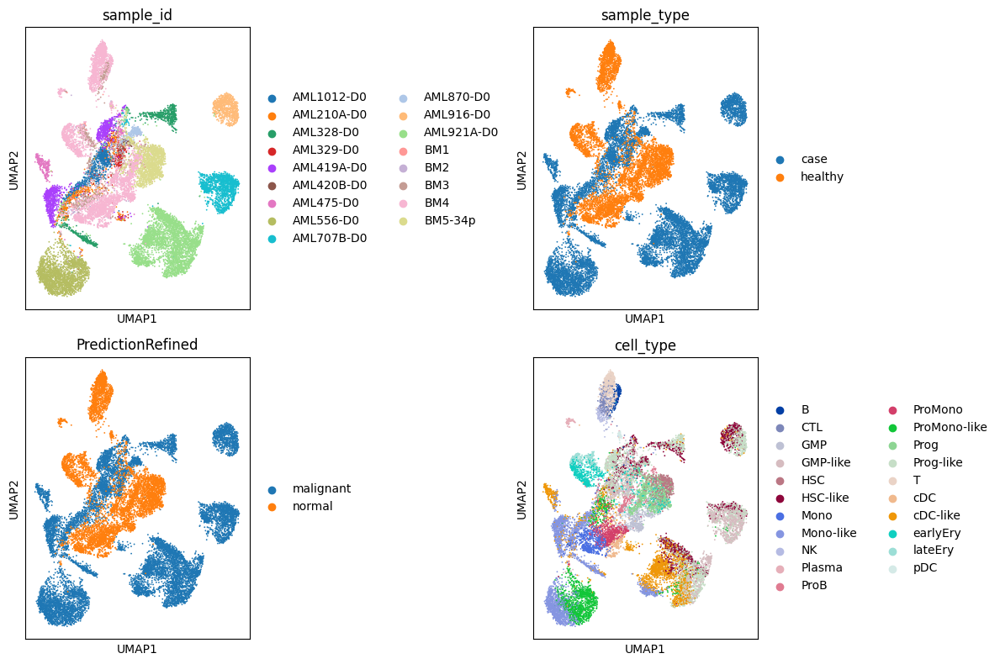

In [87]:
import scanpy as sc
import matplotlib.pyplot as plt

# Calculate neighbors and UMAP on combined_adata
# Note: If BBKNN was run, neighbors might already exist. Check first.
# Use Annoy backend instead of the default pynndescent
sc.pp.neighbors(gears_adata, n_neighbors=15, use_rep='X_pca')
sc.tl.umap(gears_adata)

# Plot UMAP colored by batch and PredictionRefined/sample_type
fig, axes = plt.subplots(2, 2, figsize=(12, 8))
sc.pl.umap(gears_adata, color='sample_id', ax=axes[0][0], show=False, title='sample_id')
sc.pl.umap(gears_adata, color='sample_type', ax=axes[0][1], show=False, title='sample_type')
sc.pl.umap(gears_adata, color='PredictionRefined', ax=axes[1][0], show=False, title='PredictionRefined')
sc.pl.umap(gears_adata, color='cell_type', ax=axes[1][1], show=False, title='cell_type')


plt.tight_layout()
plt.show()


In [112]:
gears_adata.obs[gears_adata.obs["sample_id"]=="AML419A-D0"]['cell_type'].value_counts()

cell_type
Mono-like       572
Prog-like       360
cDC-like         59
HSC-like         52
GMP-like         16
ProMono-like      9
B                 0
lateEry           0
earlyEry          0
cDC               0
T                 0
Prog              0
ProB              0
ProMono           0
CTL               0
Plasma            0
NK                0
Mono              0
HSC               0
GMP               0
pDC               0
Name: count, dtype: int64

# Build case/control classifier

In [88]:
# Use IPython's autoreload magic to automatically reload modules before execution
%load_ext autoreload
%autoreload 2

# Import the module as usual
import feature_selection
from feature_selection import BayesianFeatureSelector

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [89]:
# Cell 29 - Instantiate or Load Selector
import os
import time
# Ensure BayesianFeatureSelector is imported from your feature_selection module
# If it's not already imported earlier in the notebook, add:
# from feature_selection import BayesianFeatureSelector
import pandas as pd # Needed for data prep
import logging # Optional: for more detailed logs if needed

# Configure logging (optional)
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

# --- Checkpoint Loading Logic ---
selector = None
loaded_selector = False
checkpoint_base_dir = "bfs_checkpoints"
latest_run_id = None
expr_df = None # Initialize data vars
y_series = None # Initialize data vars

logging.info("Checking for existing checkpoints...")
if os.path.isdir(checkpoint_base_dir):
    try:
        # Find subdirectories that are strings of digits (timestamps)
        subdirs = [d for d in os.listdir(checkpoint_base_dir)
                   if os.path.isdir(os.path.join(checkpoint_base_dir, d)) and d.isdigit()]

        if subdirs:
            latest_timestamp = max(int(d) for d in subdirs)
            latest_run_id = str(latest_timestamp)
            logging.info(f"Found latest checkpoint with run_id: {latest_run_id}")

            # Try to load the selector state
            try:
                logging.info(f"Attempting to load selector state from {os.path.join(checkpoint_base_dir, latest_run_id)}...")
                # Instantiate with the unique_id from the checkpoint.
                # Provide necessary default/placeholder args for __init__.
                # Check BayesianFeatureSelector.__init__ definition for required arguments.
                selector = BayesianFeatureSelector(
                    unique_id=latest_run_id,
                    # Set parameters that might be needed even after loading state,
                    # e.g., verbosity or MLflow usage for potential later operations.
                    verbose=True, # Example: Keep verbosity consistent
                    use_mlflow=False # Example: Assume no MLflow for loaded model unless configured otherwise
                    # Add other required __init__ args here if they lack defaults
                )
                selector._load_model_state() # Loads pyro params, scaler, feature names
                logging.info(f"Successfully loaded selector state for run_id: {latest_run_id}")

                # Verify essential components were loaded
                if selector.scaler and selector.feature_names_ is not None:
                     loaded_selector = True
                     logging.info("Selector loaded and verified.")
                else:
                     logging.warning("Loaded selector state seems incomplete (missing scaler or feature names). Discarding.")
                     selector = None # Reset if incomplete
            except FileNotFoundError:
                logging.error(f"Checkpoint files not found in {os.path.join(checkpoint_base_dir, latest_run_id)}. Cannot load.")
                selector = None
            except Exception as e:
                logging.error(f"Error loading selector state from checkpoint {latest_run_id}: {e}", exc_info=True)
                selector = None
        else:
            logging.info("No valid timestamped checkpoint directories found.")
    except Exception as e:
        logging.error(f"Error accessing checkpoint directory {checkpoint_base_dir}: {e}", exc_info=True)
else:
    logging.info(f"Checkpoint directory '{checkpoint_base_dir}' not found.")

# --- Data Preparation (Run if combined_adata exists) ---
# Prepares data needed for either training a new model or using a loaded one.
# Assumes 'combined_adata' and 'gears_adata' are defined in previous cells.
if 'combined_adata' in locals() and combined_adata is not None:
    logging.info("Preparing data (expr_df, y_series)...")
    try:
        # Ensure gears_adata is available
        if 'gears_adata' not in locals() or gears_adata is None:
             raise NameError("gears_adata is not defined or is None, cannot prepare data.")

        expr_df = pd.DataFrame(gears_adata.X.toarray() if hasattr(gears_adata.X, "toarray") else gears_adata.X, # Handle sparse matrix
                               columns=gears_adata.var_names,
                               index=gears_adata.obs_names)
        y_series = gears_adata.obs['PredictionRefined'].map({'malignant': 1, 'normal': 0})
        y_series = y_series.reindex(expr_df.index)

        if y_series.isnull().any():
            logging.warning("NaN values found in target series after mapping/reindexing. Dropping corresponding samples.")
            nan_indices = y_series[y_series.isnull()].index
            original_count = len(expr_df)
            expr_df = expr_df.drop(index=nan_indices)
            y_series = y_series.drop(index=nan_indices)
            logging.info(f"Removed {len(nan_indices)} samples with NaN target (out of {original_count}).")
            if expr_df.empty:
                 logging.warning("Dataframe is empty after removing NaN target samples.")
                 expr_df = None # Set to None if empty
                 y_series = None
        logging.info(f"Data preparation complete. expr_df shape: {expr_df.shape if expr_df is not None else 'None'}, y_series length: {len(y_series) if y_series is not None else 'None'}")
    except Exception as e:
        logging.error(f"Error during data preparation: {e}", exc_info=True)
        expr_df = None
        y_series = None
else:
    logging.info("combined_adata is None or not defined. Skipping data preparation.")
    expr_df = None
    y_series = None


# --- Instantiate NEW Selector (Only if not loaded and data is valid) ---
if not loaded_selector and expr_df is not None and y_series is not None:
    logging.info("No valid checkpoint loaded and data is available. Instantiating NEW BayesianFeatureSelector...")
    # Generate a unique ID for this NEW run
    run_id = str(int(time.time()))

    # Instantiate the selector with training parameters
    try:
        selector = BayesianFeatureSelector(
            unique_id=run_id,
            num_iterations=2000, # Adjust as needed
            lr=1e-3,             # Adjust as needed
            credible_interval=0.9, # Adjust as needed
            num_samples=1000,    # Adjust as needed
            batch_size=256,      # Adjust as needed
            verbose=True,        # Set to True for progress during training
            patience=20,         # Adjust as needed
            max_features=200,    # Adjust as needed
            use_mlflow=False     # Set True if using MLflow for this new run
            # Add other params like k_neighbors, smooth_window etc. if defaults are not desired
        )
        logging.info(f"New selector instantiated with unique_id: {run_id}. Ready for fitting.")
    except Exception as e:
        logging.error(f"Error instantiating new BayesianFeatureSelector: {e}", exc_info=True)
        selector = None # Ensure selector is None if instantiation fails

elif loaded_selector:
    logging.info(f"Using pre-loaded selector (run_id: {selector.unique_id}). Ready for transformation/prediction.")
    # Data (expr_df, y_series) should already be prepared if valid.

else: # Handles cases: Data preparation failed, expr_df/y_series is None, or combined_adata was None initially.
    logging.info("Skipping Feature Selector setup: No checkpoint loaded and data is unavailable/invalid.")
    # selector is already None or explicitly set to None above

2025-05-01 18:14:36,156 - INFO - Checking for existing checkpoints...
2025-05-01 18:14:36,157 - INFO - Found latest checkpoint with run_id: 1746049737
2025-05-01 18:14:36,157 - INFO - Attempting to load selector state from bfs_checkpoints/1746049737...
2025-05-01 18:14:36,158 - INFO - Using device: cuda
2025-05-01 18:14:36,177 - INFO - Successfully loaded model state from bfs_checkpoints/1746049737
2025-05-01 18:14:36,177 - INFO - Successfully loaded selector state for run_id: 1746049737
2025-05-01 18:14:36,177 - INFO - Selector loaded and verified.
2025-05-01 18:14:36,178 - INFO - Preparing data (expr_df, y_series)...
2025-05-01 18:14:36,179 - INFO - Data preparation complete. expr_df shape: (17749, 5054), y_series length: 17749
2025-05-01 18:14:36,179 - INFO - Using pre-loaded selector (run_id: 1746049737). Ready for transformation/prediction.


Using CUDA (GPU) acceleration.


Fitting BayesianFeatureSelector...


SVI Iterations:   0%|▍                                                                                          | 10/2000 [00:06<23:40,  1.40it/s]

Iter 10/2000 - ELBO Loss: 69.5423, Val NLL: 0.3236, Val Acc: 0.9192, Val F1: 0.9348


SVI Iterations:   1%|▉                                                                                          | 20/2000 [00:13<23:05,  1.43it/s]

Iter 20/2000 - ELBO Loss: 45.8120, Val NLL: 0.3886, Val Acc: 0.9231, Val F1: 0.9385


SVI Iterations:   2%|█▎                                                                                         | 30/2000 [00:19<23:01,  1.43it/s]

Iter 30/2000 - ELBO Loss: 33.2838, Val NLL: 0.3779, Val Acc: 0.9321, Val F1: 0.9465


SVI Iterations:   2%|█▊                                                                                         | 40/2000 [00:26<24:06,  1.35it/s]

Iter 40/2000 - ELBO Loss: 26.5705, Val NLL: 0.3295, Val Acc: 0.9575, Val F1: 0.9681


SVI Iterations:   2%|██▎                                                                                        | 50/2000 [00:33<23:07,  1.41it/s]

Iter 50/2000 - ELBO Loss: 23.6471, Val NLL: 0.3134, Val Acc: 0.9620, Val F1: 0.9711


SVI Iterations:   3%|██▋                                                                                        | 60/2000 [00:39<23:42,  1.36it/s]

Iter 60/2000 - ELBO Loss: 22.6805, Val NLL: 0.3395, Val Acc: 0.9234, Val F1: 0.9384


SVI Iterations:   4%|███▏                                                                                       | 70/2000 [00:46<23:00,  1.40it/s]

Iter 70/2000 - ELBO Loss: 22.2098, Val NLL: 0.2905, Val Acc: 0.9569, Val F1: 0.9665


SVI Iterations:   4%|███▋                                                                                       | 80/2000 [00:52<22:06,  1.45it/s]

Iter 80/2000 - ELBO Loss: 22.1635, Val NLL: 0.2662, Val Acc: 0.9620, Val F1: 0.9707


SVI Iterations:   4%|████                                                                                       | 90/2000 [00:59<22:53,  1.39it/s]

Iter 90/2000 - ELBO Loss: 22.4789, Val NLL: 0.2858, Val Acc: 0.9476, Val F1: 0.9587


SVI Iterations:   5%|████▌                                                                                     | 100/2000 [01:06<21:49,  1.45it/s]

Iter 100/2000 - ELBO Loss: 22.5080, Val NLL: 0.2588, Val Acc: 0.9645, Val F1: 0.9725


SVI Iterations:   6%|████▉                                                                                     | 110/2000 [01:12<21:57,  1.43it/s]

Iter 110/2000 - ELBO Loss: 22.4483, Val NLL: 0.2380, Val Acc: 0.9707, Val F1: 0.9776


SVI Iterations:   6%|█████▍                                                                                    | 120/2000 [01:19<22:04,  1.42it/s]

Iter 120/2000 - ELBO Loss: 22.6803, Val NLL: 0.2432, Val Acc: 0.9651, Val F1: 0.9730


SVI Iterations:   6%|█████▊                                                                                    | 130/2000 [01:26<24:47,  1.26it/s]

Iter 130/2000 - ELBO Loss: 22.9101, Val NLL: 0.2318, Val Acc: 0.9648, Val F1: 0.9727


SVI Iterations:   7%|██████▎                                                                                   | 140/2000 [01:32<22:05,  1.40it/s]

Iter 140/2000 - ELBO Loss: 23.2035, Val NLL: 0.2338, Val Acc: 0.9569, Val F1: 0.9663


SVI Iterations:   8%|██████▊                                                                                   | 150/2000 [01:39<21:59,  1.40it/s]

Iter 150/2000 - ELBO Loss: 23.4767, Val NLL: 0.2152, Val Acc: 0.9656, Val F1: 0.9734


SVI Iterations:   8%|███████▏                                                                                  | 160/2000 [01:45<21:31,  1.42it/s]

Iter 160/2000 - ELBO Loss: 24.2346, Val NLL: 0.2400, Val Acc: 0.9394, Val F1: 0.9518


SVI Iterations:   8%|███████▋                                                                                  | 170/2000 [01:52<20:57,  1.46it/s]

Iter 170/2000 - ELBO Loss: 23.7122, Val NLL: 0.2007, Val Acc: 0.9769, Val F1: 0.9823


SVI Iterations:   9%|████████                                                                                  | 180/2000 [01:58<21:51,  1.39it/s]

Iter 180/2000 - ELBO Loss: 23.9842, Val NLL: 0.2006, Val Acc: 0.9769, Val F1: 0.9823


SVI Iterations:  10%|████████▌                                                                                 | 190/2000 [02:05<21:16,  1.42it/s]

Iter 190/2000 - ELBO Loss: 23.9827, Val NLL: 0.2245, Val Acc: 0.9535, Val F1: 0.9635


SVI Iterations:  10%|█████████                                                                                 | 200/2000 [02:11<21:23,  1.40it/s]

Iter 200/2000 - ELBO Loss: 24.2851, Val NLL: 0.1965, Val Acc: 0.9744, Val F1: 0.9802


SVI Iterations:  10%|█████████▍                                                                                | 210/2000 [02:18<21:16,  1.40it/s]

Iter 210/2000 - ELBO Loss: 24.1887, Val NLL: 0.1835, Val Acc: 0.9811, Val F1: 0.9857


SVI Iterations:  11%|█████████▉                                                                                | 220/2000 [02:25<23:09,  1.28it/s]

Iter 220/2000 - ELBO Loss: 24.4786, Val NLL: 0.1863, Val Acc: 0.9772, Val F1: 0.9825


SVI Iterations:  12%|██████████▎                                                                               | 230/2000 [02:31<20:45,  1.42it/s]

Iter 230/2000 - ELBO Loss: 24.2861, Val NLL: 0.1878, Val Acc: 0.9797, Val F1: 0.9845


SVI Iterations:  12%|██████████▊                                                                               | 240/2000 [02:38<20:49,  1.41it/s]

Iter 240/2000 - ELBO Loss: 24.4236, Val NLL: 0.1885, Val Acc: 0.9654, Val F1: 0.9730


SVI Iterations:  12%|███████████▎                                                                              | 250/2000 [02:44<20:25,  1.43it/s]

Iter 250/2000 - ELBO Loss: 24.4875, Val NLL: 0.1839, Val Acc: 0.9676, Val F1: 0.9749


SVI Iterations:  13%|███████████▋                                                                              | 260/2000 [02:51<19:51,  1.46it/s]

Iter 260/2000 - ELBO Loss: 24.8656, Val NLL: 0.1867, Val Acc: 0.9685, Val F1: 0.9755


SVI Iterations:  14%|████████████▏                                                                             | 270/2000 [02:57<22:00,  1.31it/s]

Iter 270/2000 - ELBO Loss: 24.7418, Val NLL: 0.1721, Val Acc: 0.9803, Val F1: 0.9849


SVI Iterations:  14%|████████████▌                                                                             | 280/2000 [03:04<19:49,  1.45it/s]

Iter 280/2000 - ELBO Loss: 24.8730, Val NLL: 0.1659, Val Acc: 0.9848, Val F1: 0.9884


SVI Iterations:  14%|█████████████                                                                             | 290/2000 [03:10<19:19,  1.47it/s]

Iter 290/2000 - ELBO Loss: 24.5860, Val NLL: 0.1733, Val Acc: 0.9710, Val F1: 0.9775


SVI Iterations:  15%|█████████████▌                                                                            | 300/2000 [03:16<20:06,  1.41it/s]

Iter 300/2000 - ELBO Loss: 25.0449, Val NLL: 0.1663, Val Acc: 0.9806, Val F1: 0.9851


SVI Iterations:  16%|█████████████▉                                                                            | 310/2000 [03:23<20:02,  1.41it/s]

Iter 310/2000 - ELBO Loss: 24.9788, Val NLL: 0.1929, Val Acc: 0.9594, Val F1: 0.9682


SVI Iterations:  16%|██████████████▍                                                                           | 320/2000 [03:30<20:03,  1.40it/s]

Iter 320/2000 - ELBO Loss: 25.2181, Val NLL: 0.1645, Val Acc: 0.9808, Val F1: 0.9853


SVI Iterations:  16%|██████████████▊                                                                           | 330/2000 [03:36<19:02,  1.46it/s]

Iter 330/2000 - ELBO Loss: 24.9277, Val NLL: 0.1642, Val Acc: 0.9808, Val F1: 0.9853


SVI Iterations:  17%|███████████████▎                                                                          | 340/2000 [03:42<19:17,  1.43it/s]

Iter 340/2000 - ELBO Loss: 24.9824, Val NLL: 0.1514, Val Acc: 0.9848, Val F1: 0.9884


SVI Iterations:  18%|███████████████▋                                                                          | 350/2000 [03:49<18:44,  1.47it/s]

Iter 350/2000 - ELBO Loss: 25.5130, Val NLL: 0.1777, Val Acc: 0.9679, Val F1: 0.9750


SVI Iterations:  18%|████████████████▏                                                                         | 360/2000 [03:55<20:59,  1.30it/s]

Iter 360/2000 - ELBO Loss: 25.2067, Val NLL: 0.1512, Val Acc: 0.9851, Val F1: 0.9886


SVI Iterations:  18%|████████████████▋                                                                         | 370/2000 [04:02<19:07,  1.42it/s]

Iter 370/2000 - ELBO Loss: 25.1435, Val NLL: 0.1548, Val Acc: 0.9783, Val F1: 0.9833


SVI Iterations:  19%|█████████████████                                                                         | 380/2000 [04:08<19:00,  1.42it/s]

Iter 380/2000 - ELBO Loss: 25.0675, Val NLL: 0.1615, Val Acc: 0.9758, Val F1: 0.9813


SVI Iterations:  20%|█████████████████▌                                                                        | 390/2000 [04:15<19:08,  1.40it/s]

Iter 390/2000 - ELBO Loss: 25.2439, Val NLL: 0.1406, Val Acc: 0.9854, Val F1: 0.9888


SVI Iterations:  20%|██████████████████                                                                        | 400/2000 [04:21<18:49,  1.42it/s]

Iter 400/2000 - ELBO Loss: 25.4749, Val NLL: 0.1533, Val Acc: 0.9803, Val F1: 0.9848


SVI Iterations:  20%|██████████████████▍                                                                       | 410/2000 [04:28<20:24,  1.30it/s]

Iter 410/2000 - ELBO Loss: 25.4031, Val NLL: 0.1337, Val Acc: 0.9856, Val F1: 0.9891


SVI Iterations:  21%|██████████████████▉                                                                       | 420/2000 [04:34<17:58,  1.47it/s]

Iter 420/2000 - ELBO Loss: 25.4916, Val NLL: 0.1542, Val Acc: 0.9794, Val F1: 0.9842


SVI Iterations:  22%|███████████████████▎                                                                      | 430/2000 [04:41<18:36,  1.41it/s]

Iter 430/2000 - ELBO Loss: 25.4093, Val NLL: 0.1461, Val Acc: 0.9828, Val F1: 0.9868


SVI Iterations:  22%|███████████████████▊                                                                      | 440/2000 [04:47<18:30,  1.41it/s]

Iter 440/2000 - ELBO Loss: 25.6769, Val NLL: 0.1501, Val Acc: 0.9794, Val F1: 0.9841


SVI Iterations:  22%|████████████████████▎                                                                     | 450/2000 [04:54<18:28,  1.40it/s]

Iter 450/2000 - ELBO Loss: 25.4727, Val NLL: 0.1579, Val Acc: 0.9718, Val F1: 0.9782


SVI Iterations:  23%|████████████████████▋                                                                     | 460/2000 [05:01<18:26,  1.39it/s]

Iter 460/2000 - ELBO Loss: 25.6687, Val NLL: 0.1503, Val Acc: 0.9786, Val F1: 0.9835


SVI Iterations:  24%|█████████████████████▏                                                                    | 470/2000 [05:07<18:05,  1.41it/s]

Iter 470/2000 - ELBO Loss: 25.6168, Val NLL: 0.1446, Val Acc: 0.9831, Val F1: 0.9870


SVI Iterations:  24%|█████████████████████▌                                                                    | 480/2000 [05:14<18:08,  1.40it/s]

Iter 480/2000 - ELBO Loss: 25.5962, Val NLL: 0.1350, Val Acc: 0.9839, Val F1: 0.9877


SVI Iterations:  24%|██████████████████████                                                                    | 490/2000 [05:20<17:37,  1.43it/s]

Iter 490/2000 - ELBO Loss: 25.5915, Val NLL: 0.1370, Val Acc: 0.9865, Val F1: 0.9897


SVI Iterations:  25%|██████████████████████▌                                                                   | 500/2000 [05:27<19:50,  1.26it/s]

Iter 500/2000 - ELBO Loss: 25.7858, Val NLL: 0.1399, Val Acc: 0.9820, Val F1: 0.9861


SVI Iterations:  26%|██████████████████████▉                                                                   | 510/2000 [05:34<17:34,  1.41it/s]

Iter 510/2000 - ELBO Loss: 25.5281, Val NLL: 0.1346, Val Acc: 0.9873, Val F1: 0.9903


SVI Iterations:  26%|███████████████████████▍                                                                  | 520/2000 [05:40<17:31,  1.41it/s]

Iter 520/2000 - ELBO Loss: 25.6923, Val NLL: 0.1340, Val Acc: 0.9851, Val F1: 0.9886


SVI Iterations:  26%|███████████████████████▊                                                                  | 530/2000 [05:47<17:22,  1.41it/s]

Iter 530/2000 - ELBO Loss: 25.6813, Val NLL: 0.1342, Val Acc: 0.9859, Val F1: 0.9892


SVI Iterations:  27%|████████████████████████▎                                                                 | 540/2000 [05:53<17:17,  1.41it/s]

Iter 540/2000 - ELBO Loss: 25.7996, Val NLL: 0.1345, Val Acc: 0.9865, Val F1: 0.9896


SVI Iterations:  28%|████████████████████████▊                                                                 | 550/2000 [06:00<19:11,  1.26it/s]

Iter 550/2000 - ELBO Loss: 25.7643, Val NLL: 0.1342, Val Acc: 0.9823, Val F1: 0.9863


SVI Iterations:  28%|█████████████████████████▏                                                                | 560/2000 [06:07<17:07,  1.40it/s]

Iter 560/2000 - ELBO Loss: 26.0461, Val NLL: 0.1242, Val Acc: 0.9854, Val F1: 0.9888


SVI Iterations:  28%|█████████████████████████▋                                                                | 570/2000 [06:13<16:49,  1.42it/s]

Iter 570/2000 - ELBO Loss: 25.7150, Val NLL: 0.1283, Val Acc: 0.9854, Val F1: 0.9888


SVI Iterations:  29%|██████████████████████████                                                                | 580/2000 [06:20<16:50,  1.41it/s]

Iter 580/2000 - ELBO Loss: 25.6604, Val NLL: 0.1514, Val Acc: 0.9693, Val F1: 0.9761


SVI Iterations:  30%|██████████████████████████▌                                                               | 590/2000 [06:27<16:42,  1.41it/s]

Iter 590/2000 - ELBO Loss: 25.7054, Val NLL: 0.1228, Val Acc: 0.9859, Val F1: 0.9892


SVI Iterations:  30%|███████████████████████████                                                               | 600/2000 [06:33<16:26,  1.42it/s]

Iter 600/2000 - ELBO Loss: 26.1196, Val NLL: 0.1290, Val Acc: 0.9806, Val F1: 0.9850


SVI Iterations:  30%|███████████████████████████▍                                                              | 610/2000 [06:40<15:50,  1.46it/s]

Iter 610/2000 - ELBO Loss: 25.9151, Val NLL: 0.1353, Val Acc: 0.9808, Val F1: 0.9852


SVI Iterations:  31%|███████████████████████████▉                                                              | 620/2000 [06:46<16:15,  1.41it/s]

Iter 620/2000 - ELBO Loss: 25.9626, Val NLL: 0.1420, Val Acc: 0.9752, Val F1: 0.9808


SVI Iterations:  32%|████████████████████████████▎                                                             | 630/2000 [06:53<16:14,  1.41it/s]

Iter 630/2000 - ELBO Loss: 26.0541, Val NLL: 0.1308, Val Acc: 0.9817, Val F1: 0.9859


SVI Iterations:  32%|████████████████████████████▊                                                             | 640/2000 [06:59<15:38,  1.45it/s]

Iter 640/2000 - ELBO Loss: 25.8184, Val NLL: 0.1233, Val Acc: 0.9845, Val F1: 0.9881


SVI Iterations:  32%|█████████████████████████████▎                                                            | 650/2000 [07:06<16:04,  1.40it/s]

Iter 650/2000 - ELBO Loss: 25.8123, Val NLL: 0.1271, Val Acc: 0.9837, Val F1: 0.9875


SVI Iterations:  33%|█████████████████████████████▋                                                            | 660/2000 [07:12<15:34,  1.43it/s]

Iter 660/2000 - ELBO Loss: 25.8612, Val NLL: 0.1196, Val Acc: 0.9862, Val F1: 0.9894


SVI Iterations:  34%|██████████████████████████████▏                                                           | 670/2000 [07:19<15:23,  1.44it/s]

Iter 670/2000 - ELBO Loss: 25.7007, Val NLL: 0.1143, Val Acc: 0.9890, Val F1: 0.9916


SVI Iterations:  34%|██████████████████████████████▌                                                           | 680/2000 [07:25<15:13,  1.44it/s]

Iter 680/2000 - ELBO Loss: 25.7286, Val NLL: 0.1198, Val Acc: 0.9865, Val F1: 0.9897


SVI Iterations:  34%|███████████████████████████████                                                           | 690/2000 [07:32<15:58,  1.37it/s]

Iter 690/2000 - ELBO Loss: 25.9039, Val NLL: 0.1282, Val Acc: 0.9814, Val F1: 0.9857


SVI Iterations:  35%|███████████████████████████████▍                                                          | 700/2000 [07:38<14:49,  1.46it/s]

Iter 700/2000 - ELBO Loss: 25.6992, Val NLL: 0.1131, Val Acc: 0.9865, Val F1: 0.9896


SVI Iterations:  36%|███████████████████████████████▉                                                          | 710/2000 [07:45<15:14,  1.41it/s]

Iter 710/2000 - ELBO Loss: 25.8853, Val NLL: 0.1199, Val Acc: 0.9876, Val F1: 0.9905


SVI Iterations:  36%|████████████████████████████████▍                                                         | 720/2000 [07:51<14:52,  1.43it/s]

Iter 720/2000 - ELBO Loss: 25.7506, Val NLL: 0.1118, Val Acc: 0.9893, Val F1: 0.9918


SVI Iterations:  36%|████████████████████████████████▊                                                         | 730/2000 [07:58<15:01,  1.41it/s]

Iter 730/2000 - ELBO Loss: 26.0585, Val NLL: 0.1120, Val Acc: 0.9899, Val F1: 0.9923


SVI Iterations:  37%|█████████████████████████████████▎                                                        | 740/2000 [08:05<15:19,  1.37it/s]

Iter 740/2000 - ELBO Loss: 25.9980, Val NLL: 0.1123, Val Acc: 0.9893, Val F1: 0.9918


SVI Iterations:  38%|█████████████████████████████████▊                                                        | 750/2000 [08:11<14:48,  1.41it/s]

Iter 750/2000 - ELBO Loss: 25.9046, Val NLL: 0.1125, Val Acc: 0.9870, Val F1: 0.9901


SVI Iterations:  38%|██████████████████████████████████▏                                                       | 760/2000 [08:18<14:42,  1.40it/s]

Iter 760/2000 - ELBO Loss: 26.2174, Val NLL: 0.1138, Val Acc: 0.9873, Val F1: 0.9903


SVI Iterations:  38%|██████████████████████████████████▋                                                       | 770/2000 [08:24<14:36,  1.40it/s]

Iter 770/2000 - ELBO Loss: 25.9899, Val NLL: 0.1042, Val Acc: 0.9890, Val F1: 0.9916


SVI Iterations:  39%|███████████████████████████████████                                                       | 780/2000 [08:31<15:39,  1.30it/s]

Iter 780/2000 - ELBO Loss: 25.8236, Val NLL: 0.1103, Val Acc: 0.9873, Val F1: 0.9903


SVI Iterations:  40%|███████████████████████████████████▌                                                      | 790/2000 [08:37<14:24,  1.40it/s]

Iter 790/2000 - ELBO Loss: 26.2486, Val NLL: 0.1122, Val Acc: 0.9873, Val F1: 0.9903


SVI Iterations:  40%|████████████████████████████████████                                                      | 800/2000 [08:44<13:49,  1.45it/s]

Iter 800/2000 - ELBO Loss: 26.0709, Val NLL: 0.1040, Val Acc: 0.9890, Val F1: 0.9916


SVI Iterations:  40%|████████████████████████████████████▍                                                     | 810/2000 [08:50<14:03,  1.41it/s]

Iter 810/2000 - ELBO Loss: 25.5918, Val NLL: 0.1070, Val Acc: 0.9890, Val F1: 0.9916


SVI Iterations:  41%|████████████████████████████████████▉                                                     | 820/2000 [08:57<13:50,  1.42it/s]

Iter 820/2000 - ELBO Loss: 25.8434, Val NLL: 0.1018, Val Acc: 0.9896, Val F1: 0.9920


SVI Iterations:  42%|█████████████████████████████████████▎                                                    | 830/2000 [09:04<14:17,  1.37it/s]

Iter 830/2000 - ELBO Loss: 25.9507, Val NLL: 0.1070, Val Acc: 0.9876, Val F1: 0.9905


SVI Iterations:  42%|█████████████████████████████████████▊                                                    | 840/2000 [09:10<13:52,  1.39it/s]

Iter 840/2000 - ELBO Loss: 25.8630, Val NLL: 0.1037, Val Acc: 0.9873, Val F1: 0.9903


SVI Iterations:  42%|██████████████████████████████████████▎                                                   | 850/2000 [09:17<13:38,  1.41it/s]

Iter 850/2000 - ELBO Loss: 26.1016, Val NLL: 0.1075, Val Acc: 0.9890, Val F1: 0.9916


SVI Iterations:  43%|██████████████████████████████████████▋                                                   | 860/2000 [09:23<13:34,  1.40it/s]

Iter 860/2000 - ELBO Loss: 25.7101, Val NLL: 0.1092, Val Acc: 0.9828, Val F1: 0.9868


SVI Iterations:  44%|███████████████████████████████████████▏                                                  | 870/2000 [09:30<13:20,  1.41it/s]

Iter 870/2000 - ELBO Loss: 25.7313, Val NLL: 0.1132, Val Acc: 0.9848, Val F1: 0.9883


SVI Iterations:  44%|███████████████████████████████████████▌                                                  | 880/2000 [09:37<13:26,  1.39it/s]

Iter 880/2000 - ELBO Loss: 26.2462, Val NLL: 0.1109, Val Acc: 0.9865, Val F1: 0.9896


SVI Iterations:  44%|████████████████████████████████████████                                                  | 890/2000 [09:43<13:10,  1.40it/s]

Iter 890/2000 - ELBO Loss: 25.8612, Val NLL: 0.1045, Val Acc: 0.9901, Val F1: 0.9925


SVI Iterations:  45%|████████████████████████████████████████▌                                                 | 900/2000 [09:50<13:02,  1.41it/s]

Iter 900/2000 - ELBO Loss: 26.1544, Val NLL: 0.1028, Val Acc: 0.9904, Val F1: 0.9927


SVI Iterations:  46%|████████████████████████████████████████▉                                                 | 910/2000 [09:56<12:41,  1.43it/s]

Iter 910/2000 - ELBO Loss: 25.7690, Val NLL: 0.1071, Val Acc: 0.9882, Val F1: 0.9909


SVI Iterations:  46%|█████████████████████████████████████████▍                                                | 920/2000 [10:03<14:18,  1.26it/s]

Iter 920/2000 - ELBO Loss: 26.3391, Val NLL: 0.1037, Val Acc: 0.9915, Val F1: 0.9936


SVI Iterations:  46%|█████████████████████████████████████████▊                                                | 930/2000 [10:10<12:43,  1.40it/s]

Iter 930/2000 - ELBO Loss: 25.9793, Val NLL: 0.1023, Val Acc: 0.9887, Val F1: 0.9914


SVI Iterations:  47%|██████████████████████████████████████████▎                                               | 940/2000 [10:16<12:31,  1.41it/s]

Iter 940/2000 - ELBO Loss: 26.1237, Val NLL: 0.1032, Val Acc: 0.9876, Val F1: 0.9905


SVI Iterations:  48%|██████████████████████████████████████████▊                                               | 950/2000 [10:23<12:29,  1.40it/s]

Iter 950/2000 - ELBO Loss: 26.0560, Val NLL: 0.0976, Val Acc: 0.9882, Val F1: 0.9909


SVI Iterations:  48%|███████████████████████████████████████████▏                                              | 960/2000 [10:30<12:20,  1.40it/s]

Iter 960/2000 - ELBO Loss: 26.1972, Val NLL: 0.0979, Val Acc: 0.9907, Val F1: 0.9929


SVI Iterations:  48%|███████████████████████████████████████████▋                                              | 970/2000 [10:36<12:13,  1.40it/s]

Iter 970/2000 - ELBO Loss: 25.9965, Val NLL: 0.1086, Val Acc: 0.9890, Val F1: 0.9916


SVI Iterations:  49%|████████████████████████████████████████████                                              | 980/2000 [10:43<11:55,  1.43it/s]

Iter 980/2000 - ELBO Loss: 25.9382, Val NLL: 0.0966, Val Acc: 0.9904, Val F1: 0.9927


SVI Iterations:  50%|████████████████████████████████████████████▌                                             | 990/2000 [10:49<11:58,  1.41it/s]

Iter 990/2000 - ELBO Loss: 26.0414, Val NLL: 0.1115, Val Acc: 0.9837, Val F1: 0.9874


SVI Iterations:  50%|████████████████████████████████████████████▌                                            | 1000/2000 [10:56<11:47,  1.41it/s]

Iter 1000/2000 - ELBO Loss: 26.2763, Val NLL: 0.0952, Val Acc: 0.9918, Val F1: 0.9938


SVI Iterations:  50%|████████████████████████████████████████████▉                                            | 1010/2000 [11:03<12:44,  1.30it/s]

Iter 1010/2000 - ELBO Loss: 26.2363, Val NLL: 0.0953, Val Acc: 0.9899, Val F1: 0.9923


SVI Iterations:  51%|█████████████████████████████████████████████▍                                           | 1020/2000 [11:09<11:20,  1.44it/s]

Iter 1020/2000 - ELBO Loss: 26.3094, Val NLL: 0.0964, Val Acc: 0.9915, Val F1: 0.9936


SVI Iterations:  52%|█████████████████████████████████████████████▊                                           | 1030/2000 [11:15<11:10,  1.45it/s]

Iter 1030/2000 - ELBO Loss: 26.1494, Val NLL: 0.1014, Val Acc: 0.9882, Val F1: 0.9909


SVI Iterations:  52%|██████████████████████████████████████████████▎                                          | 1040/2000 [11:22<11:20,  1.41it/s]

Iter 1040/2000 - ELBO Loss: 26.3762, Val NLL: 0.0923, Val Acc: 0.9893, Val F1: 0.9918


SVI Iterations:  52%|██████████████████████████████████████████████▋                                          | 1050/2000 [11:28<10:58,  1.44it/s]

Iter 1050/2000 - ELBO Loss: 26.1270, Val NLL: 0.0995, Val Acc: 0.9882, Val F1: 0.9909


SVI Iterations:  53%|███████████████████████████████████████████████▏                                         | 1060/2000 [11:35<11:50,  1.32it/s]

Iter 1060/2000 - ELBO Loss: 26.2140, Val NLL: 0.0889, Val Acc: 0.9904, Val F1: 0.9927


SVI Iterations:  54%|███████████████████████████████████████████████▌                                         | 1070/2000 [11:42<10:58,  1.41it/s]

Iter 1070/2000 - ELBO Loss: 26.0625, Val NLL: 0.0949, Val Acc: 0.9904, Val F1: 0.9927


SVI Iterations:  54%|████████████████████████████████████████████████                                         | 1080/2000 [11:48<10:43,  1.43it/s]

Iter 1080/2000 - ELBO Loss: 26.3079, Val NLL: 0.1005, Val Acc: 0.9887, Val F1: 0.9914


SVI Iterations:  55%|████████████████████████████████████████████████▌                                        | 1090/2000 [11:55<10:47,  1.41it/s]

Iter 1090/2000 - ELBO Loss: 26.1377, Val NLL: 0.0957, Val Acc: 0.9904, Val F1: 0.9927


SVI Iterations:  55%|████████████████████████████████████████████████▉                                        | 1100/2000 [12:01<10:30,  1.43it/s]

Iter 1100/2000 - ELBO Loss: 26.1771, Val NLL: 0.0935, Val Acc: 0.9885, Val F1: 0.9912


SVI Iterations:  56%|█████████████████████████████████████████████████▍                                       | 1110/2000 [12:08<10:37,  1.40it/s]

Iter 1110/2000 - ELBO Loss: 25.9795, Val NLL: 0.0949, Val Acc: 0.9873, Val F1: 0.9903


SVI Iterations:  56%|█████████████████████████████████████████████████▊                                       | 1120/2000 [12:14<10:11,  1.44it/s]

Iter 1120/2000 - ELBO Loss: 26.3123, Val NLL: 0.1003, Val Acc: 0.9873, Val F1: 0.9903


SVI Iterations:  56%|██████████████████████████████████████████████████▎                                      | 1130/2000 [12:21<10:18,  1.41it/s]

Iter 1130/2000 - ELBO Loss: 25.8385, Val NLL: 0.1117, Val Acc: 0.9794, Val F1: 0.9841


SVI Iterations:  57%|██████████████████████████████████████████████████▋                                      | 1140/2000 [12:27<10:09,  1.41it/s]

Iter 1140/2000 - ELBO Loss: 26.1240, Val NLL: 0.0865, Val Acc: 0.9918, Val F1: 0.9938


SVI Iterations:  57%|███████████████████████████████████████████████████▏                                     | 1150/2000 [12:34<10:00,  1.42it/s]

Iter 1150/2000 - ELBO Loss: 26.1739, Val NLL: 0.0921, Val Acc: 0.9907, Val F1: 0.9929


SVI Iterations:  58%|███████████████████████████████████████████████████▌                                     | 1160/2000 [12:41<09:45,  1.43it/s]

Iter 1160/2000 - ELBO Loss: 25.9744, Val NLL: 0.0891, Val Acc: 0.9899, Val F1: 0.9922


SVI Iterations:  58%|████████████████████████████████████████████████████                                     | 1170/2000 [12:47<09:48,  1.41it/s]

Iter 1170/2000 - ELBO Loss: 26.2508, Val NLL: 0.0949, Val Acc: 0.9885, Val F1: 0.9912


SVI Iterations:  59%|████████████████████████████████████████████████████▌                                    | 1180/2000 [12:53<09:39,  1.41it/s]

Iter 1180/2000 - ELBO Loss: 26.2361, Val NLL: 0.0934, Val Acc: 0.9887, Val F1: 0.9914


SVI Iterations:  60%|████████████████████████████████████████████████████▉                                    | 1190/2000 [13:00<09:15,  1.46it/s]

Iter 1190/2000 - ELBO Loss: 26.2402, Val NLL: 0.0907, Val Acc: 0.9910, Val F1: 0.9931


SVI Iterations:  60%|█████████████████████████████████████████████████████▍                                   | 1200/2000 [13:06<09:53,  1.35it/s]

Iter 1200/2000 - ELBO Loss: 26.4183, Val NLL: 0.0859, Val Acc: 0.9904, Val F1: 0.9927


SVI Iterations:  60%|█████████████████████████████████████████████████████▊                                   | 1210/2000 [13:13<09:00,  1.46it/s]

Iter 1210/2000 - ELBO Loss: 26.2244, Val NLL: 0.0884, Val Acc: 0.9887, Val F1: 0.9914


SVI Iterations:  61%|██████████████████████████████████████████████████████▎                                  | 1220/2000 [13:19<08:52,  1.46it/s]

Iter 1220/2000 - ELBO Loss: 26.5092, Val NLL: 0.0920, Val Acc: 0.9913, Val F1: 0.9933


SVI Iterations:  62%|██████████████████████████████████████████████████████▋                                  | 1230/2000 [13:25<08:45,  1.46it/s]

Iter 1230/2000 - ELBO Loss: 26.1435, Val NLL: 0.0885, Val Acc: 0.9918, Val F1: 0.9938


SVI Iterations:  62%|███████████████████████████████████████████████████████▏                                 | 1240/2000 [13:32<08:45,  1.45it/s]

Iter 1240/2000 - ELBO Loss: 26.0859, Val NLL: 0.0994, Val Acc: 0.9856, Val F1: 0.9890


SVI Iterations:  62%|███████████████████████████████████████████████████████▋                                 | 1250/2000 [13:39<09:00,  1.39it/s]

Iter 1250/2000 - ELBO Loss: 26.0444, Val NLL: 0.0907, Val Acc: 0.9882, Val F1: 0.9909


SVI Iterations:  63%|████████████████████████████████████████████████████████                                 | 1260/2000 [13:45<08:44,  1.41it/s]

Iter 1260/2000 - ELBO Loss: 26.5144, Val NLL: 0.0939, Val Acc: 0.9896, Val F1: 0.9920


SVI Iterations:  64%|████████████████████████████████████████████████████████▌                                | 1270/2000 [13:52<08:24,  1.45it/s]

Iter 1270/2000 - ELBO Loss: 26.1649, Val NLL: 0.0887, Val Acc: 0.9899, Val F1: 0.9922


SVI Iterations:  64%|████████████████████████████████████████████████████████▉                                | 1280/2000 [13:58<08:32,  1.41it/s]

Iter 1280/2000 - ELBO Loss: 26.0214, Val NLL: 0.0844, Val Acc: 0.9899, Val F1: 0.9922


SVI Iterations:  64%|█████████████████████████████████████████████████████████▍                               | 1290/2000 [14:05<09:20,  1.27it/s]

Iter 1290/2000 - ELBO Loss: 26.1631, Val NLL: 0.0889, Val Acc: 0.9901, Val F1: 0.9925


SVI Iterations:  65%|█████████████████████████████████████████████████████████▊                               | 1300/2000 [14:11<08:16,  1.41it/s]

Iter 1300/2000 - ELBO Loss: 26.1550, Val NLL: 0.0859, Val Acc: 0.9907, Val F1: 0.9929


SVI Iterations:  66%|██████████████████████████████████████████████████████████▎                              | 1310/2000 [14:18<08:08,  1.41it/s]

Iter 1310/2000 - ELBO Loss: 25.9658, Val NLL: 0.0915, Val Acc: 0.9899, Val F1: 0.9922


SVI Iterations:  66%|██████████████████████████████████████████████████████████▋                              | 1320/2000 [14:24<07:57,  1.42it/s]

Iter 1320/2000 - ELBO Loss: 26.1836, Val NLL: 0.0843, Val Acc: 0.9890, Val F1: 0.9916


SVI Iterations:  66%|███████████████████████████████████████████████████████████▏                             | 1330/2000 [14:31<07:41,  1.45it/s]

Iter 1330/2000 - ELBO Loss: 26.0513, Val NLL: 0.0846, Val Acc: 0.9910, Val F1: 0.9931


SVI Iterations:  67%|███████████████████████████████████████████████████████████▋                             | 1340/2000 [14:37<07:56,  1.39it/s]

Iter 1340/2000 - ELBO Loss: 26.5213, Val NLL: 0.0839, Val Acc: 0.9899, Val F1: 0.9922


SVI Iterations:  68%|████████████████████████████████████████████████████████████                             | 1350/2000 [14:44<07:41,  1.41it/s]

Iter 1350/2000 - ELBO Loss: 26.6621, Val NLL: 0.0906, Val Acc: 0.9856, Val F1: 0.9890


SVI Iterations:  68%|████████████████████████████████████████████████████████████▌                            | 1360/2000 [14:50<07:35,  1.40it/s]

Iter 1360/2000 - ELBO Loss: 25.9801, Val NLL: 0.0813, Val Acc: 0.9901, Val F1: 0.9925


SVI Iterations:  68%|████████████████████████████████████████████████████████████▉                            | 1370/2000 [14:57<07:16,  1.44it/s]

Iter 1370/2000 - ELBO Loss: 26.0574, Val NLL: 0.0944, Val Acc: 0.9882, Val F1: 0.9909


SVI Iterations:  69%|█████████████████████████████████████████████████████████████▍                           | 1380/2000 [15:03<07:05,  1.46it/s]

Iter 1380/2000 - ELBO Loss: 26.1929, Val NLL: 0.0855, Val Acc: 0.9885, Val F1: 0.9912


SVI Iterations:  70%|█████████████████████████████████████████████████████████████▊                           | 1390/2000 [15:10<07:11,  1.42it/s]

Iter 1390/2000 - ELBO Loss: 26.3101, Val NLL: 0.0860, Val Acc: 0.9899, Val F1: 0.9922


SVI Iterations:  70%|██████████████████████████████████████████████████████████████▎                          | 1400/2000 [15:16<07:03,  1.42it/s]

Iter 1400/2000 - ELBO Loss: 26.2653, Val NLL: 0.0868, Val Acc: 0.9893, Val F1: 0.9918


SVI Iterations:  70%|██████████████████████████████████████████████████████████████▋                          | 1410/2000 [15:23<06:46,  1.45it/s]

Iter 1410/2000 - ELBO Loss: 26.4271, Val NLL: 0.0891, Val Acc: 0.9876, Val F1: 0.9905


SVI Iterations:  71%|███████████████████████████████████████████████████████████████▏                         | 1420/2000 [15:29<06:50,  1.41it/s]

Iter 1420/2000 - ELBO Loss: 26.0893, Val NLL: 0.0874, Val Acc: 0.9859, Val F1: 0.9892


SVI Iterations:  72%|███████████████████████████████████████████████████████████████▋                         | 1430/2000 [15:36<07:27,  1.27it/s]

Iter 1430/2000 - ELBO Loss: 25.9916, Val NLL: 0.0804, Val Acc: 0.9899, Val F1: 0.9922


SVI Iterations:  72%|████████████████████████████████████████████████████████████████                         | 1440/2000 [15:42<06:39,  1.40it/s]

Iter 1440/2000 - ELBO Loss: 26.1982, Val NLL: 0.0810, Val Acc: 0.9882, Val F1: 0.9910


SVI Iterations:  72%|████████████████████████████████████████████████████████████████▌                        | 1450/2000 [15:49<06:30,  1.41it/s]

Iter 1450/2000 - ELBO Loss: 26.3143, Val NLL: 0.0840, Val Acc: 0.9904, Val F1: 0.9927


SVI Iterations:  73%|████████████████████████████████████████████████████████████████▉                        | 1460/2000 [15:55<06:23,  1.41it/s]

Iter 1460/2000 - ELBO Loss: 26.3526, Val NLL: 0.0748, Val Acc: 0.9901, Val F1: 0.9925


SVI Iterations:  74%|█████████████████████████████████████████████████████████████████▍                       | 1470/2000 [16:02<06:16,  1.41it/s]

Iter 1470/2000 - ELBO Loss: 26.1085, Val NLL: 0.0876, Val Acc: 0.9893, Val F1: 0.9918


SVI Iterations:  74%|█████████████████████████████████████████████████████████████████▊                       | 1480/2000 [16:09<06:30,  1.33it/s]

Iter 1480/2000 - ELBO Loss: 26.4106, Val NLL: 0.0831, Val Acc: 0.9899, Val F1: 0.9922


SVI Iterations:  74%|██████████████████████████████████████████████████████████████████▎                      | 1490/2000 [16:15<06:02,  1.41it/s]

Iter 1490/2000 - ELBO Loss: 26.5225, Val NLL: 0.0827, Val Acc: 0.9882, Val F1: 0.9909


SVI Iterations:  75%|██████████████████████████████████████████████████████████████████▊                      | 1500/2000 [16:22<05:55,  1.41it/s]

Iter 1500/2000 - ELBO Loss: 26.4173, Val NLL: 0.0750, Val Acc: 0.9907, Val F1: 0.9929


SVI Iterations:  76%|███████████████████████████████████████████████████████████████████▏                     | 1510/2000 [16:28<05:48,  1.41it/s]

Iter 1510/2000 - ELBO Loss: 26.3690, Val NLL: 0.0794, Val Acc: 0.9879, Val F1: 0.9907


SVI Iterations:  76%|███████████████████████████████████████████████████████████████████▋                     | 1520/2000 [16:35<05:34,  1.44it/s]

Iter 1520/2000 - ELBO Loss: 26.2102, Val NLL: 0.0810, Val Acc: 0.9901, Val F1: 0.9925


SVI Iterations:  76%|████████████████████████████████████████████████████████████████████                     | 1530/2000 [16:42<05:43,  1.37it/s]

Iter 1530/2000 - ELBO Loss: 26.2990, Val NLL: 0.0816, Val Acc: 0.9913, Val F1: 0.9933


SVI Iterations:  77%|████████████████████████████████████████████████████████████████████▌                    | 1540/2000 [16:48<05:26,  1.41it/s]

Iter 1540/2000 - ELBO Loss: 26.4545, Val NLL: 0.0799, Val Acc: 0.9899, Val F1: 0.9922


SVI Iterations:  78%|████████████████████████████████████████████████████████████████████▉                    | 1550/2000 [16:55<05:20,  1.40it/s]

Iter 1550/2000 - ELBO Loss: 26.3400, Val NLL: 0.0827, Val Acc: 0.9893, Val F1: 0.9918


SVI Iterations:  78%|█████████████████████████████████████████████████████████████████████▍                   | 1560/2000 [17:01<05:13,  1.40it/s]

Iter 1560/2000 - ELBO Loss: 26.0785, Val NLL: 0.0901, Val Acc: 0.9856, Val F1: 0.9889


SVI Iterations:  78%|█████████████████████████████████████████████████████████████████████▊                   | 1570/2000 [17:08<05:41,  1.26it/s]

Iter 1570/2000 - ELBO Loss: 26.2257, Val NLL: 0.0822, Val Acc: 0.9887, Val F1: 0.9914


SVI Iterations:  79%|██████████████████████████████████████████████████████████████████████▎                  | 1580/2000 [17:15<04:55,  1.42it/s]

Iter 1580/2000 - ELBO Loss: 26.3621, Val NLL: 0.0859, Val Acc: 0.9901, Val F1: 0.9924


SVI Iterations:  80%|██████████████████████████████████████████████████████████████████████▊                  | 1590/2000 [17:21<04:51,  1.41it/s]

Iter 1590/2000 - ELBO Loss: 26.1962, Val NLL: 0.0857, Val Acc: 0.9879, Val F1: 0.9907


SVI Iterations:  80%|███████████████████████████████████████████████████████████████████████▏                 | 1600/2000 [17:28<04:37,  1.44it/s]

Iter 1600/2000 - ELBO Loss: 26.1977, Val NLL: 0.0863, Val Acc: 0.9893, Val F1: 0.9918


SVI Iterations:  80%|███████████████████████████████████████████████████████████████████████▋                 | 1610/2000 [17:34<04:33,  1.42it/s]

Iter 1610/2000 - ELBO Loss: 26.3885, Val NLL: 0.0783, Val Acc: 0.9907, Val F1: 0.9929


SVI Iterations:  81%|████████████████████████████████████████████████████████████████████████                 | 1620/2000 [17:41<04:45,  1.33it/s]

Iter 1620/2000 - ELBO Loss: 26.3305, Val NLL: 0.0851, Val Acc: 0.9865, Val F1: 0.9896


SVI Iterations:  82%|████████████████████████████████████████████████████████████████████████▌                | 1630/2000 [17:47<04:16,  1.44it/s]

Iter 1630/2000 - ELBO Loss: 26.6491, Val NLL: 0.0762, Val Acc: 0.9915, Val F1: 0.9936


SVI Iterations:  82%|████████████████████████████████████████████████████████████████████████▉                | 1640/2000 [17:54<04:08,  1.45it/s]

Iter 1640/2000 - ELBO Loss: 26.1744, Val NLL: 0.0819, Val Acc: 0.9904, Val F1: 0.9927


SVI Iterations:  82%|█████████████████████████████████████████████████████████████████████████▍               | 1650/2000 [18:00<04:01,  1.45it/s]

Iter 1650/2000 - ELBO Loss: 26.1319, Val NLL: 0.0812, Val Acc: 0.9910, Val F1: 0.9931


SVI Iterations:  83%|█████████████████████████████████████████████████████████████████████████▊               | 1659/2000 [18:06<03:43,  1.53it/s]

Iter 1660/2000 - ELBO Loss: 26.2619, Val NLL: 0.0786, Val Acc: 0.9893, Val F1: 0.9918
Early stopping triggered at iteration 1660


Feature selection fitting finished in 1091.13 seconds.


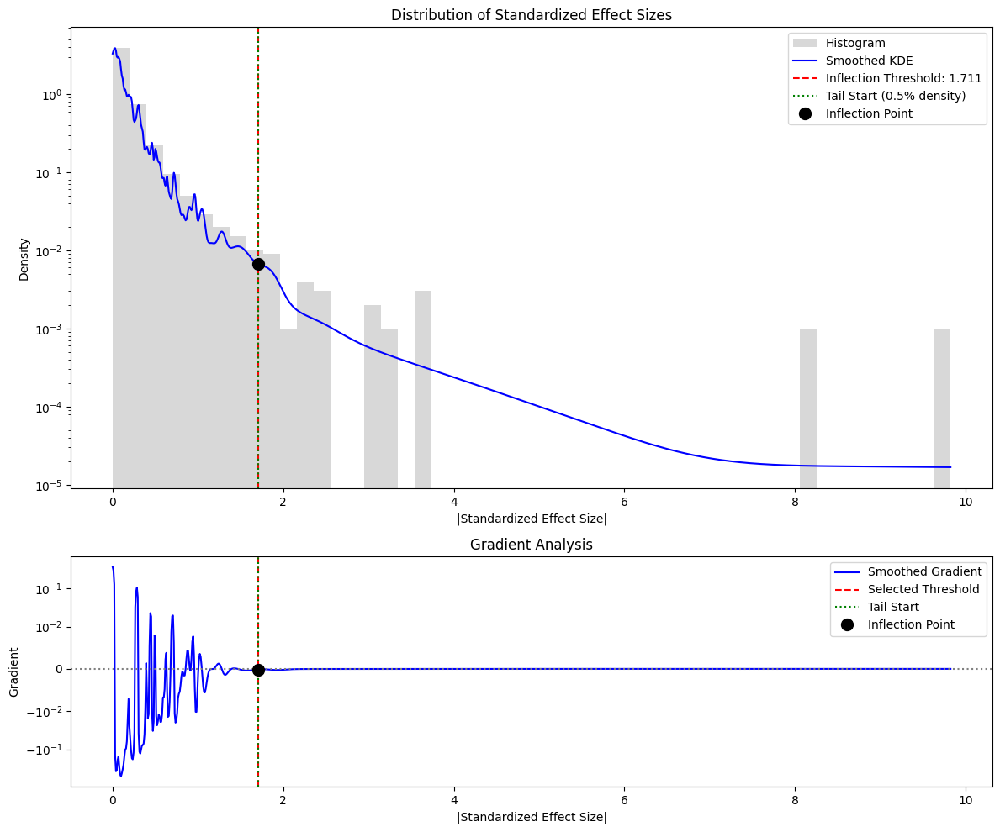

In [23]:
if selector is not None and expr_df is not None and y_series is not None:
    print("Fitting BayesianFeatureSelector...")
    start_time = time.time()
    # Fit the selector using the prepared DataFrame and Series
    selector.fit(expr_df, y_series)
    end_time = time.time()
    print(f"Feature selection fitting finished in {end_time - start_time:.2f} seconds.")
else:
    print("Skipping feature selection fitting: selector, expr_df, or y_series is None.")



Visualizing validation metrics for all cases vs. all controls


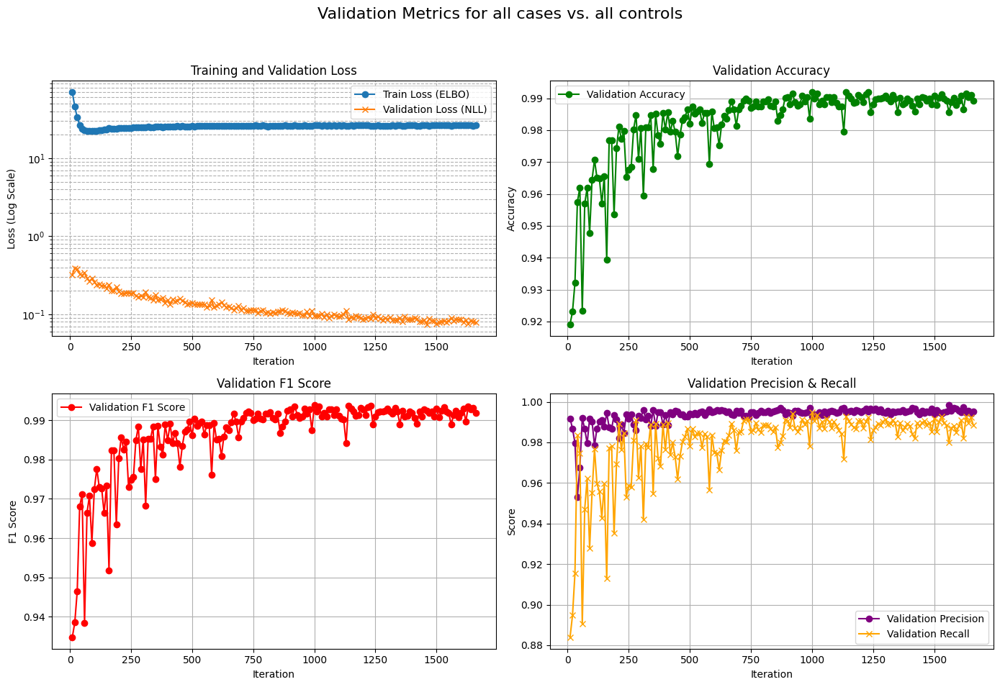

In [25]:
# --- Visualize Validation Metrics ---
import matplotlib.pyplot as plt
import pandas as pd

# Select a case to visualize (make sure this case exists and was successful)
validation_data = selector.validation_results_

if validation_data:
    # Convert list of dictionaries to DataFrame
    val_df = pd.DataFrame(validation_data)

    if not val_df.empty and 'iteration' in val_df.columns:
        print(f"\nVisualizing validation metrics for all cases vs. all controls")

        fig, axes = plt.subplots(2, 2, figsize=(14, 10)) # Create a 2x2 grid of plots
        fig.suptitle(f'Validation Metrics for all cases vs. all controls', fontsize=16)

        # Plot 1: Losses
        plot_loss = ('train_loss (ELBO)' in val_df.columns or 'val_loss (NLL)' in val_df.columns)
        
        if 'train_loss (ELBO)' in val_df.columns:
            axes[0, 0].plot(val_df['iteration'], val_df['train_loss (ELBO)'], label='Train Loss (ELBO)', marker='o')
        if 'val_loss (NLL)' in val_df.columns:
            axes[0, 0].plot(val_df['iteration'], val_df['val_loss (NLL)'], label='Validation Loss (NLL)', marker='x')

        if plot_loss:
            axes[0, 0].set_xlabel('Iteration')
            axes[0, 0].set_ylabel('Loss (Log Scale)')
            axes[0, 0].set_yscale('log')
            axes[0, 0].set_title('Training and Validation Loss')
            axes[0, 0].legend()
            axes[0, 0].grid(True, which='both', linestyle='--')
        else:
            axes[0, 0].set_title('Training and Validation Loss (Not Plotted)')
            axes[0, 0].text(0.5, 0.5, 'Loss data not suitable for log scale or not found', horizontalalignment='center', verticalalignment='center', transform=axes[0, 0].transAxes)

        # Plot 2: Accuracy
        if 'val_accuracy' in val_df.columns:
            axes[0, 1].plot(val_df['iteration'], val_df['val_accuracy'], label='Validation Accuracy', marker='o', color='green')
            axes[0, 1].set_xlabel('Iteration')
            axes[0, 1].set_ylabel('Accuracy')
            axes[0, 1].set_title('Validation Accuracy')
            axes[0, 1].legend()
            axes[0, 1].grid(True)
        else:
                axes[0, 1].set_title('Validation Accuracy (Not Available)')
                axes[0, 1].text(0.5, 0.5, 'Data not found', horizontalalignment='center', verticalalignment='center', transform=axes[0, 1].transAxes)


        # Plot 3: F1 Score
        if 'val_f1' in val_df.columns:
            axes[1, 0].plot(val_df['iteration'], val_df['val_f1'], label='Validation F1 Score', marker='o', color='red')
            axes[1, 0].set_xlabel('Iteration')
            axes[1, 0].set_ylabel('F1 Score')
            axes[1, 0].set_title('Validation F1 Score')
            axes[1, 0].legend()
            axes[1, 0].grid(True)
        else:
                axes[1, 0].set_title('Validation F1 Score (Not Available)')
                axes[1, 0].text(0.5, 0.5, 'Data not found', horizontalalignment='center', verticalalignment='center', transform=axes[1, 0].transAxes)

        # Plot 4: Precision and Recall (Optional, if present)
        if 'val_precision' in val_df.columns and 'val_recall' in val_df.columns:
            axes[1, 1].plot(val_df['iteration'], val_df['val_precision'], label='Validation Precision', marker='o', color='purple')
            axes[1, 1].plot(val_df['iteration'], val_df['val_recall'], label='Validation Recall', marker='x', color='orange')
            axes[1, 1].set_xlabel('Iteration')
            axes[1, 1].set_ylabel('Score')
            axes[1, 1].set_title('Validation Precision & Recall')
            axes[1, 1].legend()
            axes[1, 1].grid(True)
        else:
                axes[1, 1].set_title('Validation Precision & Recall (Not Available)')
                axes[1, 1].text(0.5, 0.5, 'Data not found', horizontalalignment='center', verticalalignment='center', transform=axes[1, 1].transAxes)


        plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to prevent title overlap
        plt.show()

    else:
        print(f"Validation data for all cases vs. all controls is empty or missing 'iteration' column.")
else:
    print(f"No 'validation_results' found for all cases vs. all controls")


In [179]:
if selector is not None and hasattr(selector, 'selected_features_'):
    selected_features = selector.selected_features_
    print(f"Selected {len(selected_features)} features.")
    # Optional: Display the selected feature names
    # print(selected_features)

    # You might also want to access the feature statistics table if generated
    if hasattr(selector, 'feature_stats'):
         feature_stats_df = selector.feature_stats
         print("Feature statistics table generated.")
         # print(feature_stats_df.head())
    if hasattr(selector, 'tail_fig'):
         # Display the figure if desired and not logged to mlflow
         # from IPython.display import display
         # display(selector.tail_fig)
         pass # Figure is available in selector.tail_fig
else:
    print("Skipping feature extraction: selector not fitted or 'selected_features_' attribute missing.")
    selected_features = None
    feature_stats_df = None

Selected 29 features.
Feature statistics table generated.


In [27]:
selector.feature_stats.to_csv('feature_stats.csv')

In [26]:
# Assuming 'selector' is your fitted BayesianFeatureSelector instance
# Plot histogram of predicted probabilities, colored by the true label
fig = px.histogram(selector.best_validation_sample_details_,
                   x='predicted_probability',
                   color='true_label',
                   log_y=True,
                   nbins=100, # Adjust number of bins as needed
                   title='Distribution of Predicted Probabilities on Best Validation Set',
                   labels={'predicted_probability': 'Predicted Probability', 'true_label': 'True Label'})
fig.show()

# Or, color by whether the prediction was correct
fig_correct = px.histogram(selector.best_validation_sample_details_,
                           x='predicted_probability',
                           color='is_correct',
                           nbins=100,
                           log_y=True,
                           title='Distribution of Predicted Probabilities (Colored by Correctness)',
                           labels={'predicted_probability': 'Predicted Probability', 'is_correct': 'Prediction Correct?'})
fig_correct.show()

# A histogram of 'is_correct' (effectively accuracy per sample) would just be two bars (True/False)
# fig_acc = px.histogram(selector.best_validation_sample_details_, x='is_correct', color='true_label')
# fig_acc.show()

# Generate perturbation conditions

In [90]:
def generate_perturbations(genes_iterable, generate_double_perts=True):
    # Prepare a list of all perturbation conditions
    single_perts = [[gene] for gene in genes_iterable]
    if generate_double_perts:
        double_perts = [(gene1, gene2) for gene1, gene2 in combinations(genes_iterable, 2)]
    else:
        double_perts = []
    all_perts = (single_perts + double_perts)  # Replicate each perturbation three times

    return all_perts

# perturbations_wellClassified_features = generate_perturbations(selector.selected_features_, generate_double_perts=False)

In [91]:
perturbations_all_single = generate_perturbations(gears_adata.var_names, generate_double_perts=False)

# Initialize pretrained GEARS model & dataloader

In [92]:
# Download pretrained GEARS model (Norman et al. 2019 dataset)
dataverse_download('https://dataverse.harvard.edu/api/access/datafile/10457098', f'{gears_data_dir}/model.zip')

# Extract and set up model directory
with ZipFile(f'{gears_data_dir}/model.zip', 'r') as zip:
    zip.extractall(path = f'{gears_data_dir}/model')
del zip

# Load pretrained model config
pretrainedConfig = pickle.loads(open(f'{gears_data_dir}/model/model_ckpt/config.pkl', 'rb').read())
pretrainedConfig

Found local copy...


{'hidden_size': 64,
 'num_go_gnn_layers': 1,
 'num_gene_gnn_layers': 1,
 'decoder_hidden_size': 16,
 'num_similar_genes_go_graph': 20,
 'num_similar_genes_co_express_graph': 20,
 'coexpress_threshold': 0.4,
 'uncertainty': False,
 'uncertainty_reg': 1,
 'direction_lambda': 0.1,
 'G_go': tensor([[   0,    0,    0,  ..., 9649, 9669, 9693],
         [   0,  126,  514,  ..., 9649, 9669, 9693]]),
 'G_go_weight': tensor([1.0000, 0.1739, 0.1600,  ..., 1.0000, 1.0000, 1.0000]),
 'G_coexpress': tensor([[   0,    1,    2,  ..., 5050, 5052, 5053],
         [   0,    1,    2,  ..., 5050, 5052, 5053]]),
 'G_coexpress_weight': tensor([1.0000, 0.9998, 0.9998,  ..., 1.0000, 1.0000, 1.0000]),
 'device': 'cuda:6',
 'num_genes': 5054,
 'num_perts': 9853,
 'no_perturb': False}

In [93]:
# GEARS does not define the nonzero gene idx for unperturbed test data, so we need to do it manually

def adata_define_nonzero_gene_idx(adata):
    import scipy.sparse as sp
    # Use scipy.sparse.find to get non-zero entries (rows, cols, values)
    _, non_zero_cols, _ = sp.find(adata.X)
    # Get unique columns with non-zero entries
    unique_non_zero_cols = np.unique(non_zero_cols)
    # Map these indices to gene names
    non_zeros_gene_idx = {adata.var_names[idx]: idx for idx in unique_non_zero_cols}
    # Store the result
    adata.uns['non_zeros_gene_idx'] = non_zeros_gene_idx

In [94]:
from gears import PertData

gears_pertdata = PertData(f'{gears_data_dir}/aml_scrna_embeddings')
gears_adata.X = csr_matrix(gears_adata.X)
adata_define_nonzero_gene_idx(gears_adata)

# set the nonperturbation condition to all cells
gears_adata.obs['condition'] = 'ctrl'
# Convert condition boolean mask to numpy array
gears_adata.obs['condition'] = gears_adata.obs['condition'].astype('str')

gears_pertdata.new_data_process(dataset_name='aml_scrna_embeddings', adata=gears_adata, skip_calc_de=True)
gears_pertdata.prepare_split(split='no_split')

gears_pertdata.dataloader = gears_pertdata.get_dataloader(batch_size=1)


Found local copy...


Found local copy...
Creating pyg object for each cell in the data...
Creating dataset file...
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.14it/s]
Done!
Saving new dataset pyg object at GEARS/GEARS_data/aml_scrna_embeddings/aml_scrna_embeddings/data_pyg/cell_graphs.pkl
Done!
Local copy of split is detected. Loading...
Done!
Creating dataloaders....
Dataloaders created...


here1


In [49]:
from gears import GEARS
import torch

import pandas as pd
import numpy as np
from scipy.sparse import issparse
from tqdm.notebook import tqdm # Use notebook tqdm

# Define the function with mapping parameter
def check_available_perturbations(gears_wrapper, perturbations_to_predict, mapping):
    """
    Check which genes from perturbations_to_predict (assumed symbols) are
    available in GEARS pert list (assumed Ensembl IDs). Uses the provided mapping.

    Args:
        gears_wrapper: GEARS model instance
        perturbations_to_predict: List of perturbations (gene symbols) to check
        mapping (dict): Dictionary mapping gene symbols to Ensembl IDs.

    Returns:
        tuple: (available_symbols, unavailable_symbols, available_symbol_to_ensembl)
            available_symbols (list): List of gene symbols found in mapping and GEARS pert_list.
            unavailable_symbols (list): List of gene symbols not found or not available.
            available_symbol_to_ensembl (dict): Mapping from available symbols to their Ensembl IDs.
    """
    available_symbols = []
    unavailable_symbols = []
    available_symbol_to_ensembl = {}

    # Get the set of Ensembl IDs from the GEARS model
    # Ensure pert_list exists and is not empty
    if not hasattr(gears_wrapper, 'pert_list') or not gears_wrapper.pert_list:
        print("Warning: gears_wrapper.pert_list is empty or does not exist.")
        pert_list_ensembl = set()
    else:
        pert_list_ensembl = set(gears_wrapper.pert_list)
        # Quick check: are these likely Ensembl IDs?
        if pert_list_ensembl: # Check if set is not empty
             sample_pert = next(iter(pert_list_ensembl))
             if not isinstance(sample_pert, str) or not sample_pert.startswith('ENSG'):
                  print(f"Warning: GEARS pert_list might not contain Ensembl IDs (e.g., {sample_pert}). Assuming they are Ensembl for now.")

    # Flatten the perturbations list and get unique gene symbols
    all_symbols = set()
    for pert in perturbations_to_predict:
        if isinstance(pert, (list, tuple)):
            all_symbols.update(pert)
        elif isinstance(pert, str): # Make sure it's a string symbol
            all_symbols.add(pert)
        # else: ignore non-string entries if any

    if not mapping:
        print("Warning: No mapping dictionary provided. Cannot convert symbols to Ensembl IDs.")
        # Treat all symbols as unavailable if mapping is missing
        unavailable_symbols = list(all_symbols)
    else:
        # Check each symbol
        for symbol in all_symbols:
            ensembl_id = mapping.get(symbol)
            if ensembl_id and ensembl_id in pert_list_ensembl:
                available_symbols.append(symbol)
                available_symbol_to_ensembl[symbol] = ensembl_id
            else:
                unavailable_symbols.append(symbol)
                if symbol in mapping and not ensembl_id:
                     # This case shouldn't happen if mapping filters None, but good practice
                     print(f"Symbol '{symbol}' mapped to None.")
                elif symbol not in mapping:
                     print(f"Symbol '{symbol}' not found in mapping.")
                elif ensembl_id and ensembl_id not in pert_list_ensembl:
                     print(f"Symbol '{symbol}' (Ensembl: {ensembl_id}) mapped but not in GEARS pert_list.")


    print(f"\nGene Availability Check (Symbols vs Ensembl):")
    print(f"Available symbols (mapped to Ensembl IDs found in GEARS pert_list): {len(available_symbols)}/{len(all_symbols)}")
    # Limit printing long lists
    print("\nAvailable symbols:")
    print(available_symbols[:20], "..." if len(available_symbols) > 20 else "")
    print("\nUnavailable symbols:")
    print(unavailable_symbols[:20], "..." if len(unavailable_symbols) > 20 else "")

    return available_symbols, unavailable_symbols, available_symbol_to_ensembl


def run_inference(aml_data, perturbations_to_predict, mapping, gears_data_dir):
    """
    Run GEARS inference using existing batch size configuration.
    Handles gene ID conversion using the provided mapping.

    Args:
        aml_data: Prepared PertData object (assumes var_names are Ensembl IDs)
        perturbations_to_predict: List of perturbations (gene symbols) to predict
        mapping (dict): Dictionary mapping gene symbols to Ensembl IDs.
        gears_data_dir (str): Path to the GEARS data directory containing the model.

    Returns:
        tuple: (predictions_dict, baseline_metrics, filtered_perturbations_symbols, gears_wrapper)
            predictions_dict (dict): Dictionary of predictions keyed by Ensembl ID (or tuple).
            baseline_metrics (pd.DataFrame): DataFrame with baseline prediction metrics per cell.
            filtered_perturbations_symbols (list): List of available perturbations (original symbols format).
            gears_wrapper (GEARS): The loaded GEARS model instance.
    """
    from scipy.stats import pearsonr, spearmanr
    from types import MethodType
    import pandas as pd
    import numpy as np
    from scipy.sparse import issparse
    from tqdm.notebook import tqdm

    # Ensure mapping is provided
    if mapping is None:
        raise ValueError("Mapping dictionary is required for run_inference.")

    n_cells = len(aml_data.adata)
    # Safely access batch_size
    batch_size = 64 # Default fallback
    try:
        # Ensure dataloader exists and has the key
        if hasattr(aml_data, 'dataloader') and aml_data.dataloader and 'test_loader' in aml_data.dataloader:
             batch_size = aml_data.dataloader['test_loader'].batch_size
             print(f"Running predictions for {n_cells} cells using batch_size={batch_size}")
        else:
             print(f"Warning: Could not determine batch size from aml_data.dataloader. Using default batch_size={batch_size}.")
    except Exception as e:
        print(f"Warning: Error accessing batch size ({e}). Using default batch_size={batch_size}.")

    # Determine device
    if torch.cuda.is_available():
        device = 'cuda'
    elif hasattr(torch.backends, 'mps') and torch.backends.mps.is_available():
        device = 'mps'
    else:
        device = 'cpu'
    print(f"Using device: {device}")

    gears_wrapper = GEARS(
        aml_data,
        device=device,
        weight_bias_track=False
    )

    # Load pretrained model
    model_path = f'{gears_data_dir}/model/model_ckpt'
    try:
        print(f"Loading pretrained model from: {model_path}")
        gears_wrapper.load_pretrained(model_path)
    except FileNotFoundError:
         raise FileNotFoundError(f"Could not load pretrained model from {model_path}. Check path.")
    except Exception as e:
        raise RuntimeError(f"Error loading pretrained model: {e}")

    gears_wrapper.model.eval()

    # Check available perturbations using symbols and the mapping
    filtered_perturbations_symbols = []
    if perturbations_to_predict:
        available_symbols, unavailable_symbols, available_symbol_to_ensembl = check_available_perturbations(
            gears_wrapper, perturbations_to_predict, mapping
        )

        # Filter original perturbations list (symbols) to retain structure (singles/combinations)
        # while ensuring all components are available symbols.
        for pert in perturbations_to_predict:
            is_valid = True
            if isinstance(pert, (list, tuple)):
                if not all(gene in available_symbols for gene in pert):
                     is_valid = False
            elif isinstance(pert, str):
                if pert not in available_symbols:
                     is_valid = False
            else:
                is_valid = False # Ignore non-string/list/tuple perturbations

            if is_valid:
                 filtered_perturbations_symbols.append(pert)

        if filtered_perturbations_symbols:
            print(f"\nProceeding with {len(filtered_perturbations_symbols)} valid perturbations (symbols):")
            print(filtered_perturbations_symbols[:10], "..." if len(filtered_perturbations_symbols) > 10 else "")
        else:
            print("Warning: No valid perturbations available for prediction after checking mapping and availability!")
    else:
        print("No perturbations provided. Running baseline predictions only.")

    # Get cell IDs and original expression (ensure it's dense)
    cell_ids = aml_data.adata.obs_names
    if hasattr(aml_data.adata, 'X'):
        original_expression = aml_data.adata.X.toarray() if issparse(aml_data.adata.X) else np.asarray(aml_data.adata.X)
        print(f"Original expression shape: {original_expression.shape}")
    else:
        raise AttributeError("aml_data.adata does not have an 'X' attribute.")

    # --- Prediction ---
    predictions_dict = {} # Store predictions keyed by Ensembl ID (or tuple)
    baseline_preds_list = [] # Collect baseline prediction arrays

    print("\nRunning Predictions...")
    with torch.no_grad():
        # Baseline prediction (empty list represents control)
        print("Predicting baseline (no perturbation)...")
        for i in tqdm(range(0, n_cells, batch_size), desc="Baseline predictions"):
            batch_end = min(i + batch_size, n_cells)
            batch_size_actual = batch_end - i
            # Pass empty list for control for the number of cells in the batch
            try:
                batch_preds_dict = gears_wrapper.predict([[] for _ in range(batch_size_actual)])
                if '' in batch_preds_dict:
                    # Ensure the prediction array is 2D (batch_size, n_genes)
                    pred_array = batch_preds_dict['']
                    if pred_array.ndim == 1:
                        pred_array = pred_array.reshape(1, -1) # Reshape from (n_genes,) to (1, n_genes) if batch_size=1
                    baseline_preds_list.append(pred_array)
                else:
                    print(f"Warning: Baseline key '' not found in prediction output for batch {i//batch_size}. Output keys: {list(batch_preds_dict.keys())}")
                    n_genes = original_expression.shape[1]
                    baseline_preds_list.append(np.full((batch_size_actual, n_genes), np.nan))
            except Exception as e:
                print(f"Error during baseline prediction batch {i//batch_size}: {e}")
                n_genes = original_expression.shape[1]
                baseline_preds_list.append(np.full((batch_size_actual, n_genes), np.nan))

        # Concatenate baseline predictions across batches if list is not empty
        if baseline_preds_list:
            baseline_preds = np.concatenate(baseline_preds_list, axis=0)
            predictions_dict['no_perturbation'] = baseline_preds
            print(f"Baseline prediction shape: {baseline_preds.shape}")
        else:
            print("Warning: No baseline predictions were generated.")
            predictions_dict['no_perturbation'] = np.full(original_expression.shape, np.nan) # Placeholder

        # Only run perturbation predictions if we have valid perturbations
        if filtered_perturbations_symbols:
            # Convert the filtered *symbol* perturbations to *Ensembl IDs* for prediction
            print(f"Predicting for {len(filtered_perturbations_symbols)} perturbations...")
            for pert in tqdm(filtered_perturbations_symbols, desc="Perturbation predictions"):
                pert_preds_list = []
                
                # Convert symbols to Ensembl IDs for GEARS
                if isinstance(pert, (list, tuple)):
                    # Map each symbol in the combo to its Ensembl ID
                    pert_ensembl = tuple(available_symbol_to_ensembl[symbol] for symbol in pert)
                elif isinstance(pert, str):
                    # Map the single symbol to its Ensembl ID
                    pert_ensembl = available_symbol_to_ensembl[pert]
                
                # Use original perturbation as key for results
                pert_key = pert

                for i in range(0, n_cells, batch_size):
                    batch_end = min(i + batch_size, n_cells)
                    batch_size_actual = batch_end - i
                    # Provide the same perturbation for all cells in the batch
                    batch_input = [pert_ensembl] * batch_size_actual
                    try:
                        batch_preds_dict = gears_wrapper.predict(batch_input)
                        # Check if the key exists in the output
                        if pert_ensembl in batch_preds_dict:
                            pert_preds_list.append(batch_preds_dict[pert_ensembl])
                        elif isinstance(pert_ensembl, tuple) and str(pert_ensembl) in batch_preds_dict:
                            # Try string conversion of tuple key as fallback              
                            pert_preds_list.append(batch_preds_dict[str(pert_ensembl)])
                        else:
                            print(f"Warning: Perturbation key '{pert_ensembl}' not found in prediction output for batch {i//batch_size}. Output keys: {list(batch_preds_dict.keys())[:5]}...")
                            n_genes = original_expression.shape[1]
                            pert_preds_list.append(np.full((batch_size_actual, n_genes), np.nan))
                    except Exception as e:
                        print(f"Error during prediction for {pert_ensembl}, batch {i//batch_size}: {e}")
                        n_genes = original_expression.shape[1]
                        pert_preds_list.append(np.full((batch_size_actual, n_genes), np.nan))

                # Concatenate predictions for this perturbation if list is not empty
                if pert_preds_list:
                    predictions_dict[pert_key] = np.concatenate(pert_preds_list, axis=0)
                else:
                    print(f"Warning: No predictions generated for perturbation {pert_key}.")
                    predictions_dict[pert_key] = np.full(original_expression.shape, np.nan) # Placeholder

    # --- Analysis ---
    print("\nCalculating Baseline Metrics...")
    baseline_metrics = pd.DataFrame(index=cell_ids)
    
    # Ensure baseline predictions exist and match shape before calculating metrics
    if 'no_perturbation' in predictions_dict and predictions_dict['no_perturbation'].shape == original_expression.shape:
        baseline_preds = predictions_dict['no_perturbation']
        # Calculate MSE, handle potential NaNs from prediction errors
        baseline_metrics['mse'] = np.nanmean((original_expression - baseline_preds) ** 2, axis=1)

        # Calculate correlations safely, ignoring NaNs and checking for zero variance
        pearson_corr = []
        spearman_corr = []
        for i in range(n_cells):
            orig_row = original_expression[i]
            pred_row = baseline_preds[i]
            # Filter out NaNs for correlation calculation
            valid_mask = ~np.isnan(orig_row) & ~np.isnan(pred_row)
            if np.sum(valid_mask) < 2: # Need at least 2 valid points for correlation
                 pearson_corr.append(np.nan)
                 spearman_corr.append(np.nan)
                 continue

            orig_valid = orig_row[valid_mask]
            pred_valid = pred_row[valid_mask]

            # Check standard deviation
            if np.std(orig_valid) > 1e-9 and np.std(pred_valid) > 1e-9:
                 pearson_corr.append(pearsonr(orig_valid, pred_valid)[0])
                 spearman_corr.append(spearmanr(orig_valid, pred_valid)[0])
            else:
                 pearson_corr.append(np.nan)
                 spearman_corr.append(np.nan)

        baseline_metrics['pearson'] = pearson_corr
        baseline_metrics['spearman'] = spearman_corr

        # Add percentile rankings, handle NaNs
        for metric in ['mse', 'pearson', 'spearman']:
             try:
                 baseline_metrics[f'{metric}_percentile'] = baseline_metrics[metric].rank(pct=True, na_option='keep')
             except TypeError: # Older pandas might not have na_option
                 baseline_metrics[f'{metric}_percentile'] = baseline_metrics[metric].rank(pct=True)

        print("\nBaseline Prediction Performance:")
        print(f"Mean MSE: {baseline_metrics['mse'].mean():.4f} (±{baseline_metrics['mse'].std():.4f})")
        print(f"Mean Pearson: {baseline_metrics['pearson'].mean():.4f} (±{baseline_metrics['pearson'].std():.4f})")
        print(f"Mean Spearman: {baseline_metrics['spearman'].mean():.4f} (±{baseline_metrics['spearman'].std():.4f})")
    else:
         print("Warning: Baseline predictions missing or shape mismatch. Cannot calculate metrics.")
         # Fill metrics dataframe with NaNs
         for metric in ['mse', 'pearson', 'spearman', 'mse_percentile', 'pearson_percentile', 'spearman_percentile']:
             baseline_metrics[metric] = np.nan

    # Return the predictions dictionary, metrics, available symbols, and the wrapper
    return predictions_dict, baseline_metrics, filtered_perturbations_symbols, gears_wrapper

In [36]:
_, baseline_metrics, filtered_perturbations, gears_wrapper = run_inference(
    gears_pertdata, [], ensembl_gene_mapping['ensembl_to_symbol'], gears_data_dir)

# Find cells with best/worst predictions
best_predicted = baseline_metrics.nsmallest(5, 'mse')
worst_predicted = baseline_metrics.nlargest(5, 'mse')

# Analyze cells with different baseline prediction quality
good_cells = baseline_metrics[baseline_metrics['mse_percentile'] < 0.1].index
poor_cells = baseline_metrics[baseline_metrics['mse_percentile'] > 0.9].index

Running predictions for 17749 cells using batch_size=1
Using device: cuda
Loading pretrained model from: GEARS/GEARS_data/model/model_ckpt
No perturbations provided. Running baseline predictions only.
Original expression shape: (17749, 5054)

Running Predictions...
Predicting baseline (no perturbation)...


Baseline predictions:   0%|          | 0/17749 [00:00<?, ?it/s]

Baseline prediction shape: (17749, 5054)

Calculating Baseline Metrics...

Baseline Prediction Performance:
Mean MSE: 0.0647 (±0.0188)
Mean Pearson: 0.7428 (±0.0865)
Mean Spearman: 0.4279 (±0.0771)


In [67]:
baseline_metrics.to_csv(f'{gears_data_dir}/GEARS_unperturbed_cell_metrics.csv')

# Get the metrics for good cells
good_cells_metrics = baseline_metrics.loc[good_cells]

# Find the worst performing cell among good cells (highest MSE)
worst_of_good = good_cells_metrics.nlargest(1, 'mse')

print("Metrics for worst-performing cell among good cells:")
print(f"Cell ID: {worst_of_good.index[0]}")
print(f"MSE: {worst_of_good['mse'].iloc[0]:.6f}")
print(f"Pearson correlation: {worst_of_good['pearson'].iloc[0]:.6f}")
print(f"Spearman correlation: {worst_of_good['spearman'].iloc[0]:.6f}")
print(f"MSE percentile (overall): {worst_of_good['mse_percentile'].iloc[0]:.6f}")

Metrics for worst-performing cell among good cells:
Cell ID: AML921A-D0_CGAGCAGCTTCA
MSE: 0.041610
Pearson correlation: 0.866836
Spearman correlation: 0.477496
MSE percentile (overall): 0.099949


In [38]:
best_of_good = good_cells_metrics.nsmallest(1, 'mse')

print("Metrics for best-performing cell among good cells:")
print(f"Cell ID: {best_of_good.index[0]}")
print(f"MSE: {best_of_good['mse'].iloc[0]:.6f}")
print(f"Pearson correlation: {best_of_good['pearson'].iloc[0]:.6f}")
print(f"Spearman correlation: {best_of_good['spearman'].iloc[0]:.6f}")
print(f"MSE percentile (overall): {best_of_good['mse_percentile'].iloc[0]:.6f}")

Metrics for best-performing cell among good cells:
Cell ID: AML1012-D0_GAAAACCTGTTN
MSE: 0.015691
Pearson correlation: 0.919463
Spearman correlation: 0.656021
MSE percentile (overall): 0.000056


In [39]:
len(good_cells)

1774

# Perturbation

In [60]:
# Load the autoreload extension to automatically reload modules
%load_ext autoreload
# Configure autoreload to reload all modules before executing code (if changed)
%autoreload 2

import torch
import GEARS.perturbation_evaluator as perturbation_evaluator

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [42]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Extract cell states for all these good cells.
sorted_adata = gears_pertdata.adata[good_cells].copy()

# Convert sorted_adata to a dense array so that cells can be sorted by their overall expression.
if issparse(sorted_adata.X):
    X_array = sorted_adata.X.toarray()
else:
    X_array = sorted_adata.X

# Sort the cells by total expression (row sum)
X_tensor = torch.tensor(X_array)
_, sort_idx = torch.sort(X_tensor.sum(dim=1), descending=False)

# Reorder the cells by sorted indices
sorted_adata = sorted_adata[sort_idx.numpy()]

# Separate the good cells into normal and malignant subsets based on 'PredictionRefined'
healthy_adata = sorted_adata[sorted_adata.obs['PredictionRefined'] == 'normal']
cancer_adata = sorted_adata[sorted_adata.obs['PredictionRefined'] == 'malignant']

In [43]:
healthy_adata.obs.groupby('sample_id').size()

sample_id
BM1          1
BM3        117
BM4         85
BM5-34p    227
dtype: int64

In [44]:
cancer_adata.obs.groupby('sample_id').size()

sample_id
AML1012-D0    227
AML210A-D0     29
AML328-D0      93
AML329-D0      41
AML419A-D0     26
AML420B-D0     52
AML475-D0       9
AML556-D0      93
AML707B-D0     89
AML870-D0      28
AML916-D0     127
AML921A-D0    530
dtype: int64

In [45]:
import pickle
import pandas as pd
from datetime import datetime

def save_evaluation_results(evaluation_results, filename_prefix="evaluation_results", save_pickle=False):
    """
    Save evaluation results to CSV (and optionally as a pickle file).

    Parameters
    ----------
    evaluation_results : list
        A list of evaluation result objects. Each result should have at least the following:
            - result.perturbation : an object (converted to a string for saving)
            - result.scores : a dict with keys:
                   'baseline_classifier', 'classifier', 'wasserstein', 'stability', 'density', 'total'
    filename_prefix : str, optional
        Prefix for the output filenames (default: "evaluation_results").
    save_pickle : bool, optional
        Whether to also save the raw evaluation results as a pickle file (default: False).

    Returns
    -------
    tuple:
        csv_filename (str): Filename of the saved CSV file.
        pickle_filename (str or None): Filename of the saved pickle file if save_pickle is True; otherwise, None.
    """
    # Create a timestamp that will be appended to the filename
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

    # Prepare a list of dictionaries from the results
    results_list = []
    for result in evaluation_results:
        result_dict = {
            'perturbation': str(result.perturbation),
            'baseline_classifier': result.scores.get('baseline_classifier', None),
            'classifier_score': result.scores.get('classifier', None),
            'wasserstein': result.scores.get('wasserstein', None),
            'stability': result.scores.get('stability', None),
            'density': result.scores.get('density', None),
            'total_score': result.scores.get('total', None)
        }
        results_list.append(result_dict)

    # Convert the list to a DataFrame
    results_df = pd.DataFrame(results_list)

    # Save the DataFrame to a CSV file
    csv_filename = f"{filename_prefix}_{timestamp}.csv"
    results_df.to_csv(csv_filename, index=False)

    # Optionally, also save the raw evaluation results as a pickle file
    pickle_filename = None
    if save_pickle:
        pickle_filename = f"{filename_prefix}_{timestamp}.pkl"
        with open(pickle_filename, "wb") as f:
            pickle.dump(evaluation_results, f)

    # Report the saved filenames
    print("Results saved to:")
    if save_pickle:
        print(f"1. {pickle_filename}")
        print(f"2. {csv_filename}")
    else:
        print(csv_filename)

    return csv_filename, pickle_filename

In [46]:
def extract_perturbations_by_classifier_change(evaluation_results, scenario="healthy_to_aml"):
    """
    Extract perturbations from evaluation results based on the change in classifier score relative to baseline.
    
    This version expects evaluation_results to be a pandas DataFrame (for example, loaded from the CSV file).
    
    Parameters
    ----------
    evaluation_results : pd.DataFrame
        A DataFrame of evaluation results with at least the following columns:
            - 'perturbation'
            - 'baseline_classifier'
            - 'classifier'
    scenario : str, optional
        The scenario to use for selecting perturbations. Options are:
          - "healthy_to_aml": Select perturbations that increase the classifier score over the baseline
                              (i.e. push healthy cells into an AML-like state).
          - "aml_to_healthy": Select perturbations that decrease the classifier score below the baseline
                              (i.e. push AML cells toward a healthy state).
    
    Returns
    -------
    selected_perturbations : list
        A list of perturbation identifiers (as they were saved in the CSV) that satisfy the condition.
    """
    import pandas as pd

    if scenario not in ["healthy_to_aml", "aml_to_healthy"]:
        raise ValueError("Scenario must be one of 'healthy_to_aml' or 'aml_to_healthy'.")

    selected_perturbations = []
    for idx, row in evaluation_results.iterrows():
        baseline = row.get('baseline_classifier')
        new_score = row.get('classifier')
        # Skip if we cannot find either score (or if they're NaN)
        if pd.isna(baseline) or pd.isna(new_score):
            continue

        if scenario == "healthy_to_aml" and new_score > 0.5:
            selected_perturbations.append(row['perturbation'])
        elif scenario == "aml_to_healthy" and new_score < 0.5:
            selected_perturbations.append(row['perturbation'])

    return selected_perturbations[:100]

# One-Vs-Rest Feature Selection

In [238]:
# Cell 1: Setup and Imports
%load_ext autoreload
%autoreload 2

import time
import pandas as pd
import numpy as np
import anndata as ad
from feature_selection import BayesianFeatureSelector
import logging
import torch # Already imported likely
from scipy.sparse import issparse # Already imported likely

# --- Configuration ---
SELECTOR_PARAMS = {
    'num_iterations': 2000, 'lr': 1e-3, 'credible_interval': 0.9,
    'num_samples': 1000, 'batch_size': 256, 'verbose': True,
    'patience': 20, 'max_features': 200, 'k_neighbors': 10,
    'smooth_window': 1, 'base_cumulative_density_threshold': 0.005,
    'base_sensitivity': 0.005, 'use_mlflow': False,
    'checkpoint_path': 'ovr_checkpoints/'
}
CASE_TYPE_LABEL = 'case' # Adjust if your label for cases is different
CONTROL_TYPE_LABEL = 'healthy' # Adjust if your label for controls is different

logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

# Ensure device is set (likely done already)
device = 'cuda' if torch.cuda.is_available() else 'cpu'
logger.info(f"Using device: {device}") # Log the device being used by PyTorch

print("Setup complete. Configuration loaded.")


2025-04-30 02:09:44,132 - INFO - Using device: cuda


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Setup complete. Configuration loaded.


In [239]:
# Cell 2: Prepare Sample Keys and Control Data Indices
# Now operates on 'adata' which points to the pre-processed 'sorted_adata'
if 'sorted_adata' in locals():
    logger.info("Preparing sample keys and control indices from the provided adata...")

    # Extract unique sample prefixes from the index
    # Ensure this logic matches your index format (e.g., delimiter is '_')
    try:
        sorted_adata.obs['sample_prefix'] = sorted_adata.obs.index.str.split('_').str[0]
    except Exception as e:
        logger.error(f"Failed to extract 'sample_prefix' from index. Check index format. Error: {e}")
        raise

    unique_prefixes = sorted_adata.obs['sample_prefix'].unique()

    # Map prefixes to sample types using the 'sample_type' column
    # Assumes 'sample_type' column exists (checked in the previous bridge cell)
    prefix_to_type = sorted_adata.obs.groupby('sample_prefix')['sample_type'].first()

    # Identify case and control keys based on specified labels
    all_keys = prefix_to_type.index
    case_keys = all_keys[prefix_to_type == CASE_TYPE_LABEL].tolist()
    control_keys = all_keys[prefix_to_type == CONTROL_TYPE_LABEL].tolist()

    logger.info(f"Found {len(case_keys)} case keys: {case_keys}")
    logger.info(f"Found {len(control_keys)} control keys: {control_keys}")

    if not control_keys:
        logger.warning("No control keys found. OvR requires control samples.")
        control_indices = pd.Index([])
    elif not case_keys:
        logger.warning("No case keys found. OvR requires case samples.")
        control_indices = sorted_adata.obs.index[sorted_adata.obs['sample_prefix'].isin(control_keys)] # Still useful perhaps
    else:
        # Get indices for all control cells (do this once)
        control_indices = sorted_adata.obs.index[sorted_adata.obs['sample_prefix'].isin(control_keys)]
        logger.info(f"Found {len(control_indices)} total cells belonging to control samples.")

    # Optional: Clean up temporary column if not needed later
    # del adata.obs['sample_prefix']

else:
    logger.warning("Skipping key preparation: 'adata' object not found.")
    case_keys = []
    control_keys = []
    control_indices = pd.Index([])


2025-04-30 02:09:44,927 - INFO - Preparing sample keys and control indices from the provided adata...
2025-04-30 02:09:44,977 - INFO - Found 12 case keys: ['AML1012-D0', 'AML210A-D0', 'AML328-D0', 'AML329-D0', 'AML419A-D0', 'AML420B-D0', 'AML475-D0', 'AML556-D0', 'AML707B-D0', 'AML870-D0', 'AML916-D0', 'AML921A-D0']
2025-04-30 02:09:44,977 - INFO - Found 4 control keys: ['BM1', 'BM3', 'BM4', 'BM5-34p']
2025-04-30 02:09:44,978 - INFO - Found 422 total cells belonging to control samples.


2025-04-30 02:10:57,442 - INFO - Starting One-vs-Rest feature selection loop...
2025-04-30 02:10:57,443 - INFO - GPU detected. Running feature selection sequentially (n_jobs=1) to avoid GPU memory issues.
2025-04-30 02:10:57,443 - INFO - --- Processing Case: AML1012-D0 ---


2025-04-30 02:10:57,467 - WARNING - Sparse matrix found for AML1012-D0. Converting to dense.
2025-04-30 02:10:57,472 - INFO - Using device: cuda
2025-04-30 02:10:57,472 - INFO - Fitting selector for case AML1012-D0...


Using CUDA (GPU) acceleration.


SVI Iterations:   1%|▋                                                                                          | 15/2000 [00:00<01:51, 17.85it/s]

Iter 10/2000 - ELBO Loss: 164.0438, Val NLL: 0.5582, Val Acc: 0.8931, Val F1: 0.8772


SVI Iterations:   1%|█▏                                                                                         | 25/2000 [00:01<01:49, 17.98it/s]

Iter 20/2000 - ELBO Loss: 157.3627, Val NLL: 0.4345, Val Acc: 0.8931, Val F1: 0.8444


SVI Iterations:   2%|█▋                                                                                         | 36/2000 [00:01<01:46, 18.41it/s]

Iter 30/2000 - ELBO Loss: 151.9523, Val NLL: 0.4030, Val Acc: 0.9618, Val F1: 0.9541


SVI Iterations:   2%|██                                                                                         | 44/2000 [00:02<01:49, 17.89it/s]

Iter 40/2000 - ELBO Loss: 150.1539, Val NLL: 0.3198, Val Acc: 0.9847, Val F1: 0.9804


SVI Iterations:   3%|██▍                                                                                        | 54/2000 [00:03<01:50, 17.64it/s]

Iter 50/2000 - ELBO Loss: 146.3887, Val NLL: 0.2882, Val Acc: 0.9924, Val F1: 0.9905


SVI Iterations:   3%|██▊                                                                                        | 63/2000 [00:03<01:53, 17.01it/s]

Iter 60/2000 - ELBO Loss: 142.1923, Val NLL: 0.2717, Val Acc: 0.9771, Val F1: 0.9714


SVI Iterations:   4%|███▍                                                                                       | 75/2000 [00:04<01:49, 17.57it/s]

Iter 70/2000 - ELBO Loss: 139.4432, Val NLL: 0.2478, Val Acc: 0.9924, Val F1: 0.9905


SVI Iterations:   4%|███▊                                                                                       | 84/2000 [00:04<01:53, 16.94it/s]

Iter 80/2000 - ELBO Loss: 134.9794, Val NLL: 0.2310, Val Acc: 0.9924, Val F1: 0.9905


SVI Iterations:   5%|████▏                                                                                      | 93/2000 [00:05<01:54, 16.66it/s]

Iter 90/2000 - ELBO Loss: 130.3808, Val NLL: 0.2244, Val Acc: 0.9924, Val F1: 0.9903


SVI Iterations:   5%|████▋                                                                                     | 103/2000 [00:06<03:05, 10.23it/s]

Iter 100/2000 - ELBO Loss: 127.8302, Val NLL: 0.1984, Val Acc: 0.9924, Val F1: 0.9905


SVI Iterations:   6%|█████▏                                                                                    | 115/2000 [00:07<02:06, 14.95it/s]

Iter 110/2000 - ELBO Loss: 122.9507, Val NLL: 0.2035, Val Acc: 0.9924, Val F1: 0.9905


SVI Iterations:   6%|█████▌                                                                                    | 124/2000 [00:07<01:58, 15.79it/s]

Iter 120/2000 - ELBO Loss: 120.1885, Val NLL: 0.1939, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   7%|█████▉                                                                                    | 133/2000 [00:08<01:53, 16.46it/s]

Iter 130/2000 - ELBO Loss: 116.8327, Val NLL: 0.2152, Val Acc: 0.9924, Val F1: 0.9905


SVI Iterations:   7%|██████▌                                                                                   | 145/2000 [00:08<01:46, 17.48it/s]

Iter 140/2000 - ELBO Loss: 114.2099, Val NLL: 0.2121, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   8%|██████▉                                                                                   | 154/2000 [00:09<01:50, 16.75it/s]

Iter 150/2000 - ELBO Loss: 111.3322, Val NLL: 0.2083, Val Acc: 0.9924, Val F1: 0.9905


SVI Iterations:   8%|███████▎                                                                                  | 163/2000 [00:10<01:49, 16.78it/s]

Iter 160/2000 - ELBO Loss: 105.6845, Val NLL: 0.2379, Val Acc: 0.9924, Val F1: 0.9905


SVI Iterations:   9%|███████▉                                                                                  | 176/2000 [00:10<01:38, 18.53it/s]

Iter 170/2000 - ELBO Loss: 104.5528, Val NLL: 0.2349, Val Acc: 0.9847, Val F1: 0.9811


SVI Iterations:   9%|████████▎                                                                                 | 184/2000 [00:11<01:41, 17.95it/s]

Iter 180/2000 - ELBO Loss: 101.2472, Val NLL: 0.2190, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  10%|████████▊                                                                                 | 195/2000 [00:11<01:37, 18.49it/s]

Iter 190/2000 - ELBO Loss: 96.9750, Val NLL: 0.2266, Val Acc: 0.9924, Val F1: 0.9905


SVI Iterations:  10%|█████████▎                                                                                | 206/2000 [00:12<01:35, 18.74it/s]

Iter 200/2000 - ELBO Loss: 94.1820, Val NLL: 0.2244, Val Acc: 0.9924, Val F1: 0.9905


SVI Iterations:  11%|█████████▋                                                                                | 214/2000 [00:12<01:38, 18.14it/s]

Iter 210/2000 - ELBO Loss: 94.6462, Val NLL: 0.2275, Val Acc: 0.9924, Val F1: 0.9903


SVI Iterations:  11%|██████████▏                                                                               | 225/2000 [00:13<01:34, 18.70it/s]

Iter 220/2000 - ELBO Loss: 90.9483, Val NLL: 0.2472, Val Acc: 0.9924, Val F1: 0.9905


SVI Iterations:  12%|██████████▌                                                                               | 235/2000 [00:14<01:38, 17.95it/s]

Iter 230/2000 - ELBO Loss: 88.0740, Val NLL: 0.2486, Val Acc: 0.9771, Val F1: 0.9703


SVI Iterations:  12%|██████████▉                                                                               | 244/2000 [00:14<01:41, 17.23it/s]

Iter 240/2000 - ELBO Loss: 85.4413, Val NLL: 0.2629, Val Acc: 0.9924, Val F1: 0.9905


SVI Iterations:  13%|███████████▍                                                                              | 253/2000 [00:15<01:43, 16.91it/s]

Iter 250/2000 - ELBO Loss: 84.9388, Val NLL: 0.2632, Val Acc: 0.9847, Val F1: 0.9811


SVI Iterations:  13%|███████████▉                                                                              | 265/2000 [00:15<01:38, 17.66it/s]

Iter 260/2000 - ELBO Loss: 82.0137, Val NLL: 0.2593, Val Acc: 0.9924, Val F1: 0.9905


SVI Iterations:  14%|████████████▎                                                                             | 274/2000 [00:16<01:40, 17.14it/s]

Iter 270/2000 - ELBO Loss: 80.1301, Val NLL: 0.2569, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  14%|████████████▋                                                                             | 283/2000 [00:16<01:41, 16.96it/s]

Iter 280/2000 - ELBO Loss: 78.0995, Val NLL: 0.2907, Val Acc: 0.9466, Val F1: 0.9278


SVI Iterations:  15%|█████████████▎                                                                            | 295/2000 [00:17<01:36, 17.64it/s]

Iter 290/2000 - ELBO Loss: 77.2897, Val NLL: 0.2894, Val Acc: 0.9924, Val F1: 0.9905


SVI Iterations:  15%|█████████████▋                                                                            | 304/2000 [00:18<01:39, 17.01it/s]

Iter 300/2000 - ELBO Loss: 75.6977, Val NLL: 0.3040, Val Acc: 0.9771, Val F1: 0.9720


SVI Iterations:  16%|██████████████                                                                            | 313/2000 [00:18<01:41, 16.69it/s]

Iter 310/2000 - ELBO Loss: 74.6909, Val NLL: 0.2876, Val Acc: 0.9924, Val F1: 0.9905


SVI Iterations:  16%|██████████████▎                                                                           | 319/2000 [00:19<01:40, 16.72it/s]
2025-04-30 02:11:16,583 - INFO - Successfully loaded model state from bfs_checkpoints/OvR_AML1012-D0_1746004257


Iter 320/2000 - ELBO Loss: 73.0598, Val NLL: 0.2986, Val Acc: 0.9847, Val F1: 0.9808
Early stopping triggered at iteration 320


2025-04-30 02:11:19,510 - INFO - Detecting data-driven threshold for feature selection.
2025-04-30 02:11:20,024 - INFO - Fitting for AML1012-D0 completed in 22.58 seconds.
2025-04-30 02:11:20,024 - INFO - Stored results for AML1012-D0. Selected 28 features.
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   23.2s
2025-04-30 02:11:20,599 - INFO - --- Processing Case: AML210A-D0 ---
2025-04-30 02:11:20,617 - WARNING - Sparse matrix found for AML210A-D0. Converting to dense.
2025-04-30 02:11:20,619 - INFO - Using device: cuda
2025-04-30 02:11:20,620 - INFO - Fitting selector for case AML210A-D0...


Using CUDA (GPU) acceleration.


SVI Iterations:   1%|▋                                                                                          | 15/2000 [00:00<01:16, 25.92it/s]

Iter 10/2000 - ELBO Loss: 157.0250, Val NLL: 0.4637, Val Acc: 0.9333, Val F1: 0.5000


SVI Iterations:   1%|█▏                                                                                         | 25/2000 [00:01<01:20, 24.39it/s]

Iter 20/2000 - ELBO Loss: 154.6419, Val NLL: 0.3940, Val Acc: 0.9333, Val F1: 0.5714


SVI Iterations:   2%|█▌                                                                                         | 35/2000 [00:01<01:21, 23.98it/s]

Iter 30/2000 - ELBO Loss: 151.0154, Val NLL: 0.2771, Val Acc: 0.9889, Val F1: 0.8889


SVI Iterations:   2%|██                                                                                         | 45/2000 [00:01<01:21, 23.98it/s]

Iter 40/2000 - ELBO Loss: 155.8159, Val NLL: 0.1760, Val Acc: 0.9889, Val F1: 0.8571


SVI Iterations:   3%|██▌                                                                                        | 55/2000 [00:02<01:20, 24.03it/s]

Iter 50/2000 - ELBO Loss: 147.6131, Val NLL: 0.2065, Val Acc: 0.9889, Val F1: 0.8889


SVI Iterations:   3%|██▉                                                                                        | 65/2000 [00:02<01:20, 23.93it/s]

Iter 60/2000 - ELBO Loss: 145.6050, Val NLL: 0.1665, Val Acc: 0.9889, Val F1: 0.8889


SVI Iterations:   4%|███▍                                                                                       | 75/2000 [00:03<01:21, 23.63it/s]

Iter 70/2000 - ELBO Loss: 141.5028, Val NLL: 0.1039, Val Acc: 0.9778, Val F1: 0.7500


SVI Iterations:   4%|███▊                                                                                       | 85/2000 [00:03<01:20, 23.65it/s]

Iter 80/2000 - ELBO Loss: 138.3662, Val NLL: 0.1872, Val Acc: 0.9778, Val F1: 0.8000


SVI Iterations:   5%|████▎                                                                                      | 95/2000 [00:04<01:20, 23.56it/s]

Iter 90/2000 - ELBO Loss: 136.3035, Val NLL: 0.0944, Val Acc: 0.9889, Val F1: 0.8571


SVI Iterations:   5%|████▋                                                                                     | 105/2000 [00:04<01:20, 23.47it/s]

Iter 100/2000 - ELBO Loss: 131.3883, Val NLL: 0.0719, Val Acc: 0.9889, Val F1: 0.8571


SVI Iterations:   6%|█████▏                                                                                    | 115/2000 [00:05<01:20, 23.55it/s]

Iter 110/2000 - ELBO Loss: 130.4773, Val NLL: 0.1177, Val Acc: 0.9889, Val F1: 0.8889


SVI Iterations:   6%|█████▋                                                                                    | 125/2000 [00:05<01:19, 23.50it/s]

Iter 120/2000 - ELBO Loss: 129.1133, Val NLL: 0.0851, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   7%|██████                                                                                    | 135/2000 [00:06<01:19, 23.54it/s]

Iter 130/2000 - ELBO Loss: 128.2318, Val NLL: 0.1078, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   7%|██████▌                                                                                   | 145/2000 [00:06<01:19, 23.46it/s]

Iter 140/2000 - ELBO Loss: 129.2171, Val NLL: 0.0639, Val Acc: 0.9889, Val F1: 0.8571


SVI Iterations:   8%|██████▉                                                                                   | 155/2000 [00:07<01:18, 23.38it/s]

Iter 150/2000 - ELBO Loss: 119.9007, Val NLL: 0.0568, Val Acc: 0.9889, Val F1: 0.8571


SVI Iterations:   8%|███████▍                                                                                  | 165/2000 [00:07<01:18, 23.37it/s]

Iter 160/2000 - ELBO Loss: 121.4159, Val NLL: 0.0695, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   9%|███████▊                                                                                  | 175/2000 [00:08<01:17, 23.52it/s]

Iter 170/2000 - ELBO Loss: 116.5148, Val NLL: 0.0653, Val Acc: 0.9889, Val F1: 0.8571


SVI Iterations:   9%|████████▎                                                                                 | 185/2000 [00:08<01:17, 23.57it/s]

Iter 180/2000 - ELBO Loss: 114.6113, Val NLL: 0.0622, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  10%|████████▊                                                                                 | 195/2000 [00:08<01:16, 23.63it/s]

Iter 190/2000 - ELBO Loss: 115.0008, Val NLL: 0.0910, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  10%|█████████▏                                                                                | 205/2000 [00:09<01:16, 23.58it/s]

Iter 200/2000 - ELBO Loss: 111.1521, Val NLL: 0.1187, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  11%|█████████▋                                                                                | 215/2000 [00:09<01:15, 23.62it/s]

Iter 210/2000 - ELBO Loss: 106.6545, Val NLL: 0.0588, Val Acc: 0.9889, Val F1: 0.8571


SVI Iterations:  11%|██████████▏                                                                               | 225/2000 [00:10<01:15, 23.59it/s]

Iter 220/2000 - ELBO Loss: 107.2035, Val NLL: 0.0743, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  12%|██████████▌                                                                               | 235/2000 [00:10<01:15, 23.40it/s]

Iter 230/2000 - ELBO Loss: 104.6163, Val NLL: 0.0490, Val Acc: 0.9778, Val F1: 0.6667


SVI Iterations:  12%|███████████                                                                               | 245/2000 [00:11<01:15, 23.23it/s]

Iter 240/2000 - ELBO Loss: 101.6760, Val NLL: 0.0604, Val Acc: 0.9889, Val F1: 0.8571


SVI Iterations:  13%|███████████▍                                                                              | 255/2000 [00:11<01:14, 23.49it/s]

Iter 250/2000 - ELBO Loss: 100.9407, Val NLL: 0.1188, Val Acc: 0.9889, Val F1: 0.8889


SVI Iterations:  13%|███████████▉                                                                              | 265/2000 [00:12<01:13, 23.52it/s]

Iter 260/2000 - ELBO Loss: 99.9039, Val NLL: 0.0535, Val Acc: 0.9889, Val F1: 0.8571


SVI Iterations:  14%|████████████▍                                                                             | 275/2000 [00:13<01:54, 15.02it/s]

Iter 270/2000 - ELBO Loss: 96.1897, Val NLL: 0.1010, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  14%|████████████▊                                                                             | 285/2000 [00:13<01:32, 18.44it/s]

Iter 280/2000 - ELBO Loss: 97.5663, Val NLL: 0.0804, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  15%|█████████████▎                                                                            | 295/2000 [00:14<01:22, 20.74it/s]

Iter 290/2000 - ELBO Loss: 94.1080, Val NLL: 0.0937, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  15%|█████████████▋                                                                            | 305/2000 [00:14<01:16, 22.07it/s]

Iter 300/2000 - ELBO Loss: 92.5611, Val NLL: 0.2411, Val Acc: 0.9556, Val F1: 0.6667


SVI Iterations:  16%|██████████████▏                                                                           | 315/2000 [00:15<01:13, 22.84it/s]

Iter 310/2000 - ELBO Loss: 90.5371, Val NLL: 0.0837, Val Acc: 0.9889, Val F1: 0.8571


SVI Iterations:  16%|██████████████▋                                                                           | 325/2000 [00:15<01:12, 23.11it/s]

Iter 320/2000 - ELBO Loss: 89.8785, Val NLL: 0.1575, Val Acc: 0.9889, Val F1: 0.8889


SVI Iterations:  17%|███████████████                                                                           | 335/2000 [00:16<01:11, 23.30it/s]

Iter 330/2000 - ELBO Loss: 87.7391, Val NLL: 0.1797, Val Acc: 0.9778, Val F1: 0.8000


SVI Iterations:  17%|███████████████▌                                                                          | 345/2000 [00:16<01:10, 23.48it/s]

Iter 340/2000 - ELBO Loss: 87.3773, Val NLL: 0.1363, Val Acc: 0.9889, Val F1: 0.8889


SVI Iterations:  18%|███████████████▉                                                                          | 355/2000 [00:17<01:10, 23.28it/s]

Iter 350/2000 - ELBO Loss: 85.7291, Val NLL: 0.1522, Val Acc: 0.9889, Val F1: 0.8889


SVI Iterations:  18%|████████████████▍                                                                         | 365/2000 [00:17<01:10, 23.34it/s]

Iter 360/2000 - ELBO Loss: 84.1783, Val NLL: 0.1167, Val Acc: 0.9889, Val F1: 0.8571


SVI Iterations:  19%|████████████████▉                                                                         | 375/2000 [00:17<01:09, 23.35it/s]

Iter 370/2000 - ELBO Loss: 80.5350, Val NLL: 0.1474, Val Acc: 0.9889, Val F1: 0.8889


SVI Iterations:  19%|█████████████████▎                                                                        | 385/2000 [00:18<01:08, 23.55it/s]

Iter 380/2000 - ELBO Loss: 80.7935, Val NLL: 0.1344, Val Acc: 0.9889, Val F1: 0.8889


SVI Iterations:  20%|█████████████████▊                                                                        | 395/2000 [00:18<01:07, 23.72it/s]

Iter 390/2000 - ELBO Loss: 79.0698, Val NLL: 0.1242, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  20%|██████████████████▏                                                                       | 405/2000 [00:19<01:06, 23.96it/s]

Iter 400/2000 - ELBO Loss: 79.3955, Val NLL: 0.0938, Val Acc: 0.9889, Val F1: 0.8571


SVI Iterations:  21%|██████████████████▋                                                                       | 415/2000 [00:19<01:06, 23.68it/s]

Iter 410/2000 - ELBO Loss: 77.5490, Val NLL: 0.0847, Val Acc: 0.9889, Val F1: 0.8571


SVI Iterations:  21%|███████████████████▏                                                                      | 425/2000 [00:20<01:07, 23.34it/s]

Iter 420/2000 - ELBO Loss: 76.3512, Val NLL: 0.1720, Val Acc: 0.9889, Val F1: 0.8889


SVI Iterations:  21%|███████████████████▎                                                                      | 429/2000 [00:20<01:15, 20.76it/s]
2025-04-30 02:11:41,297 - INFO - Successfully loaded model state from bfs_checkpoints/OvR_AML210A-D0_1746004280


Iter 430/2000 - ELBO Loss: 74.0283, Val NLL: 0.1151, Val Acc: 1.0000, Val F1: 1.0000
Early stopping triggered at iteration 430


2025-04-30 02:11:44,287 - INFO - Detecting data-driven threshold for feature selection.
2025-04-30 02:11:44,804 - INFO - Fitting for AML210A-D0 completed in 24.21 seconds.
2025-04-30 02:11:44,805 - INFO - Stored results for AML210A-D0. Selected 28 features.
2025-04-30 02:11:45,387 - INFO - --- Processing Case: AML328-D0 ---
2025-04-30 02:11:45,405 - WARNING - Sparse matrix found for AML328-D0. Converting to dense.
2025-04-30 02:11:45,408 - INFO - Using device: cuda
2025-04-30 02:11:45,409 - INFO - Fitting selector for case AML328-D0...


Using CUDA (GPU) acceleration.


SVI Iterations:   1%|▋                                                                                          | 15/2000 [00:00<01:18, 25.33it/s]

Iter 10/2000 - ELBO Loss: 134.9197, Val NLL: 0.4760, Val Acc: 0.9615, Val F1: 0.9200


SVI Iterations:   1%|█▏                                                                                         | 25/2000 [00:01<01:22, 23.93it/s]

Iter 20/2000 - ELBO Loss: 137.0662, Val NLL: 0.3114, Val Acc: 0.9808, Val F1: 0.9545


SVI Iterations:   2%|█▌                                                                                         | 35/2000 [00:01<01:23, 23.43it/s]

Iter 30/2000 - ELBO Loss: 131.2882, Val NLL: 0.2863, Val Acc: 0.9808, Val F1: 0.9583


SVI Iterations:   2%|██                                                                                         | 45/2000 [00:02<01:23, 23.36it/s]

Iter 40/2000 - ELBO Loss: 130.6012, Val NLL: 0.1860, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   3%|██▌                                                                                        | 55/2000 [00:02<01:22, 23.61it/s]

Iter 50/2000 - ELBO Loss: 127.4443, Val NLL: 0.2146, Val Acc: 0.9808, Val F1: 0.9583


SVI Iterations:   3%|██▉                                                                                        | 65/2000 [00:02<01:22, 23.51it/s]

Iter 60/2000 - ELBO Loss: 125.5762, Val NLL: 0.1577, Val Acc: 0.9904, Val F1: 0.9787


SVI Iterations:   4%|███▍                                                                                       | 75/2000 [00:03<01:22, 23.41it/s]

Iter 70/2000 - ELBO Loss: 125.3959, Val NLL: 0.1455, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   4%|███▊                                                                                       | 85/2000 [00:03<01:21, 23.37it/s]

Iter 80/2000 - ELBO Loss: 120.5022, Val NLL: 0.1187, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   5%|████▎                                                                                      | 95/2000 [00:04<01:22, 23.15it/s]

Iter 90/2000 - ELBO Loss: 116.5661, Val NLL: 0.1070, Val Acc: 0.9904, Val F1: 0.9787


SVI Iterations:   5%|████▋                                                                                     | 105/2000 [00:04<01:21, 23.34it/s]

Iter 100/2000 - ELBO Loss: 116.9687, Val NLL: 0.1191, Val Acc: 0.9904, Val F1: 0.9787


SVI Iterations:   6%|█████▏                                                                                    | 115/2000 [00:05<01:20, 23.34it/s]

Iter 110/2000 - ELBO Loss: 113.0044, Val NLL: 0.1002, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   6%|█████▋                                                                                    | 125/2000 [00:05<01:20, 23.29it/s]

Iter 120/2000 - ELBO Loss: 108.2919, Val NLL: 0.0931, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   7%|██████                                                                                    | 135/2000 [00:06<01:19, 23.39it/s]

Iter 130/2000 - ELBO Loss: 107.4717, Val NLL: 0.0998, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   7%|██████▌                                                                                   | 145/2000 [00:06<01:20, 23.18it/s]

Iter 140/2000 - ELBO Loss: 109.5032, Val NLL: 0.0842, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   8%|██████▉                                                                                   | 155/2000 [00:07<01:20, 23.05it/s]

Iter 150/2000 - ELBO Loss: 106.2588, Val NLL: 0.0806, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   8%|███████▍                                                                                  | 165/2000 [00:07<01:19, 23.22it/s]

Iter 160/2000 - ELBO Loss: 102.2865, Val NLL: 0.1102, Val Acc: 0.9808, Val F1: 0.9583


SVI Iterations:   9%|███████▊                                                                                  | 175/2000 [00:08<01:18, 23.30it/s]

Iter 170/2000 - ELBO Loss: 100.7808, Val NLL: 0.0935, Val Acc: 0.9904, Val F1: 0.9787


SVI Iterations:   9%|████████▎                                                                                 | 185/2000 [00:08<01:18, 23.09it/s]

Iter 180/2000 - ELBO Loss: 99.3451, Val NLL: 0.0890, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  10%|████████▊                                                                                 | 195/2000 [00:09<01:18, 23.13it/s]

Iter 190/2000 - ELBO Loss: 95.7352, Val NLL: 0.0769, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  10%|█████████▏                                                                                | 205/2000 [00:09<01:17, 23.30it/s]

Iter 200/2000 - ELBO Loss: 97.4456, Val NLL: 0.0976, Val Acc: 0.9904, Val F1: 0.9787


SVI Iterations:  11%|█████████▋                                                                                | 215/2000 [00:10<01:16, 23.39it/s]

Iter 210/2000 - ELBO Loss: 94.2395, Val NLL: 0.1042, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  11%|██████████▏                                                                               | 225/2000 [00:10<01:15, 23.43it/s]

Iter 220/2000 - ELBO Loss: 92.9640, Val NLL: 0.1196, Val Acc: 0.9904, Val F1: 0.9787


SVI Iterations:  12%|██████████▌                                                                               | 235/2000 [00:10<01:14, 23.66it/s]

Iter 230/2000 - ELBO Loss: 93.0655, Val NLL: 0.1038, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  12%|███████████                                                                               | 245/2000 [00:11<01:13, 23.87it/s]

Iter 240/2000 - ELBO Loss: 87.8516, Val NLL: 0.1075, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  13%|███████████▍                                                                              | 255/2000 [00:11<01:12, 23.92it/s]

Iter 250/2000 - ELBO Loss: 90.4588, Val NLL: 0.1008, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  13%|███████████▉                                                                              | 265/2000 [00:12<01:54, 15.09it/s]

Iter 260/2000 - ELBO Loss: 90.7269, Val NLL: 0.1023, Val Acc: 0.9904, Val F1: 0.9778


SVI Iterations:  14%|████████████▍                                                                             | 275/2000 [00:13<01:33, 18.46it/s]

Iter 270/2000 - ELBO Loss: 84.9576, Val NLL: 0.1197, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  14%|████████████▊                                                                             | 285/2000 [00:13<01:22, 20.84it/s]

Iter 280/2000 - ELBO Loss: 80.7328, Val NLL: 0.0978, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  15%|█████████████▎                                                                            | 295/2000 [00:14<01:17, 22.06it/s]

Iter 290/2000 - ELBO Loss: 81.2385, Val NLL: 0.1508, Val Acc: 0.9808, Val F1: 0.9583


SVI Iterations:  15%|█████████████▋                                                                            | 305/2000 [00:14<01:14, 22.70it/s]

Iter 300/2000 - ELBO Loss: 80.3618, Val NLL: 0.1157, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  16%|██████████████▏                                                                           | 315/2000 [00:15<01:12, 23.18it/s]

Iter 310/2000 - ELBO Loss: 79.2900, Val NLL: 0.1370, Val Acc: 0.9904, Val F1: 0.9787


SVI Iterations:  16%|██████████████▋                                                                           | 325/2000 [00:15<01:11, 23.58it/s]

Iter 320/2000 - ELBO Loss: 76.5189, Val NLL: 0.1149, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  17%|███████████████                                                                           | 335/2000 [00:16<01:09, 23.79it/s]

Iter 330/2000 - ELBO Loss: 75.8550, Val NLL: 0.1666, Val Acc: 0.9808, Val F1: 0.9583


SVI Iterations:  17%|███████████████▌                                                                          | 345/2000 [00:16<01:09, 23.76it/s]

Iter 340/2000 - ELBO Loss: 74.8166, Val NLL: 0.1207, Val Acc: 0.9904, Val F1: 0.9778


SVI Iterations:  18%|███████████████▉                                                                          | 355/2000 [00:17<01:08, 23.97it/s]

Iter 350/2000 - ELBO Loss: 74.6251, Val NLL: 0.1343, Val Acc: 0.9904, Val F1: 0.9787


SVI Iterations:  18%|████████████████▍                                                                         | 365/2000 [00:17<01:08, 23.77it/s]

Iter 360/2000 - ELBO Loss: 72.5227, Val NLL: 0.1211, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  19%|████████████████▉                                                                         | 375/2000 [00:18<01:08, 23.72it/s]

Iter 370/2000 - ELBO Loss: 70.5756, Val NLL: 0.1655, Val Acc: 0.9808, Val F1: 0.9583


SVI Iterations:  19%|█████████████████▎                                                                        | 385/2000 [00:18<01:08, 23.43it/s]

Iter 380/2000 - ELBO Loss: 70.2847, Val NLL: 0.1374, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  19%|█████████████████▌                                                                        | 389/2000 [00:18<01:18, 20.62it/s]
2025-04-30 02:12:04,287 - INFO - Successfully loaded model state from bfs_checkpoints/OvR_AML328-D0_1746004305


Iter 390/2000 - ELBO Loss: 68.7304, Val NLL: 0.1551, Val Acc: 0.9904, Val F1: 0.9787
Early stopping triggered at iteration 390


2025-04-30 02:12:07,231 - INFO - Detecting data-driven threshold for feature selection.
2025-04-30 02:12:07,745 - INFO - Fitting for AML328-D0 completed in 22.36 seconds.
2025-04-30 02:12:07,746 - INFO - Stored results for AML328-D0. Selected 27 features.
2025-04-30 02:12:08,333 - INFO - --- Processing Case: AML329-D0 ---
2025-04-30 02:12:08,353 - WARNING - Sparse matrix found for AML329-D0. Converting to dense.
2025-04-30 02:12:08,355 - INFO - Using device: cuda
2025-04-30 02:12:08,355 - INFO - Fitting selector for case AML329-D0...


Using CUDA (GPU) acceleration.


SVI Iterations:   1%|▋                                                                                          | 15/2000 [00:00<01:13, 27.00it/s]

Iter 10/2000 - ELBO Loss: 156.4433, Val NLL: 0.3457, Val Acc: 0.9355, Val F1: 0.0000


SVI Iterations:   1%|█▏                                                                                         | 25/2000 [00:01<01:18, 25.21it/s]

Iter 20/2000 - ELBO Loss: 152.8518, Val NLL: 0.5954, Val Acc: 0.8280, Val F1: 0.4286


SVI Iterations:   2%|█▌                                                                                         | 35/2000 [00:01<01:19, 24.64it/s]

Iter 30/2000 - ELBO Loss: 149.5565, Val NLL: 0.4071, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   2%|██                                                                                         | 45/2000 [00:01<01:20, 24.41it/s]

Iter 40/2000 - ELBO Loss: 143.8066, Val NLL: 0.3657, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   3%|██▌                                                                                        | 55/2000 [00:02<01:20, 24.30it/s]

Iter 50/2000 - ELBO Loss: 140.1416, Val NLL: 0.3371, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   3%|██▉                                                                                        | 65/2000 [00:02<01:21, 23.77it/s]

Iter 60/2000 - ELBO Loss: 140.5851, Val NLL: 0.1862, Val Acc: 0.9570, Val F1: 0.5000


SVI Iterations:   4%|███▍                                                                                       | 75/2000 [00:03<01:19, 24.08it/s]

Iter 70/2000 - ELBO Loss: 137.9573, Val NLL: 0.2176, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   4%|███▊                                                                                       | 85/2000 [00:03<01:19, 24.24it/s]

Iter 80/2000 - ELBO Loss: 136.1550, Val NLL: 0.2160, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   5%|████▎                                                                                      | 95/2000 [00:04<01:18, 24.30it/s]

Iter 90/2000 - ELBO Loss: 135.6337, Val NLL: 0.2700, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   5%|████▋                                                                                     | 105/2000 [00:04<01:18, 24.19it/s]

Iter 100/2000 - ELBO Loss: 131.7479, Val NLL: 0.1550, Val Acc: 0.9892, Val F1: 0.9091


SVI Iterations:   6%|█████▏                                                                                    | 115/2000 [00:05<01:18, 24.15it/s]

Iter 110/2000 - ELBO Loss: 128.6784, Val NLL: 0.1665, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   6%|█████▋                                                                                    | 125/2000 [00:05<01:17, 24.15it/s]

Iter 120/2000 - ELBO Loss: 125.1794, Val NLL: 0.1673, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   7%|██████                                                                                    | 135/2000 [00:06<01:17, 23.98it/s]

Iter 130/2000 - ELBO Loss: 125.3517, Val NLL: 0.1259, Val Acc: 0.9892, Val F1: 0.9091


SVI Iterations:   7%|██████▌                                                                                   | 145/2000 [00:06<01:18, 23.75it/s]

Iter 140/2000 - ELBO Loss: 120.9673, Val NLL: 0.1847, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   8%|██████▉                                                                                   | 155/2000 [00:06<01:18, 23.62it/s]

Iter 150/2000 - ELBO Loss: 117.6041, Val NLL: 0.1801, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   8%|███████▍                                                                                  | 165/2000 [00:07<01:18, 23.51it/s]

Iter 160/2000 - ELBO Loss: 114.1866, Val NLL: 0.1238, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   9%|███████▊                                                                                  | 175/2000 [00:07<01:17, 23.49it/s]

Iter 170/2000 - ELBO Loss: 112.4994, Val NLL: 0.1838, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   9%|████████▎                                                                                 | 185/2000 [00:08<01:17, 23.57it/s]

Iter 180/2000 - ELBO Loss: 110.1179, Val NLL: 0.1523, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  10%|████████▊                                                                                 | 195/2000 [00:08<01:17, 23.42it/s]

Iter 190/2000 - ELBO Loss: 110.8725, Val NLL: 0.1220, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  10%|█████████▏                                                                                | 205/2000 [00:09<01:16, 23.51it/s]

Iter 200/2000 - ELBO Loss: 104.5549, Val NLL: 0.1357, Val Acc: 0.9892, Val F1: 0.9091


SVI Iterations:  11%|█████████▋                                                                                | 215/2000 [00:09<01:15, 23.59it/s]

Iter 210/2000 - ELBO Loss: 106.9168, Val NLL: 0.1248, Val Acc: 0.9892, Val F1: 0.9091


SVI Iterations:  11%|██████████▏                                                                               | 225/2000 [00:10<01:14, 23.79it/s]

Iter 220/2000 - ELBO Loss: 104.2232, Val NLL: 0.1584, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  12%|██████████▌                                                                               | 235/2000 [00:10<01:13, 24.13it/s]

Iter 230/2000 - ELBO Loss: 103.2811, Val NLL: 0.1332, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  12%|███████████                                                                               | 245/2000 [00:11<01:12, 24.33it/s]

Iter 240/2000 - ELBO Loss: 100.5764, Val NLL: 0.1279, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  13%|███████████▍                                                                              | 255/2000 [00:11<01:12, 24.11it/s]

Iter 250/2000 - ELBO Loss: 96.2045, Val NLL: 0.1487, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  13%|███████████▉                                                                              | 265/2000 [00:12<01:54, 15.16it/s]

Iter 260/2000 - ELBO Loss: 94.5244, Val NLL: 0.1437, Val Acc: 0.9892, Val F1: 0.9091


SVI Iterations:  14%|████████████▍                                                                             | 275/2000 [00:13<01:33, 18.55it/s]

Iter 270/2000 - ELBO Loss: 95.3663, Val NLL: 0.1260, Val Acc: 0.9892, Val F1: 0.9091


SVI Iterations:  14%|████████████▊                                                                             | 285/2000 [00:13<01:21, 21.11it/s]

Iter 280/2000 - ELBO Loss: 92.1751, Val NLL: 0.1502, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  15%|█████████████▎                                                                            | 295/2000 [00:14<01:15, 22.47it/s]

Iter 290/2000 - ELBO Loss: 90.6918, Val NLL: 0.1532, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  15%|█████████████▋                                                                            | 305/2000 [00:14<01:12, 23.26it/s]

Iter 300/2000 - ELBO Loss: 90.0796, Val NLL: 0.2397, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  16%|██████████████▏                                                                           | 315/2000 [00:14<01:10, 23.81it/s]

Iter 310/2000 - ELBO Loss: 85.0865, Val NLL: 0.1398, Val Acc: 0.9785, Val F1: 0.8000


SVI Iterations:  16%|██████████████▋                                                                           | 325/2000 [00:15<01:09, 24.18it/s]

Iter 320/2000 - ELBO Loss: 86.1407, Val NLL: 0.2074, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  17%|███████████████                                                                           | 335/2000 [00:15<01:08, 24.26it/s]

Iter 330/2000 - ELBO Loss: 83.8549, Val NLL: 0.1814, Val Acc: 0.9892, Val F1: 0.9091


SVI Iterations:  17%|███████████████▌                                                                          | 345/2000 [00:16<01:08, 24.32it/s]

Iter 340/2000 - ELBO Loss: 82.1513, Val NLL: 0.1779, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  18%|███████████████▉                                                                          | 355/2000 [00:16<01:07, 24.41it/s]

Iter 350/2000 - ELBO Loss: 83.1011, Val NLL: 0.2766, Val Acc: 0.9892, Val F1: 0.9231


SVI Iterations:  18%|████████████████▍                                                                         | 365/2000 [00:17<01:06, 24.47it/s]

Iter 360/2000 - ELBO Loss: 80.9416, Val NLL: 0.1818, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  19%|████████████████▉                                                                         | 375/2000 [00:17<01:07, 24.08it/s]

Iter 370/2000 - ELBO Loss: 81.3114, Val NLL: 0.1961, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  19%|█████████████████▎                                                                        | 385/2000 [00:18<01:07, 23.77it/s]

Iter 380/2000 - ELBO Loss: 80.4968, Val NLL: 0.1842, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  19%|█████████████████▌                                                                        | 389/2000 [00:18<01:16, 21.06it/s]
2025-04-30 02:12:26,840 - INFO - Successfully loaded model state from bfs_checkpoints/OvR_AML329-D0_1746004328


Iter 390/2000 - ELBO Loss: 79.0416, Val NLL: 0.2409, Val Acc: 1.0000, Val F1: 1.0000
Early stopping triggered at iteration 390


2025-04-30 02:12:29,832 - INFO - Detecting data-driven threshold for feature selection.
2025-04-30 02:12:30,339 - INFO - Fitting for AML329-D0 completed in 22.01 seconds.
2025-04-30 02:12:30,340 - INFO - Stored results for AML329-D0. Selected 28 features.
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:  1.6min
2025-04-30 02:12:30,930 - INFO - --- Processing Case: AML419A-D0 ---
2025-04-30 02:12:30,947 - WARNING - Sparse matrix found for AML419A-D0. Converting to dense.
2025-04-30 02:12:30,949 - INFO - Using device: cuda
2025-04-30 02:12:30,949 - INFO - Fitting selector for case AML419A-D0...


Using CUDA (GPU) acceleration.


SVI Iterations:   1%|▋                                                                                          | 15/2000 [00:00<01:16, 25.80it/s]

Iter 10/2000 - ELBO Loss: 156.4582, Val NLL: 0.4666, Val Acc: 0.9667, Val F1: 0.7692


SVI Iterations:   1%|█▏                                                                                         | 25/2000 [00:01<01:21, 24.25it/s]

Iter 20/2000 - ELBO Loss: 159.1715, Val NLL: 0.2682, Val Acc: 0.9556, Val F1: 0.6000


SVI Iterations:   2%|█▌                                                                                         | 35/2000 [00:01<01:24, 23.37it/s]

Iter 30/2000 - ELBO Loss: 155.5529, Val NLL: 0.1934, Val Acc: 0.9667, Val F1: 0.7273


SVI Iterations:   2%|██                                                                                         | 45/2000 [00:02<01:23, 23.28it/s]

Iter 40/2000 - ELBO Loss: 152.1493, Val NLL: 0.1293, Val Acc: 0.9556, Val F1: 0.6000


SVI Iterations:   3%|██▌                                                                                        | 55/2000 [00:02<01:23, 23.40it/s]

Iter 50/2000 - ELBO Loss: 150.1174, Val NLL: 0.1630, Val Acc: 0.9667, Val F1: 0.7273


SVI Iterations:   3%|██▉                                                                                        | 65/2000 [00:02<01:21, 23.63it/s]

Iter 60/2000 - ELBO Loss: 145.2685, Val NLL: 0.1174, Val Acc: 0.9556, Val F1: 0.6000


SVI Iterations:   4%|███▍                                                                                       | 75/2000 [00:03<01:20, 23.97it/s]

Iter 70/2000 - ELBO Loss: 140.2749, Val NLL: 0.1280, Val Acc: 0.9667, Val F1: 0.7273


SVI Iterations:   4%|███▊                                                                                       | 85/2000 [00:03<01:19, 23.97it/s]

Iter 80/2000 - ELBO Loss: 141.9588, Val NLL: 0.1086, Val Acc: 0.9556, Val F1: 0.6000


SVI Iterations:   5%|████▎                                                                                      | 95/2000 [00:04<01:19, 23.95it/s]

Iter 90/2000 - ELBO Loss: 137.5520, Val NLL: 0.1098, Val Acc: 0.9556, Val F1: 0.6000


SVI Iterations:   5%|████▋                                                                                     | 105/2000 [00:04<01:18, 24.04it/s]

Iter 100/2000 - ELBO Loss: 135.7989, Val NLL: 0.1093, Val Acc: 0.9778, Val F1: 0.8333


SVI Iterations:   6%|█████▏                                                                                    | 115/2000 [00:05<01:18, 23.87it/s]

Iter 110/2000 - ELBO Loss: 132.2176, Val NLL: 0.0974, Val Acc: 0.9667, Val F1: 0.7273


SVI Iterations:   6%|█████▋                                                                                    | 125/2000 [00:05<01:18, 23.91it/s]

Iter 120/2000 - ELBO Loss: 129.7011, Val NLL: 0.1056, Val Acc: 0.9556, Val F1: 0.6000


SVI Iterations:   7%|██████                                                                                    | 135/2000 [00:06<01:18, 23.84it/s]

Iter 130/2000 - ELBO Loss: 126.1299, Val NLL: 0.0885, Val Acc: 0.9667, Val F1: 0.7273


SVI Iterations:   7%|██████▌                                                                                   | 145/2000 [00:06<01:18, 23.75it/s]

Iter 140/2000 - ELBO Loss: 127.4485, Val NLL: 0.0975, Val Acc: 0.9556, Val F1: 0.6000


SVI Iterations:   8%|██████▉                                                                                   | 155/2000 [00:07<01:17, 23.80it/s]

Iter 150/2000 - ELBO Loss: 123.8324, Val NLL: 0.0876, Val Acc: 0.9667, Val F1: 0.7273


SVI Iterations:   8%|███████▍                                                                                  | 165/2000 [00:07<01:16, 23.93it/s]

Iter 160/2000 - ELBO Loss: 119.5187, Val NLL: 0.0887, Val Acc: 0.9556, Val F1: 0.6000


SVI Iterations:   9%|███████▊                                                                                  | 175/2000 [00:08<01:15, 24.06it/s]

Iter 170/2000 - ELBO Loss: 119.5038, Val NLL: 0.0855, Val Acc: 0.9667, Val F1: 0.7273


SVI Iterations:   9%|████████▎                                                                                 | 185/2000 [00:08<01:15, 24.13it/s]

Iter 180/2000 - ELBO Loss: 116.1098, Val NLL: 0.1099, Val Acc: 0.9667, Val F1: 0.7273


SVI Iterations:  10%|████████▊                                                                                 | 195/2000 [00:08<01:14, 24.17it/s]

Iter 190/2000 - ELBO Loss: 111.5376, Val NLL: 0.0930, Val Acc: 0.9667, Val F1: 0.7273


SVI Iterations:  10%|█████████▏                                                                                | 205/2000 [00:09<01:14, 24.04it/s]

Iter 200/2000 - ELBO Loss: 111.3847, Val NLL: 0.0966, Val Acc: 0.9667, Val F1: 0.7273


SVI Iterations:  11%|█████████▋                                                                                | 215/2000 [00:09<01:14, 24.06it/s]

Iter 210/2000 - ELBO Loss: 109.7965, Val NLL: 0.0972, Val Acc: 0.9667, Val F1: 0.7273


SVI Iterations:  11%|██████████▏                                                                               | 225/2000 [00:10<01:13, 24.00it/s]

Iter 220/2000 - ELBO Loss: 106.3197, Val NLL: 0.0989, Val Acc: 0.9667, Val F1: 0.7273


SVI Iterations:  12%|██████████▌                                                                               | 235/2000 [00:10<01:13, 24.01it/s]

Iter 230/2000 - ELBO Loss: 104.9014, Val NLL: 0.0900, Val Acc: 0.9556, Val F1: 0.6000


SVI Iterations:  12%|███████████                                                                               | 245/2000 [00:11<01:12, 24.18it/s]

Iter 240/2000 - ELBO Loss: 103.9554, Val NLL: 0.1084, Val Acc: 0.9778, Val F1: 0.8333


SVI Iterations:  13%|███████████▍                                                                              | 255/2000 [00:11<01:12, 24.12it/s]

Iter 250/2000 - ELBO Loss: 99.7688, Val NLL: 0.1077, Val Acc: 0.9778, Val F1: 0.8333


SVI Iterations:  13%|███████████▉                                                                              | 265/2000 [00:12<01:54, 15.15it/s]

Iter 260/2000 - ELBO Loss: 100.6496, Val NLL: 0.1089, Val Acc: 0.9667, Val F1: 0.7273


SVI Iterations:  14%|████████████▍                                                                             | 275/2000 [00:13<01:32, 18.72it/s]

Iter 270/2000 - ELBO Loss: 99.1475, Val NLL: 0.0938, Val Acc: 0.9667, Val F1: 0.7273


SVI Iterations:  14%|████████████▊                                                                             | 285/2000 [00:13<01:20, 21.21it/s]

Iter 280/2000 - ELBO Loss: 96.2669, Val NLL: 0.1064, Val Acc: 0.9556, Val F1: 0.6000


SVI Iterations:  15%|█████████████▎                                                                            | 295/2000 [00:14<01:15, 22.66it/s]

Iter 290/2000 - ELBO Loss: 93.0391, Val NLL: 0.0999, Val Acc: 0.9556, Val F1: 0.6000


SVI Iterations:  15%|█████████████▋                                                                            | 305/2000 [00:14<01:12, 23.42it/s]

Iter 300/2000 - ELBO Loss: 92.4494, Val NLL: 0.1120, Val Acc: 0.9667, Val F1: 0.7273


SVI Iterations:  16%|██████████████▏                                                                           | 315/2000 [00:14<01:11, 23.71it/s]

Iter 310/2000 - ELBO Loss: 89.1102, Val NLL: 0.1074, Val Acc: 0.9667, Val F1: 0.7273


SVI Iterations:  16%|██████████████▋                                                                           | 325/2000 [00:15<01:10, 23.89it/s]

Iter 320/2000 - ELBO Loss: 89.5847, Val NLL: 0.1238, Val Acc: 0.9778, Val F1: 0.8333


SVI Iterations:  17%|███████████████                                                                           | 335/2000 [00:15<01:09, 24.08it/s]

Iter 330/2000 - ELBO Loss: 87.6697, Val NLL: 0.1464, Val Acc: 0.9889, Val F1: 0.9231


SVI Iterations:  17%|███████████████▌                                                                          | 345/2000 [00:16<01:08, 24.08it/s]

Iter 340/2000 - ELBO Loss: 85.8978, Val NLL: 0.0983, Val Acc: 0.9667, Val F1: 0.7273


SVI Iterations:  18%|███████████████▉                                                                          | 355/2000 [00:16<01:08, 24.09it/s]

Iter 350/2000 - ELBO Loss: 84.6388, Val NLL: 0.1187, Val Acc: 0.9667, Val F1: 0.7273


SVI Iterations:  18%|████████████████▍                                                                         | 365/2000 [00:17<01:07, 24.10it/s]

Iter 360/2000 - ELBO Loss: 84.9964, Val NLL: 0.1649, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  18%|████████████████▌                                                                         | 369/2000 [00:17<01:17, 20.95it/s]
2025-04-30 02:12:48,580 - INFO - Successfully loaded model state from bfs_checkpoints/OvR_AML419A-D0_1746004350


Iter 370/2000 - ELBO Loss: 83.0563, Val NLL: 0.1101, Val Acc: 0.9667, Val F1: 0.7273
Early stopping triggered at iteration 370


2025-04-30 02:12:50,957 - INFO - Detecting data-driven threshold for feature selection.
2025-04-30 02:12:51,492 - INFO - Fitting for AML419A-D0 completed in 20.56 seconds.
2025-04-30 02:12:51,493 - INFO - Stored results for AML419A-D0. Selected 28 features.
2025-04-30 02:12:52,088 - INFO - --- Processing Case: AML420B-D0 ---
2025-04-30 02:12:52,105 - WARNING - Sparse matrix found for AML420B-D0. Converting to dense.
2025-04-30 02:12:52,108 - INFO - Using device: cuda
2025-04-30 02:12:52,109 - INFO - Fitting selector for case AML420B-D0...


Using CUDA (GPU) acceleration.


SVI Iterations:   1%|▋                                                                                          | 15/2000 [00:00<01:15, 26.18it/s]

Iter 10/2000 - ELBO Loss: 149.9177, Val NLL: 0.4597, Val Acc: 0.9479, Val F1: 0.6154


SVI Iterations:   1%|█▏                                                                                         | 25/2000 [00:01<01:20, 24.62it/s]

Iter 20/2000 - ELBO Loss: 150.5748, Val NLL: 0.2871, Val Acc: 0.9167, Val F1: 0.2000


SVI Iterations:   2%|█▌                                                                                         | 35/2000 [00:01<01:21, 24.02it/s]

Iter 30/2000 - ELBO Loss: 143.8482, Val NLL: 0.3247, Val Acc: 0.9896, Val F1: 0.9412


SVI Iterations:   2%|██                                                                                         | 45/2000 [00:01<01:21, 23.86it/s]

Iter 40/2000 - ELBO Loss: 142.8456, Val NLL: 0.2260, Val Acc: 0.9792, Val F1: 0.8750


SVI Iterations:   3%|██▌                                                                                        | 55/2000 [00:02<01:20, 24.09it/s]

Iter 50/2000 - ELBO Loss: 140.0832, Val NLL: 0.1907, Val Acc: 0.9688, Val F1: 0.8000


SVI Iterations:   3%|██▉                                                                                        | 65/2000 [00:02<01:20, 24.01it/s]

Iter 60/2000 - ELBO Loss: 140.6032, Val NLL: 0.2448, Val Acc: 0.9792, Val F1: 0.9000


SVI Iterations:   4%|███▍                                                                                       | 75/2000 [00:03<01:20, 23.87it/s]

Iter 70/2000 - ELBO Loss: 131.8820, Val NLL: 0.1606, Val Acc: 0.9896, Val F1: 0.9412


SVI Iterations:   4%|███▊                                                                                       | 85/2000 [00:03<01:19, 24.08it/s]

Iter 80/2000 - ELBO Loss: 131.2920, Val NLL: 0.1577, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   5%|████▎                                                                                      | 95/2000 [00:04<01:19, 24.05it/s]

Iter 90/2000 - ELBO Loss: 128.6884, Val NLL: 0.1352, Val Acc: 0.9896, Val F1: 0.9412


SVI Iterations:   5%|████▋                                                                                     | 105/2000 [00:04<01:18, 24.10it/s]

Iter 100/2000 - ELBO Loss: 126.2898, Val NLL: 0.1397, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   6%|█████▏                                                                                    | 115/2000 [00:05<01:18, 24.04it/s]

Iter 110/2000 - ELBO Loss: 124.2663, Val NLL: 0.1528, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   6%|█████▋                                                                                    | 125/2000 [00:05<01:17, 24.13it/s]

Iter 120/2000 - ELBO Loss: 123.4439, Val NLL: 0.1136, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   7%|██████                                                                                    | 135/2000 [00:06<01:17, 24.01it/s]

Iter 130/2000 - ELBO Loss: 120.0646, Val NLL: 0.1081, Val Acc: 0.9896, Val F1: 0.9412


SVI Iterations:   7%|██████▌                                                                                   | 145/2000 [00:06<01:16, 24.21it/s]

Iter 140/2000 - ELBO Loss: 116.2218, Val NLL: 0.1395, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   8%|██████▉                                                                                   | 155/2000 [00:07<01:16, 24.21it/s]

Iter 150/2000 - ELBO Loss: 115.5027, Val NLL: 0.0970, Val Acc: 0.9688, Val F1: 0.8000


SVI Iterations:   8%|███████▍                                                                                  | 165/2000 [00:07<01:15, 24.32it/s]

Iter 160/2000 - ELBO Loss: 109.7909, Val NLL: 0.1018, Val Acc: 0.9792, Val F1: 0.8750


SVI Iterations:   9%|███████▊                                                                                  | 175/2000 [00:07<01:14, 24.36it/s]

Iter 170/2000 - ELBO Loss: 108.5129, Val NLL: 0.1068, Val Acc: 0.9896, Val F1: 0.9412


SVI Iterations:   9%|████████▎                                                                                 | 185/2000 [00:08<01:14, 24.41it/s]

Iter 180/2000 - ELBO Loss: 104.1251, Val NLL: 0.1194, Val Acc: 0.9896, Val F1: 0.9412


SVI Iterations:  10%|████████▊                                                                                 | 195/2000 [00:08<01:14, 24.28it/s]

Iter 190/2000 - ELBO Loss: 105.8113, Val NLL: 0.1233, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  10%|█████████▏                                                                                | 205/2000 [00:09<01:15, 23.81it/s]

Iter 200/2000 - ELBO Loss: 101.7279, Val NLL: 0.1085, Val Acc: 0.9896, Val F1: 0.9412


SVI Iterations:  11%|█████████▋                                                                                | 215/2000 [00:09<01:15, 23.78it/s]

Iter 210/2000 - ELBO Loss: 102.7735, Val NLL: 0.1091, Val Acc: 0.9896, Val F1: 0.9412


SVI Iterations:  11%|██████████▏                                                                               | 225/2000 [00:10<01:15, 23.50it/s]

Iter 220/2000 - ELBO Loss: 101.7033, Val NLL: 0.1183, Val Acc: 0.9896, Val F1: 0.9412


SVI Iterations:  12%|██████████▌                                                                               | 235/2000 [00:10<01:15, 23.43it/s]

Iter 230/2000 - ELBO Loss: 98.1208, Val NLL: 0.1277, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  12%|███████████                                                                               | 245/2000 [00:11<01:14, 23.49it/s]

Iter 240/2000 - ELBO Loss: 94.0705, Val NLL: 0.1065, Val Acc: 0.9896, Val F1: 0.9412


SVI Iterations:  13%|███████████▍                                                                              | 255/2000 [00:11<01:14, 23.54it/s]

Iter 250/2000 - ELBO Loss: 94.8365, Val NLL: 0.1108, Val Acc: 0.9896, Val F1: 0.9412


SVI Iterations:  13%|███████████▉                                                                              | 265/2000 [00:12<01:57, 14.83it/s]

Iter 260/2000 - ELBO Loss: 93.8998, Val NLL: 0.1388, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  14%|████████████▍                                                                             | 275/2000 [00:13<01:34, 18.24it/s]

Iter 270/2000 - ELBO Loss: 89.8404, Val NLL: 0.1774, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  14%|████████████▊                                                                             | 285/2000 [00:13<01:23, 20.53it/s]

Iter 280/2000 - ELBO Loss: 90.6179, Val NLL: 0.1225, Val Acc: 0.9896, Val F1: 0.9412


SVI Iterations:  15%|█████████████▎                                                                            | 295/2000 [00:14<01:17, 21.97it/s]

Iter 290/2000 - ELBO Loss: 87.9617, Val NLL: 0.1355, Val Acc: 0.9896, Val F1: 0.9412


SVI Iterations:  15%|█████████████▋                                                                            | 305/2000 [00:14<01:14, 22.78it/s]

Iter 300/2000 - ELBO Loss: 87.0739, Val NLL: 0.1349, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  16%|██████████████▏                                                                           | 315/2000 [00:15<01:12, 23.12it/s]

Iter 310/2000 - ELBO Loss: 85.7845, Val NLL: 0.2543, Val Acc: 0.9896, Val F1: 0.9474


SVI Iterations:  16%|██████████████▋                                                                           | 325/2000 [00:15<01:11, 23.40it/s]

Iter 320/2000 - ELBO Loss: 85.0667, Val NLL: 0.1303, Val Acc: 0.9896, Val F1: 0.9412


SVI Iterations:  17%|███████████████                                                                           | 335/2000 [00:15<01:10, 23.55it/s]

Iter 330/2000 - ELBO Loss: 83.2064, Val NLL: 0.1927, Val Acc: 0.9896, Val F1: 0.9474


SVI Iterations:  17%|███████████████▌                                                                          | 345/2000 [00:16<01:10, 23.45it/s]

Iter 340/2000 - ELBO Loss: 80.9490, Val NLL: 0.1488, Val Acc: 0.9896, Val F1: 0.9412


SVI Iterations:  17%|███████████████▋                                                                          | 349/2000 [00:16<01:19, 20.81it/s]
2025-04-30 02:13:08,896 - INFO - Successfully loaded model state from bfs_checkpoints/OvR_AML420B-D0_1746004372


Iter 350/2000 - ELBO Loss: 79.0644, Val NLL: 0.1366, Val Acc: 0.9792, Val F1: 0.8750
Early stopping triggered at iteration 350


2025-04-30 02:13:11,340 - INFO - Detecting data-driven threshold for feature selection.
2025-04-30 02:13:11,878 - INFO - Fitting for AML420B-D0 completed in 19.79 seconds.
2025-04-30 02:13:11,879 - INFO - Stored results for AML420B-D0. Selected 26 features.
2025-04-30 02:13:12,483 - INFO - --- Processing Case: AML475-D0 ---
2025-04-30 02:13:12,501 - WARNING - Sparse matrix found for AML475-D0. Converting to dense.
2025-04-30 02:13:12,504 - INFO - Using device: cuda
2025-04-30 02:13:12,504 - INFO - Fitting selector for case AML475-D0...


Using CUDA (GPU) acceleration.


SVI Iterations:   1%|▋                                                                                          | 15/2000 [00:00<01:13, 27.07it/s]

Iter 10/2000 - ELBO Loss: 166.7547, Val NLL: 0.2299, Val Acc: 0.9770, Val F1: 0.0000


SVI Iterations:   1%|█▏                                                                                         | 25/2000 [00:01<01:21, 24.32it/s]

Iter 20/2000 - ELBO Loss: 161.3561, Val NLL: 0.2253, Val Acc: 0.9770, Val F1: 0.0000


SVI Iterations:   2%|█▌                                                                                         | 35/2000 [00:01<01:22, 23.79it/s]

Iter 30/2000 - ELBO Loss: 159.3085, Val NLL: 0.1530, Val Acc: 0.9770, Val F1: 0.0000


SVI Iterations:   2%|██                                                                                         | 45/2000 [00:01<01:22, 23.69it/s]

Iter 40/2000 - ELBO Loss: 156.0470, Val NLL: 0.0599, Val Acc: 0.9770, Val F1: 0.0000


SVI Iterations:   3%|██▌                                                                                        | 55/2000 [00:02<01:21, 23.74it/s]

Iter 50/2000 - ELBO Loss: 150.5012, Val NLL: 0.0811, Val Acc: 0.9770, Val F1: 0.0000


SVI Iterations:   3%|██▉                                                                                        | 65/2000 [00:02<01:21, 23.66it/s]

Iter 60/2000 - ELBO Loss: 150.9319, Val NLL: 0.0635, Val Acc: 0.9770, Val F1: 0.0000


SVI Iterations:   4%|███▍                                                                                       | 75/2000 [00:03<01:21, 23.65it/s]

Iter 70/2000 - ELBO Loss: 149.7283, Val NLL: 0.0674, Val Acc: 0.9885, Val F1: 0.6667


SVI Iterations:   4%|███▊                                                                                       | 85/2000 [00:03<01:21, 23.50it/s]

Iter 80/2000 - ELBO Loss: 144.5912, Val NLL: 0.0499, Val Acc: 0.9770, Val F1: 0.0000


SVI Iterations:   5%|████▎                                                                                      | 95/2000 [00:04<01:21, 23.49it/s]

Iter 90/2000 - ELBO Loss: 139.7041, Val NLL: 0.0604, Val Acc: 0.9770, Val F1: 0.0000


SVI Iterations:   5%|████▋                                                                                     | 105/2000 [00:04<01:20, 23.67it/s]

Iter 100/2000 - ELBO Loss: 136.7230, Val NLL: 0.0536, Val Acc: 0.9770, Val F1: 0.0000


SVI Iterations:   6%|█████▏                                                                                    | 115/2000 [00:05<01:19, 23.63it/s]

Iter 110/2000 - ELBO Loss: 136.7709, Val NLL: 0.0513, Val Acc: 0.9770, Val F1: 0.0000


SVI Iterations:   6%|█████▋                                                                                    | 125/2000 [00:05<01:19, 23.54it/s]

Iter 120/2000 - ELBO Loss: 135.8039, Val NLL: 0.0449, Val Acc: 0.9770, Val F1: 0.0000


SVI Iterations:   7%|██████                                                                                    | 135/2000 [00:06<01:19, 23.56it/s]

Iter 130/2000 - ELBO Loss: 132.2671, Val NLL: 0.0438, Val Acc: 0.9770, Val F1: 0.0000


SVI Iterations:   7%|██████▌                                                                                   | 145/2000 [00:06<01:18, 23.58it/s]

Iter 140/2000 - ELBO Loss: 129.7109, Val NLL: 0.0496, Val Acc: 0.9770, Val F1: 0.0000


SVI Iterations:   8%|██████▉                                                                                   | 155/2000 [00:07<01:18, 23.48it/s]

Iter 150/2000 - ELBO Loss: 128.0028, Val NLL: 0.0425, Val Acc: 0.9885, Val F1: 0.6667


SVI Iterations:   8%|███████▍                                                                                  | 165/2000 [00:07<01:18, 23.49it/s]

Iter 160/2000 - ELBO Loss: 126.2021, Val NLL: 0.0546, Val Acc: 0.9885, Val F1: 0.6667


SVI Iterations:   9%|███████▊                                                                                  | 175/2000 [00:08<01:17, 23.53it/s]

Iter 170/2000 - ELBO Loss: 123.0833, Val NLL: 0.0388, Val Acc: 0.9770, Val F1: 0.0000


SVI Iterations:   9%|████████▎                                                                                 | 185/2000 [00:08<01:17, 23.41it/s]

Iter 180/2000 - ELBO Loss: 117.4422, Val NLL: 0.0455, Val Acc: 0.9770, Val F1: 0.0000


SVI Iterations:  10%|████████▊                                                                                 | 195/2000 [00:08<01:16, 23.53it/s]

Iter 190/2000 - ELBO Loss: 115.0229, Val NLL: 0.0446, Val Acc: 0.9770, Val F1: 0.0000


SVI Iterations:  10%|█████████▏                                                                                | 205/2000 [00:09<01:16, 23.61it/s]

Iter 200/2000 - ELBO Loss: 113.3930, Val NLL: 0.0508, Val Acc: 0.9885, Val F1: 0.6667


SVI Iterations:  11%|█████████▋                                                                                | 215/2000 [00:09<01:15, 23.60it/s]

Iter 210/2000 - ELBO Loss: 115.3428, Val NLL: 0.0464, Val Acc: 0.9770, Val F1: 0.0000


SVI Iterations:  11%|██████████▏                                                                               | 225/2000 [00:10<01:15, 23.61it/s]

Iter 220/2000 - ELBO Loss: 109.8280, Val NLL: 0.0519, Val Acc: 0.9770, Val F1: 0.0000


SVI Iterations:  12%|██████████▌                                                                               | 235/2000 [00:10<01:14, 23.61it/s]

Iter 230/2000 - ELBO Loss: 108.6569, Val NLL: 0.0619, Val Acc: 0.9885, Val F1: 0.6667


SVI Iterations:  12%|███████████                                                                               | 245/2000 [00:11<01:14, 23.66it/s]

Iter 240/2000 - ELBO Loss: 110.4783, Val NLL: 0.0775, Val Acc: 0.9885, Val F1: 0.6667


SVI Iterations:  13%|███████████▍                                                                              | 255/2000 [00:11<01:14, 23.48it/s]

Iter 250/2000 - ELBO Loss: 102.3372, Val NLL: 0.0504, Val Acc: 0.9885, Val F1: 0.6667


SVI Iterations:  13%|███████████▉                                                                              | 265/2000 [00:12<01:57, 14.77it/s]

Iter 260/2000 - ELBO Loss: 102.0303, Val NLL: 0.0571, Val Acc: 0.9885, Val F1: 0.6667


SVI Iterations:  14%|████████████▍                                                                             | 275/2000 [00:13<01:35, 18.06it/s]

Iter 270/2000 - ELBO Loss: 98.4976, Val NLL: 0.0795, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  14%|████████████▊                                                                             | 285/2000 [00:13<01:24, 20.38it/s]

Iter 280/2000 - ELBO Loss: 98.3162, Val NLL: 0.0591, Val Acc: 0.9770, Val F1: 0.0000


SVI Iterations:  15%|█████████████▎                                                                            | 295/2000 [00:14<01:17, 21.92it/s]

Iter 290/2000 - ELBO Loss: 95.9310, Val NLL: 0.0808, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  15%|█████████████▋                                                                            | 305/2000 [00:14<01:14, 22.78it/s]

Iter 300/2000 - ELBO Loss: 93.3567, Val NLL: 0.0706, Val Acc: 0.9885, Val F1: 0.6667


SVI Iterations:  16%|██████████████▏                                                                           | 315/2000 [00:15<01:12, 23.15it/s]

Iter 310/2000 - ELBO Loss: 92.5679, Val NLL: 0.0616, Val Acc: 0.9885, Val F1: 0.6667


SVI Iterations:  16%|██████████████▋                                                                           | 325/2000 [00:15<01:11, 23.39it/s]

Iter 320/2000 - ELBO Loss: 92.0257, Val NLL: 0.0731, Val Acc: 0.9770, Val F1: 0.0000


SVI Iterations:  17%|███████████████                                                                           | 335/2000 [00:16<01:10, 23.57it/s]

Iter 330/2000 - ELBO Loss: 91.4463, Val NLL: 0.0946, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  17%|███████████████▌                                                                          | 345/2000 [00:16<01:09, 23.67it/s]

Iter 340/2000 - ELBO Loss: 92.5688, Val NLL: 0.0899, Val Acc: 0.9885, Val F1: 0.6667


SVI Iterations:  18%|███████████████▉                                                                          | 355/2000 [00:17<01:09, 23.69it/s]

Iter 350/2000 - ELBO Loss: 91.6003, Val NLL: 0.0933, Val Acc: 0.9885, Val F1: 0.6667


SVI Iterations:  18%|████████████████▍                                                                         | 365/2000 [00:17<01:08, 23.71it/s]

Iter 360/2000 - ELBO Loss: 87.7069, Val NLL: 0.1188, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  18%|████████████████▌                                                                         | 369/2000 [00:17<01:18, 20.67it/s]
2025-04-30 02:13:30,372 - INFO - Successfully loaded model state from bfs_checkpoints/OvR_AML475-D0_1746004392


Iter 370/2000 - ELBO Loss: 84.3076, Val NLL: 0.0604, Val Acc: 0.9770, Val F1: 0.0000
Early stopping triggered at iteration 370


2025-04-30 02:13:32,752 - INFO - Detecting data-driven threshold for feature selection.
2025-04-30 02:13:33,270 - INFO - Fitting for AML475-D0 completed in 20.79 seconds.
2025-04-30 02:13:33,271 - INFO - Stored results for AML475-D0. Selected 28 features.
[Parallel(n_jobs=1)]: Done   7 tasks      | elapsed:  2.6min
2025-04-30 02:13:33,879 - INFO - --- Processing Case: AML556-D0 ---
2025-04-30 02:13:33,898 - WARNING - Sparse matrix found for AML556-D0. Converting to dense.
2025-04-30 02:13:33,901 - INFO - Using device: cuda
2025-04-30 02:13:33,901 - INFO - Fitting selector for case AML556-D0...


Using CUDA (GPU) acceleration.


SVI Iterations:   1%|▋                                                                                          | 15/2000 [00:00<01:17, 25.68it/s]

Iter 10/2000 - ELBO Loss: 145.8667, Val NLL: 0.4719, Val Acc: 0.8911, Val F1: 0.7179


SVI Iterations:   1%|█▏                                                                                         | 25/2000 [00:01<01:22, 23.80it/s]

Iter 20/2000 - ELBO Loss: 139.1389, Val NLL: 0.4326, Val Acc: 0.9109, Val F1: 0.8163


SVI Iterations:   2%|█▌                                                                                         | 35/2000 [00:01<01:24, 23.36it/s]

Iter 30/2000 - ELBO Loss: 135.9790, Val NLL: 0.3572, Val Acc: 0.9208, Val F1: 0.8333


SVI Iterations:   2%|██                                                                                         | 45/2000 [00:02<01:24, 23.06it/s]

Iter 40/2000 - ELBO Loss: 134.4630, Val NLL: 0.2459, Val Acc: 0.9406, Val F1: 0.8696


SVI Iterations:   3%|██▌                                                                                        | 55/2000 [00:02<01:24, 23.07it/s]

Iter 50/2000 - ELBO Loss: 130.3813, Val NLL: 0.2374, Val Acc: 0.9505, Val F1: 0.8889


SVI Iterations:   3%|██▉                                                                                        | 65/2000 [00:02<01:22, 23.32it/s]

Iter 60/2000 - ELBO Loss: 129.3167, Val NLL: 0.2075, Val Acc: 0.9604, Val F1: 0.9091


SVI Iterations:   4%|███▍                                                                                       | 75/2000 [00:03<01:22, 23.32it/s]

Iter 70/2000 - ELBO Loss: 126.4216, Val NLL: 0.2037, Val Acc: 0.9505, Val F1: 0.8889


SVI Iterations:   4%|███▊                                                                                       | 85/2000 [00:03<01:22, 23.32it/s]

Iter 80/2000 - ELBO Loss: 126.2453, Val NLL: 0.1987, Val Acc: 0.9406, Val F1: 0.8696


SVI Iterations:   5%|████▎                                                                                      | 95/2000 [00:04<01:21, 23.24it/s]

Iter 90/2000 - ELBO Loss: 123.6775, Val NLL: 0.1483, Val Acc: 0.9604, Val F1: 0.8947


SVI Iterations:   5%|████▋                                                                                     | 105/2000 [00:04<01:21, 23.15it/s]

Iter 100/2000 - ELBO Loss: 117.6039, Val NLL: 0.1471, Val Acc: 0.9703, Val F1: 0.9302


SVI Iterations:   6%|█████▏                                                                                    | 115/2000 [00:05<01:20, 23.31it/s]

Iter 110/2000 - ELBO Loss: 116.2410, Val NLL: 0.1664, Val Acc: 0.9505, Val F1: 0.8889


SVI Iterations:   6%|█████▋                                                                                    | 125/2000 [00:05<01:19, 23.44it/s]

Iter 120/2000 - ELBO Loss: 116.9515, Val NLL: 0.1771, Val Acc: 0.9604, Val F1: 0.9091


SVI Iterations:   7%|██████                                                                                    | 135/2000 [00:06<01:19, 23.38it/s]

Iter 130/2000 - ELBO Loss: 113.0725, Val NLL: 0.1381, Val Acc: 0.9802, Val F1: 0.9524


SVI Iterations:   7%|██████▌                                                                                   | 145/2000 [00:06<01:19, 23.27it/s]

Iter 140/2000 - ELBO Loss: 114.6899, Val NLL: 0.1333, Val Acc: 0.9802, Val F1: 0.9524


SVI Iterations:   8%|██████▉                                                                                   | 155/2000 [00:07<01:19, 23.25it/s]

Iter 150/2000 - ELBO Loss: 108.4235, Val NLL: 0.1677, Val Acc: 0.9604, Val F1: 0.9091


SVI Iterations:   8%|███████▍                                                                                  | 165/2000 [00:07<01:19, 23.11it/s]

Iter 160/2000 - ELBO Loss: 109.4780, Val NLL: 0.1247, Val Acc: 0.9802, Val F1: 0.9524


SVI Iterations:   9%|███████▊                                                                                  | 175/2000 [00:08<01:18, 23.30it/s]

Iter 170/2000 - ELBO Loss: 103.6340, Val NLL: 0.1554, Val Acc: 0.9604, Val F1: 0.9091


SVI Iterations:   9%|████████▎                                                                                 | 185/2000 [00:08<01:17, 23.54it/s]

Iter 180/2000 - ELBO Loss: 104.2504, Val NLL: 0.1334, Val Acc: 0.9703, Val F1: 0.9302


SVI Iterations:  10%|████████▊                                                                                 | 195/2000 [00:09<01:17, 23.43it/s]

Iter 190/2000 - ELBO Loss: 99.8141, Val NLL: 0.1627, Val Acc: 0.9604, Val F1: 0.9091


SVI Iterations:  10%|█████████▏                                                                                | 205/2000 [00:09<01:15, 23.72it/s]

Iter 200/2000 - ELBO Loss: 99.9890, Val NLL: 0.1315, Val Acc: 0.9604, Val F1: 0.9091


SVI Iterations:  11%|█████████▋                                                                                | 215/2000 [00:10<01:14, 23.82it/s]

Iter 210/2000 - ELBO Loss: 96.3593, Val NLL: 0.1419, Val Acc: 0.9604, Val F1: 0.9091


SVI Iterations:  11%|██████████▏                                                                               | 225/2000 [00:10<01:14, 23.88it/s]

Iter 220/2000 - ELBO Loss: 95.2763, Val NLL: 0.1320, Val Acc: 0.9604, Val F1: 0.9091


SVI Iterations:  12%|██████████▌                                                                               | 235/2000 [00:10<01:14, 23.83it/s]

Iter 230/2000 - ELBO Loss: 93.5956, Val NLL: 0.1640, Val Acc: 0.9604, Val F1: 0.9091


SVI Iterations:  12%|███████████                                                                               | 245/2000 [00:11<01:13, 23.76it/s]

Iter 240/2000 - ELBO Loss: 92.4183, Val NLL: 0.1150, Val Acc: 0.9901, Val F1: 0.9756


SVI Iterations:  13%|███████████▍                                                                              | 255/2000 [00:11<01:12, 23.97it/s]

Iter 250/2000 - ELBO Loss: 89.3834, Val NLL: 0.1901, Val Acc: 0.9406, Val F1: 0.8696


SVI Iterations:  13%|███████████▉                                                                              | 265/2000 [00:12<01:12, 23.83it/s]

Iter 260/2000 - ELBO Loss: 91.6486, Val NLL: 0.1263, Val Acc: 0.9802, Val F1: 0.9524


SVI Iterations:  14%|████████████▍                                                                             | 275/2000 [00:13<01:56, 14.75it/s]

Iter 270/2000 - ELBO Loss: 87.3728, Val NLL: 0.1247, Val Acc: 0.9802, Val F1: 0.9524


SVI Iterations:  14%|████████████▊                                                                             | 285/2000 [00:13<01:33, 18.26it/s]

Iter 280/2000 - ELBO Loss: 86.0471, Val NLL: 0.1758, Val Acc: 0.9604, Val F1: 0.9091


SVI Iterations:  15%|█████████████▎                                                                            | 295/2000 [00:14<01:22, 20.67it/s]

Iter 290/2000 - ELBO Loss: 85.5679, Val NLL: 0.1478, Val Acc: 0.9703, Val F1: 0.9302


SVI Iterations:  15%|█████████████▋                                                                            | 305/2000 [00:14<01:16, 22.07it/s]

Iter 300/2000 - ELBO Loss: 81.2850, Val NLL: 0.1465, Val Acc: 0.9703, Val F1: 0.9302


SVI Iterations:  16%|██████████████▏                                                                           | 315/2000 [00:15<01:13, 22.80it/s]

Iter 310/2000 - ELBO Loss: 84.1937, Val NLL: 0.1542, Val Acc: 0.9703, Val F1: 0.9302


SVI Iterations:  16%|██████████████▋                                                                           | 325/2000 [00:15<01:12, 23.21it/s]

Iter 320/2000 - ELBO Loss: 77.7058, Val NLL: 0.1733, Val Acc: 0.9703, Val F1: 0.9302


SVI Iterations:  17%|███████████████                                                                           | 335/2000 [00:16<01:11, 23.28it/s]

Iter 330/2000 - ELBO Loss: 79.9831, Val NLL: 0.2000, Val Acc: 0.9604, Val F1: 0.9091


SVI Iterations:  17%|███████████████▌                                                                          | 345/2000 [00:16<01:11, 23.01it/s]

Iter 340/2000 - ELBO Loss: 80.0445, Val NLL: 0.1374, Val Acc: 0.9802, Val F1: 0.9500


SVI Iterations:  18%|███████████████▉                                                                          | 355/2000 [00:17<01:10, 23.27it/s]

Iter 350/2000 - ELBO Loss: 76.3867, Val NLL: 0.1911, Val Acc: 0.9604, Val F1: 0.9091


SVI Iterations:  18%|████████████████▍                                                                         | 365/2000 [00:17<01:10, 23.34it/s]

Iter 360/2000 - ELBO Loss: 74.4696, Val NLL: 0.1552, Val Acc: 0.9703, Val F1: 0.9302


SVI Iterations:  19%|████████████████▉                                                                         | 375/2000 [00:18<01:09, 23.41it/s]

Iter 370/2000 - ELBO Loss: 73.4037, Val NLL: 0.1494, Val Acc: 0.9703, Val F1: 0.9268


SVI Iterations:  19%|█████████████████▎                                                                        | 385/2000 [00:18<01:09, 23.21it/s]

Iter 380/2000 - ELBO Loss: 72.5206, Val NLL: 0.1691, Val Acc: 0.9703, Val F1: 0.9302


SVI Iterations:  20%|█████████████████▊                                                                        | 395/2000 [00:19<01:08, 23.38it/s]

Iter 390/2000 - ELBO Loss: 71.0400, Val NLL: 0.1690, Val Acc: 0.9802, Val F1: 0.9524


SVI Iterations:  20%|██████████████████▏                                                                       | 405/2000 [00:19<01:07, 23.48it/s]

Iter 400/2000 - ELBO Loss: 70.9444, Val NLL: 0.2287, Val Acc: 0.9604, Val F1: 0.9091


SVI Iterations:  21%|██████████████████▋                                                                       | 415/2000 [00:19<01:07, 23.52it/s]

Iter 410/2000 - ELBO Loss: 69.1319, Val NLL: 0.1890, Val Acc: 0.9604, Val F1: 0.9091


SVI Iterations:  21%|███████████████████▏                                                                      | 425/2000 [00:20<01:06, 23.65it/s]

Iter 420/2000 - ELBO Loss: 68.6501, Val NLL: 0.1595, Val Acc: 0.9802, Val F1: 0.9500


SVI Iterations:  22%|███████████████████▌                                                                      | 435/2000 [00:20<01:05, 23.85it/s]

Iter 430/2000 - ELBO Loss: 66.3093, Val NLL: 0.1865, Val Acc: 0.9604, Val F1: 0.9091


SVI Iterations:  22%|███████████████████▊                                                                      | 439/2000 [00:21<01:15, 20.67it/s]
2025-04-30 02:13:55,158 - INFO - Successfully loaded model state from bfs_checkpoints/OvR_AML556-D0_1746004413


Iter 440/2000 - ELBO Loss: 66.4610, Val NLL: 0.1711, Val Acc: 0.9802, Val F1: 0.9524
Early stopping triggered at iteration 440


2025-04-30 02:13:58,215 - INFO - Detecting data-driven threshold for feature selection.
2025-04-30 02:13:58,732 - INFO - Fitting for AML556-D0 completed in 24.85 seconds.
2025-04-30 02:13:58,733 - INFO - Stored results for AML556-D0. Selected 27 features.
2025-04-30 02:13:59,352 - INFO - --- Processing Case: AML707B-D0 ---
2025-04-30 02:13:59,374 - WARNING - Sparse matrix found for AML707B-D0. Converting to dense.
2025-04-30 02:13:59,377 - INFO - Using device: cuda
2025-04-30 02:13:59,377 - INFO - Fitting selector for case AML707B-D0...


Using CUDA (GPU) acceleration.


SVI Iterations:   1%|▋                                                                                          | 15/2000 [00:00<01:14, 26.76it/s]

Iter 10/2000 - ELBO Loss: 137.5181, Val NLL: 0.6362, Val Acc: 0.5619, Val F1: 0.4524


SVI Iterations:   1%|█▏                                                                                         | 25/2000 [00:01<01:18, 25.01it/s]

Iter 20/2000 - ELBO Loss: 137.6528, Val NLL: 0.3215, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   2%|█▌                                                                                         | 35/2000 [00:01<01:20, 24.34it/s]

Iter 30/2000 - ELBO Loss: 130.7614, Val NLL: 0.1967, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   2%|██                                                                                         | 45/2000 [00:01<01:21, 24.01it/s]

Iter 40/2000 - ELBO Loss: 127.8217, Val NLL: 0.2029, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   3%|██▌                                                                                        | 55/2000 [00:02<01:22, 23.49it/s]

Iter 50/2000 - ELBO Loss: 126.2192, Val NLL: 0.1926, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   3%|██▉                                                                                        | 65/2000 [00:02<01:22, 23.54it/s]

Iter 60/2000 - ELBO Loss: 125.8382, Val NLL: 0.1081, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   4%|███▍                                                                                       | 75/2000 [00:03<01:20, 23.83it/s]

Iter 70/2000 - ELBO Loss: 124.0466, Val NLL: 0.1556, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   4%|███▊                                                                                       | 85/2000 [00:03<01:19, 24.00it/s]

Iter 80/2000 - ELBO Loss: 118.6089, Val NLL: 0.1082, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   5%|████▎                                                                                      | 95/2000 [00:04<01:19, 23.93it/s]

Iter 90/2000 - ELBO Loss: 118.7482, Val NLL: 0.0840, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   5%|████▋                                                                                     | 105/2000 [00:04<01:19, 23.93it/s]

Iter 100/2000 - ELBO Loss: 115.4084, Val NLL: 0.0708, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   6%|█████▏                                                                                    | 115/2000 [00:05<01:19, 23.79it/s]

Iter 110/2000 - ELBO Loss: 114.9624, Val NLL: 0.0701, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   6%|█████▋                                                                                    | 125/2000 [00:05<01:18, 24.01it/s]

Iter 120/2000 - ELBO Loss: 111.3668, Val NLL: 0.0964, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   7%|██████                                                                                    | 135/2000 [00:06<01:18, 23.75it/s]

Iter 130/2000 - ELBO Loss: 111.0407, Val NLL: 0.0697, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   7%|██████▌                                                                                   | 145/2000 [00:06<01:18, 23.51it/s]

Iter 140/2000 - ELBO Loss: 104.7718, Val NLL: 0.0629, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   8%|██████▉                                                                                   | 155/2000 [00:07<01:18, 23.46it/s]

Iter 150/2000 - ELBO Loss: 102.9935, Val NLL: 0.0808, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   8%|███████▍                                                                                  | 165/2000 [00:07<01:18, 23.43it/s]

Iter 160/2000 - ELBO Loss: 101.0998, Val NLL: 0.0501, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   9%|███████▊                                                                                  | 175/2000 [00:07<01:17, 23.54it/s]

Iter 170/2000 - ELBO Loss: 101.7069, Val NLL: 0.0599, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   9%|████████▎                                                                                 | 185/2000 [00:08<01:15, 23.91it/s]

Iter 180/2000 - ELBO Loss: 98.6666, Val NLL: 0.0730, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  10%|████████▊                                                                                 | 195/2000 [00:08<01:15, 24.06it/s]

Iter 190/2000 - ELBO Loss: 98.1053, Val NLL: 0.0536, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  10%|█████████▏                                                                                | 205/2000 [00:09<01:15, 23.80it/s]

Iter 200/2000 - ELBO Loss: 95.0212, Val NLL: 0.0603, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  11%|█████████▋                                                                                | 215/2000 [00:09<01:16, 23.45it/s]

Iter 210/2000 - ELBO Loss: 93.6636, Val NLL: 0.0724, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  11%|██████████▏                                                                               | 225/2000 [00:10<01:15, 23.56it/s]

Iter 220/2000 - ELBO Loss: 93.0110, Val NLL: 0.0654, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  12%|██████████▌                                                                               | 235/2000 [00:10<01:15, 23.50it/s]

Iter 230/2000 - ELBO Loss: 90.3882, Val NLL: 0.0729, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  12%|███████████                                                                               | 245/2000 [00:11<01:14, 23.49it/s]

Iter 240/2000 - ELBO Loss: 89.0939, Val NLL: 0.0639, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  13%|███████████▍                                                                              | 255/2000 [00:11<01:14, 23.54it/s]

Iter 250/2000 - ELBO Loss: 88.0532, Val NLL: 0.0848, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  13%|███████████▉                                                                              | 265/2000 [00:12<01:13, 23.55it/s]

Iter 260/2000 - ELBO Loss: 85.2149, Val NLL: 0.0653, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  14%|████████████▍                                                                             | 275/2000 [00:13<01:58, 14.60it/s]

Iter 270/2000 - ELBO Loss: 83.4043, Val NLL: 0.1475, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  14%|████████████▊                                                                             | 285/2000 [00:13<01:34, 18.11it/s]

Iter 280/2000 - ELBO Loss: 83.7849, Val NLL: 0.1341, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  15%|█████████████▎                                                                            | 295/2000 [00:14<01:22, 20.63it/s]

Iter 290/2000 - ELBO Loss: 81.3305, Val NLL: 0.1042, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  15%|█████████████▋                                                                            | 305/2000 [00:14<01:15, 22.33it/s]

Iter 300/2000 - ELBO Loss: 79.4703, Val NLL: 0.0970, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  16%|██████████████▏                                                                           | 315/2000 [00:15<01:12, 23.27it/s]

Iter 310/2000 - ELBO Loss: 77.1490, Val NLL: 0.0852, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  16%|██████████████▋                                                                           | 325/2000 [00:15<01:10, 23.71it/s]

Iter 320/2000 - ELBO Loss: 76.4784, Val NLL: 0.0985, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  17%|███████████████                                                                           | 335/2000 [00:15<01:09, 23.98it/s]

Iter 330/2000 - ELBO Loss: 77.0880, Val NLL: 0.0944, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  17%|███████████████▌                                                                          | 345/2000 [00:16<01:08, 24.00it/s]

Iter 340/2000 - ELBO Loss: 74.0465, Val NLL: 0.1595, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  18%|███████████████▉                                                                          | 355/2000 [00:16<01:09, 23.78it/s]

Iter 350/2000 - ELBO Loss: 73.2711, Val NLL: 0.0910, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  18%|████████████████▏                                                                         | 359/2000 [00:17<01:18, 20.78it/s]
2025-04-30 02:14:16,667 - INFO - Successfully loaded model state from bfs_checkpoints/OvR_AML707B-D0_1746004439


Iter 360/2000 - ELBO Loss: 72.1992, Val NLL: 0.1054, Val Acc: 1.0000, Val F1: 1.0000
Early stopping triggered at iteration 360


2025-04-30 02:14:19,023 - INFO - Detecting data-driven threshold for feature selection.
2025-04-30 02:14:19,535 - INFO - Fitting for AML707B-D0 completed in 20.18 seconds.
2025-04-30 02:14:19,536 - INFO - Stored results for AML707B-D0. Selected 26 features.
2025-04-30 02:14:20,154 - INFO - --- Processing Case: AML870-D0 ---
2025-04-30 02:14:20,178 - WARNING - Sparse matrix found for AML870-D0. Converting to dense.
2025-04-30 02:14:20,181 - INFO - Using device: cuda
2025-04-30 02:14:20,181 - INFO - Fitting selector for case AML870-D0...


Using CUDA (GPU) acceleration.


SVI Iterations:   1%|▋                                                                                          | 15/2000 [00:00<01:16, 26.01it/s]

Iter 10/2000 - ELBO Loss: 159.5811, Val NLL: 0.4867, Val Acc: 0.9565, Val F1: 0.5000


SVI Iterations:   1%|█▏                                                                                         | 25/2000 [00:01<01:21, 24.29it/s]

Iter 20/2000 - ELBO Loss: 153.5357, Val NLL: 0.2869, Val Acc: 0.9457, Val F1: 0.2857


SVI Iterations:   2%|█▌                                                                                         | 35/2000 [00:01<01:23, 23.47it/s]

Iter 30/2000 - ELBO Loss: 154.7513, Val NLL: 0.2813, Val Acc: 0.9674, Val F1: 0.6667


SVI Iterations:   2%|██                                                                                         | 45/2000 [00:02<01:23, 23.45it/s]

Iter 40/2000 - ELBO Loss: 149.8628, Val NLL: 0.1876, Val Acc: 0.9565, Val F1: 0.5000


SVI Iterations:   3%|██▌                                                                                        | 55/2000 [00:02<01:23, 23.36it/s]

Iter 50/2000 - ELBO Loss: 147.8456, Val NLL: 0.1737, Val Acc: 0.9565, Val F1: 0.5000


SVI Iterations:   3%|██▉                                                                                        | 65/2000 [00:02<01:22, 23.47it/s]

Iter 60/2000 - ELBO Loss: 142.1222, Val NLL: 0.1276, Val Acc: 0.9565, Val F1: 0.5000


SVI Iterations:   4%|███▍                                                                                       | 75/2000 [00:03<01:21, 23.49it/s]

Iter 70/2000 - ELBO Loss: 140.2811, Val NLL: 0.1250, Val Acc: 0.9783, Val F1: 0.8000


SVI Iterations:   4%|███▊                                                                                       | 85/2000 [00:03<01:22, 23.35it/s]

Iter 80/2000 - ELBO Loss: 137.4762, Val NLL: 0.1312, Val Acc: 0.9783, Val F1: 0.8000


SVI Iterations:   5%|████▎                                                                                      | 95/2000 [00:04<01:20, 23.57it/s]

Iter 90/2000 - ELBO Loss: 130.8413, Val NLL: 0.1187, Val Acc: 0.9783, Val F1: 0.8000


SVI Iterations:   5%|████▋                                                                                     | 105/2000 [00:04<01:19, 23.91it/s]

Iter 100/2000 - ELBO Loss: 133.0803, Val NLL: 0.1066, Val Acc: 0.9565, Val F1: 0.5000


SVI Iterations:   6%|█████▏                                                                                    | 115/2000 [00:05<01:18, 23.96it/s]

Iter 110/2000 - ELBO Loss: 127.7579, Val NLL: 0.1101, Val Acc: 0.9783, Val F1: 0.8000


SVI Iterations:   6%|█████▋                                                                                    | 125/2000 [00:05<01:17, 24.17it/s]

Iter 120/2000 - ELBO Loss: 126.8543, Val NLL: 0.1087, Val Acc: 0.9783, Val F1: 0.8000


SVI Iterations:   7%|██████                                                                                    | 135/2000 [00:06<01:17, 24.14it/s]

Iter 130/2000 - ELBO Loss: 125.7169, Val NLL: 0.1133, Val Acc: 0.9783, Val F1: 0.8000


SVI Iterations:   7%|██████▌                                                                                   | 145/2000 [00:06<01:16, 24.10it/s]

Iter 140/2000 - ELBO Loss: 123.2870, Val NLL: 0.0904, Val Acc: 0.9783, Val F1: 0.8000


SVI Iterations:   8%|██████▉                                                                                   | 155/2000 [00:07<01:16, 24.12it/s]

Iter 150/2000 - ELBO Loss: 118.1814, Val NLL: 0.0929, Val Acc: 0.9783, Val F1: 0.8000


SVI Iterations:   8%|███████▍                                                                                  | 165/2000 [00:07<01:16, 24.13it/s]

Iter 160/2000 - ELBO Loss: 117.4257, Val NLL: 0.0874, Val Acc: 0.9783, Val F1: 0.8000


SVI Iterations:   9%|███████▊                                                                                  | 175/2000 [00:07<01:15, 24.20it/s]

Iter 170/2000 - ELBO Loss: 114.6716, Val NLL: 0.0967, Val Acc: 0.9783, Val F1: 0.8000


SVI Iterations:   9%|████████▎                                                                                 | 185/2000 [00:08<01:15, 24.00it/s]

Iter 180/2000 - ELBO Loss: 114.0485, Val NLL: 0.0984, Val Acc: 0.9783, Val F1: 0.8000


SVI Iterations:  10%|████████▊                                                                                 | 195/2000 [00:08<01:15, 24.01it/s]

Iter 190/2000 - ELBO Loss: 110.6838, Val NLL: 0.0867, Val Acc: 0.9783, Val F1: 0.8000


SVI Iterations:  10%|█████████▏                                                                                | 205/2000 [00:09<01:15, 23.85it/s]

Iter 200/2000 - ELBO Loss: 111.1913, Val NLL: 0.0975, Val Acc: 0.9783, Val F1: 0.8000


SVI Iterations:  11%|█████████▋                                                                                | 215/2000 [00:09<01:14, 23.85it/s]

Iter 210/2000 - ELBO Loss: 106.2053, Val NLL: 0.0988, Val Acc: 0.9891, Val F1: 0.9091


SVI Iterations:  11%|██████████▏                                                                               | 225/2000 [00:10<01:13, 24.10it/s]

Iter 220/2000 - ELBO Loss: 104.3473, Val NLL: 0.0950, Val Acc: 0.9783, Val F1: 0.8000


SVI Iterations:  12%|██████████▌                                                                               | 235/2000 [00:10<01:13, 23.90it/s]

Iter 230/2000 - ELBO Loss: 99.3877, Val NLL: 0.0879, Val Acc: 0.9783, Val F1: 0.8000


SVI Iterations:  12%|███████████                                                                               | 245/2000 [00:11<01:14, 23.50it/s]

Iter 240/2000 - ELBO Loss: 99.9715, Val NLL: 0.0870, Val Acc: 0.9783, Val F1: 0.8000


SVI Iterations:  13%|███████████▍                                                                              | 255/2000 [00:11<01:14, 23.42it/s]

Iter 250/2000 - ELBO Loss: 99.7652, Val NLL: 0.1098, Val Acc: 0.9783, Val F1: 0.8000


SVI Iterations:  13%|███████████▉                                                                              | 265/2000 [00:12<01:13, 23.51it/s]

Iter 260/2000 - ELBO Loss: 97.3249, Val NLL: 0.1108, Val Acc: 0.9783, Val F1: 0.8000


SVI Iterations:  14%|████████████▍                                                                             | 275/2000 [00:13<01:57, 14.63it/s]

Iter 270/2000 - ELBO Loss: 97.2078, Val NLL: 0.1096, Val Acc: 0.9783, Val F1: 0.8000


SVI Iterations:  14%|████████████▊                                                                             | 285/2000 [00:13<01:34, 18.19it/s]

Iter 280/2000 - ELBO Loss: 93.8442, Val NLL: 0.1248, Val Acc: 0.9891, Val F1: 0.9091


SVI Iterations:  15%|█████████████▎                                                                            | 295/2000 [00:14<01:22, 20.59it/s]

Iter 290/2000 - ELBO Loss: 89.5556, Val NLL: 0.1304, Val Acc: 0.9891, Val F1: 0.9091


SVI Iterations:  15%|█████████████▋                                                                            | 305/2000 [00:14<01:16, 22.03it/s]

Iter 300/2000 - ELBO Loss: 92.6084, Val NLL: 0.1173, Val Acc: 0.9783, Val F1: 0.8000


SVI Iterations:  16%|██████████████▏                                                                           | 315/2000 [00:15<01:15, 22.44it/s]

Iter 310/2000 - ELBO Loss: 89.9729, Val NLL: 0.1194, Val Acc: 0.9783, Val F1: 0.8000


SVI Iterations:  16%|██████████████▋                                                                           | 325/2000 [00:15<01:12, 22.97it/s]

Iter 320/2000 - ELBO Loss: 87.9410, Val NLL: 0.1198, Val Acc: 0.9783, Val F1: 0.8000


SVI Iterations:  17%|███████████████                                                                           | 335/2000 [00:16<01:11, 23.26it/s]

Iter 330/2000 - ELBO Loss: 86.1747, Val NLL: 0.1224, Val Acc: 0.9783, Val F1: 0.8000


SVI Iterations:  17%|███████████████▌                                                                          | 345/2000 [00:16<01:10, 23.51it/s]

Iter 340/2000 - ELBO Loss: 84.3947, Val NLL: 0.1358, Val Acc: 0.9891, Val F1: 0.9091


SVI Iterations:  18%|███████████████▉                                                                          | 355/2000 [00:16<01:09, 23.51it/s]

Iter 350/2000 - ELBO Loss: 82.8286, Val NLL: 0.1555, Val Acc: 0.9891, Val F1: 0.9091


SVI Iterations:  18%|████████████████▍                                                                         | 365/2000 [00:17<01:09, 23.46it/s]

Iter 360/2000 - ELBO Loss: 83.8635, Val NLL: 0.2036, Val Acc: 0.9891, Val F1: 0.9091


SVI Iterations:  19%|████████████████▉                                                                         | 375/2000 [00:17<01:08, 23.64it/s]

Iter 370/2000 - ELBO Loss: 82.2283, Val NLL: 0.1294, Val Acc: 0.9783, Val F1: 0.8000


SVI Iterations:  19%|█████████████████▎                                                                        | 385/2000 [00:18<01:09, 23.34it/s]

Iter 380/2000 - ELBO Loss: 79.6598, Val NLL: 0.1272, Val Acc: 0.9891, Val F1: 0.9091


SVI Iterations:  19%|█████████████████▌                                                                        | 389/2000 [00:18<01:17, 20.73it/s]
2025-04-30 02:14:38,963 - INFO - Successfully loaded model state from bfs_checkpoints/OvR_AML870-D0_1746004460


Iter 390/2000 - ELBO Loss: 78.3640, Val NLL: 0.1428, Val Acc: 0.9783, Val F1: 0.8000
Early stopping triggered at iteration 390


2025-04-30 02:14:41,400 - INFO - Detecting data-driven threshold for feature selection.
2025-04-30 02:14:41,922 - INFO - Fitting for AML870-D0 completed in 21.77 seconds.
2025-04-30 02:14:41,923 - INFO - Stored results for AML870-D0. Selected 26 features.
2025-04-30 02:14:42,546 - INFO - --- Processing Case: AML916-D0 ---
2025-04-30 02:14:42,568 - WARNING - Sparse matrix found for AML916-D0. Converting to dense.
2025-04-30 02:14:42,571 - INFO - Using device: cuda
2025-04-30 02:14:42,572 - INFO - Fitting selector for case AML916-D0...


Using CUDA (GPU) acceleration.


SVI Iterations:   1%|▋                                                                                          | 15/2000 [00:00<01:14, 26.48it/s]

Iter 10/2000 - ELBO Loss: 129.6880, Val NLL: 0.3867, Val Acc: 0.9910, Val F1: 0.9811


SVI Iterations:   1%|█▏                                                                                         | 25/2000 [00:01<01:19, 24.92it/s]

Iter 20/2000 - ELBO Loss: 127.4722, Val NLL: 0.2368, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   2%|█▌                                                                                         | 35/2000 [00:01<01:21, 23.97it/s]

Iter 30/2000 - ELBO Loss: 124.1256, Val NLL: 0.2120, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   2%|██                                                                                         | 45/2000 [00:01<01:23, 23.50it/s]

Iter 40/2000 - ELBO Loss: 121.3117, Val NLL: 0.1390, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   3%|██▌                                                                                        | 55/2000 [00:02<01:23, 23.24it/s]

Iter 50/2000 - ELBO Loss: 121.4286, Val NLL: 0.1094, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   3%|██▉                                                                                        | 65/2000 [00:02<01:22, 23.35it/s]

Iter 60/2000 - ELBO Loss: 118.7685, Val NLL: 0.1059, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   4%|███▍                                                                                       | 75/2000 [00:03<01:21, 23.62it/s]

Iter 70/2000 - ELBO Loss: 116.0399, Val NLL: 0.0851, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   4%|███▊                                                                                       | 85/2000 [00:03<01:21, 23.57it/s]

Iter 80/2000 - ELBO Loss: 111.0914, Val NLL: 0.0835, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   5%|████▎                                                                                      | 95/2000 [00:04<01:21, 23.27it/s]

Iter 90/2000 - ELBO Loss: 110.5951, Val NLL: 0.0676, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   5%|████▋                                                                                     | 104/2000 [00:04<01:25, 22.25it/s]

Iter 100/2000 - ELBO Loss: 109.1592, Val NLL: 0.0598, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   6%|█████▎                                                                                    | 118/2000 [00:05<01:18, 24.05it/s]

Iter 110/2000 - ELBO Loss: 107.0234, Val NLL: 0.0651, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   6%|█████▋                                                                                    | 127/2000 [00:05<01:20, 23.21it/s]

Iter 120/2000 - ELBO Loss: 102.1852, Val NLL: 0.0605, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   7%|██████                                                                                    | 136/2000 [00:06<01:22, 22.65it/s]

Iter 130/2000 - ELBO Loss: 103.1754, Val NLL: 0.0595, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   7%|██████▌                                                                                   | 145/2000 [00:06<01:22, 22.48it/s]

Iter 140/2000 - ELBO Loss: 100.1977, Val NLL: 0.0604, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   8%|██████▉                                                                                   | 155/2000 [00:07<01:20, 22.81it/s]

Iter 150/2000 - ELBO Loss: 95.9538, Val NLL: 0.0575, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   8%|███████▍                                                                                  | 165/2000 [00:07<01:19, 22.94it/s]

Iter 160/2000 - ELBO Loss: 95.6519, Val NLL: 0.0467, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   9%|███████▊                                                                                  | 175/2000 [00:08<01:19, 23.04it/s]

Iter 170/2000 - ELBO Loss: 95.6151, Val NLL: 0.0469, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   9%|████████▎                                                                                 | 185/2000 [00:08<01:18, 23.20it/s]

Iter 180/2000 - ELBO Loss: 93.6568, Val NLL: 0.0513, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  10%|████████▊                                                                                 | 195/2000 [00:09<01:17, 23.18it/s]

Iter 190/2000 - ELBO Loss: 95.0388, Val NLL: 0.0541, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  10%|█████████▏                                                                                | 205/2000 [00:09<01:17, 23.31it/s]

Iter 200/2000 - ELBO Loss: 89.6606, Val NLL: 0.0494, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  11%|█████████▋                                                                                | 215/2000 [00:10<01:16, 23.37it/s]

Iter 210/2000 - ELBO Loss: 87.7863, Val NLL: 0.0684, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  11%|██████████▏                                                                               | 225/2000 [00:10<01:15, 23.41it/s]

Iter 220/2000 - ELBO Loss: 86.7783, Val NLL: 0.0577, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  12%|██████████▌                                                                               | 235/2000 [00:10<01:15, 23.51it/s]

Iter 230/2000 - ELBO Loss: 85.7653, Val NLL: 0.0591, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  12%|███████████                                                                               | 245/2000 [00:11<01:13, 23.79it/s]

Iter 240/2000 - ELBO Loss: 82.6249, Val NLL: 0.0673, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  13%|███████████▍                                                                              | 255/2000 [00:11<01:13, 23.74it/s]

Iter 250/2000 - ELBO Loss: 80.7345, Val NLL: 0.0631, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  13%|███████████▉                                                                              | 265/2000 [00:12<01:59, 14.57it/s]

Iter 260/2000 - ELBO Loss: 80.9948, Val NLL: 0.0676, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  14%|████████████▍                                                                             | 275/2000 [00:13<01:35, 18.02it/s]

Iter 270/2000 - ELBO Loss: 77.6063, Val NLL: 0.0737, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  14%|████████████▊                                                                             | 285/2000 [00:13<01:23, 20.44it/s]

Iter 280/2000 - ELBO Loss: 76.1698, Val NLL: 0.0921, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  15%|█████████████▎                                                                            | 295/2000 [00:14<01:17, 21.97it/s]

Iter 290/2000 - ELBO Loss: 74.7539, Val NLL: 0.0772, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  15%|█████████████▋                                                                            | 305/2000 [00:14<01:14, 22.72it/s]

Iter 300/2000 - ELBO Loss: 75.1347, Val NLL: 0.1164, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  16%|██████████████▏                                                                           | 315/2000 [00:15<01:13, 23.04it/s]

Iter 310/2000 - ELBO Loss: 73.8945, Val NLL: 0.1162, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  16%|██████████████▋                                                                           | 325/2000 [00:15<01:11, 23.39it/s]

Iter 320/2000 - ELBO Loss: 70.3466, Val NLL: 0.0966, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  17%|███████████████                                                                           | 335/2000 [00:16<01:10, 23.77it/s]

Iter 330/2000 - ELBO Loss: 71.5551, Val NLL: 0.0840, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  17%|███████████████▌                                                                          | 345/2000 [00:16<01:10, 23.44it/s]

Iter 340/2000 - ELBO Loss: 68.1957, Val NLL: 0.0852, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  18%|███████████████▉                                                                          | 355/2000 [00:17<01:10, 23.48it/s]

Iter 350/2000 - ELBO Loss: 68.6496, Val NLL: 0.1358, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  18%|████████████████▏                                                                         | 359/2000 [00:17<01:20, 20.48it/s]
2025-04-30 02:15:00,113 - INFO - Successfully loaded model state from bfs_checkpoints/OvR_AML916-D0_1746004482


Iter 360/2000 - ELBO Loss: 68.4937, Val NLL: 0.1179, Val Acc: 1.0000, Val F1: 1.0000
Early stopping triggered at iteration 360


2025-04-30 02:15:02,523 - INFO - Detecting data-driven threshold for feature selection.
2025-04-30 02:15:03,056 - INFO - Fitting for AML916-D0 completed in 20.51 seconds.
2025-04-30 02:15:03,056 - INFO - Stored results for AML916-D0. Selected 30 features.
2025-04-30 02:15:03,702 - INFO - --- Processing Case: AML921A-D0 ---
2025-04-30 02:15:03,736 - WARNING - Sparse matrix found for AML921A-D0. Converting to dense.
2025-04-30 02:15:03,759 - INFO - Using device: cuda
2025-04-30 02:15:03,759 - INFO - Fitting selector for case AML921A-D0...


Using CUDA (GPU) acceleration.


SVI Iterations:   1%|▋                                                                                          | 15/2000 [00:00<01:49, 18.07it/s]

Iter 10/2000 - ELBO Loss: 112.4683, Val NLL: 0.4434, Val Acc: 0.9735, Val F1: 0.9741


SVI Iterations:   1%|█                                                                                          | 24/2000 [00:01<01:57, 16.84it/s]

Iter 20/2000 - ELBO Loss: 111.6395, Val NLL: 0.2988, Val Acc: 0.9947, Val F1: 0.9950


SVI Iterations:   2%|█▌                                                                                         | 33/2000 [00:01<01:59, 16.52it/s]

Iter 30/2000 - ELBO Loss: 107.1417, Val NLL: 0.2288, Val Acc: 0.9894, Val F1: 0.9900


SVI Iterations:   2%|██                                                                                         | 46/2000 [00:02<01:47, 18.12it/s]

Iter 40/2000 - ELBO Loss: 102.5358, Val NLL: 0.1767, Val Acc: 0.9947, Val F1: 0.9950


SVI Iterations:   3%|██▍                                                                                        | 53/2000 [00:03<01:55, 16.93it/s]

Iter 50/2000 - ELBO Loss: 100.0477, Val NLL: 0.1402, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   3%|██▊                                                                                        | 63/2000 [00:03<01:52, 17.16it/s]

Iter 60/2000 - ELBO Loss: 96.8024, Val NLL: 0.1215, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   4%|███▍                                                                                       | 75/2000 [00:04<01:48, 17.66it/s]

Iter 70/2000 - ELBO Loss: 95.2157, Val NLL: 0.1045, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   4%|███▊                                                                                       | 85/2000 [00:04<01:46, 17.98it/s]

Iter 80/2000 - ELBO Loss: 92.3269, Val NLL: 0.0963, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   5%|████▎                                                                                      | 95/2000 [00:05<01:48, 17.59it/s]

Iter 90/2000 - ELBO Loss: 88.9487, Val NLL: 0.0836, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   5%|████▋                                                                                     | 105/2000 [00:06<01:46, 17.81it/s]

Iter 100/2000 - ELBO Loss: 84.7372, Val NLL: 0.0868, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   6%|█████▏                                                                                    | 116/2000 [00:06<01:42, 18.36it/s]

Iter 110/2000 - ELBO Loss: 84.7471, Val NLL: 0.0837, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   6%|█████▋                                                                                    | 125/2000 [00:07<01:48, 17.23it/s]

Iter 120/2000 - ELBO Loss: 82.4233, Val NLL: 0.0802, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   7%|██████                                                                                    | 135/2000 [00:07<01:47, 17.39it/s]

Iter 130/2000 - ELBO Loss: 79.7991, Val NLL: 0.0799, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   7%|██████▌                                                                                   | 146/2000 [00:08<01:41, 18.22it/s]

Iter 140/2000 - ELBO Loss: 78.2939, Val NLL: 0.0845, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   8%|███████                                                                                   | 156/2000 [00:08<01:41, 18.17it/s]

Iter 150/2000 - ELBO Loss: 75.0724, Val NLL: 0.0828, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   8%|███████▍                                                                                  | 164/2000 [00:09<01:43, 17.78it/s]

Iter 160/2000 - ELBO Loss: 74.4474, Val NLL: 0.0852, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   9%|███████▊                                                                                  | 175/2000 [00:10<01:39, 18.42it/s]

Iter 170/2000 - ELBO Loss: 71.7336, Val NLL: 0.0889, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:   9%|████████▎                                                                                 | 186/2000 [00:10<01:37, 18.57it/s]

Iter 180/2000 - ELBO Loss: 68.7312, Val NLL: 0.1023, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  10%|████████▋                                                                                 | 194/2000 [00:11<01:40, 18.00it/s]

Iter 190/2000 - ELBO Loss: 68.1226, Val NLL: 0.0968, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  10%|█████████▏                                                                                | 203/2000 [00:11<01:47, 16.79it/s]

Iter 200/2000 - ELBO Loss: 65.3633, Val NLL: 0.1016, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  11%|█████████▋                                                                                | 216/2000 [00:12<01:36, 18.39it/s]

Iter 210/2000 - ELBO Loss: 66.6736, Val NLL: 0.1144, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  11%|██████████                                                                                | 224/2000 [00:13<02:43, 10.86it/s]

Iter 220/2000 - ELBO Loss: 62.3106, Val NLL: 0.1168, Val Acc: 0.9947, Val F1: 0.9950


SVI Iterations:  12%|██████████▌                                                                               | 234/2000 [00:14<02:04, 14.21it/s]

Iter 230/2000 - ELBO Loss: 60.7658, Val NLL: 0.1135, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  12%|██████████▉                                                                               | 243/2000 [00:14<01:52, 15.59it/s]

Iter 240/2000 - ELBO Loss: 59.5495, Val NLL: 0.1194, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  13%|███████████▍                                                                              | 255/2000 [00:15<01:41, 17.15it/s]

Iter 250/2000 - ELBO Loss: 59.0860, Val NLL: 0.1301, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  13%|███████████▉                                                                              | 264/2000 [00:15<01:43, 16.84it/s]

Iter 260/2000 - ELBO Loss: 57.2461, Val NLL: 0.1317, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  14%|████████████▎                                                                             | 273/2000 [00:16<01:43, 16.71it/s]

Iter 270/2000 - ELBO Loss: 56.6417, Val NLL: 0.1845, Val Acc: 0.9841, Val F1: 0.9851


SVI Iterations:  14%|████████████▊                                                                             | 285/2000 [00:17<01:38, 17.50it/s]

Iter 280/2000 - ELBO Loss: 55.1747, Val NLL: 0.1652, Val Acc: 0.9947, Val F1: 0.9949


SVI Iterations:  15%|█████████████▏                                                                            | 294/2000 [00:17<01:42, 16.65it/s]

Iter 290/2000 - ELBO Loss: 53.2716, Val NLL: 0.1626, Val Acc: 0.9947, Val F1: 0.9950


SVI Iterations:  15%|█████████████▋                                                                            | 303/2000 [00:18<01:42, 16.50it/s]

Iter 300/2000 - ELBO Loss: 51.8958, Val NLL: 0.1465, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  16%|██████████████▏                                                                           | 315/2000 [00:18<01:37, 17.36it/s]

Iter 310/2000 - ELBO Loss: 50.9983, Val NLL: 0.1509, Val Acc: 1.0000, Val F1: 1.0000


SVI Iterations:  16%|██████████████▌                                                                           | 324/2000 [00:19<01:40, 16.76it/s]

Iter 320/2000 - ELBO Loss: 50.1082, Val NLL: 0.1513, Val Acc: 0.9947, Val F1: 0.9950


SVI Iterations:  16%|██████████████▊                                                                           | 329/2000 [00:19<01:40, 16.62it/s]
2025-04-30 02:15:23,578 - INFO - Successfully loaded model state from bfs_checkpoints/OvR_AML921A-D0_1746004503


Iter 330/2000 - ELBO Loss: 49.5866, Val NLL: 0.1513, Val Acc: 1.0000, Val F1: 1.0000
Early stopping triggered at iteration 330


2025-04-30 02:15:25,932 - INFO - Detecting data-driven threshold for feature selection.
2025-04-30 02:15:26,440 - INFO - Fitting for AML921A-D0 completed in 22.74 seconds.
2025-04-30 02:15:26,441 - INFO - Stored results for AML921A-D0. Selected 26 features.
[Parallel(n_jobs=1)]: Done  12 tasks      | elapsed:  4.5min
2025-04-30 02:15:27,078 - INFO - --- Processing Case: BM1 ---
2025-04-30 02:15:27,098 - WARNING - Sparse matrix found for BM1. Converting to dense.
2025-04-30 02:15:27,101 - INFO - Using device: cuda
2025-04-30 02:15:27,101 - INFO - Fitting selector for case BM1...


Using CUDA (GPU) acceleration.


SVI Iterations:   1%|▋                                                                                          | 15/2000 [00:00<01:13, 26.94it/s]

Iter 10/2000 - ELBO Loss: 171.3125, Val NLL: 0.2511, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:   1%|█▏                                                                                         | 25/2000 [00:01<01:19, 24.82it/s]

Iter 20/2000 - ELBO Loss: 167.8440, Val NLL: 0.2459, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:   2%|█▌                                                                                         | 35/2000 [00:01<01:20, 24.34it/s]

Iter 30/2000 - ELBO Loss: 162.3909, Val NLL: 0.2449, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:   2%|██                                                                                         | 45/2000 [00:01<01:21, 24.13it/s]

Iter 40/2000 - ELBO Loss: 160.7807, Val NLL: 0.2442, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:   3%|██▌                                                                                        | 55/2000 [00:02<01:20, 24.16it/s]

Iter 50/2000 - ELBO Loss: 154.8264, Val NLL: 0.2455, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:   3%|██▉                                                                                        | 65/2000 [00:02<01:19, 24.31it/s]

Iter 60/2000 - ELBO Loss: 152.1495, Val NLL: 0.2451, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:   4%|███▍                                                                                       | 75/2000 [00:03<01:19, 24.36it/s]

Iter 70/2000 - ELBO Loss: 149.8846, Val NLL: 0.2446, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:   4%|███▊                                                                                       | 85/2000 [00:03<01:18, 24.35it/s]

Iter 80/2000 - ELBO Loss: 147.8172, Val NLL: 0.2447, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:   5%|████▎                                                                                      | 95/2000 [00:04<01:18, 24.20it/s]

Iter 90/2000 - ELBO Loss: 144.7797, Val NLL: 0.2455, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:   5%|████▋                                                                                     | 105/2000 [00:04<01:17, 24.30it/s]

Iter 100/2000 - ELBO Loss: 142.0234, Val NLL: 0.2451, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:   6%|█████▏                                                                                    | 115/2000 [00:05<01:17, 24.35it/s]

Iter 110/2000 - ELBO Loss: 138.2017, Val NLL: 0.2452, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:   6%|█████▋                                                                                    | 125/2000 [00:05<01:16, 24.41it/s]

Iter 120/2000 - ELBO Loss: 139.3800, Val NLL: 0.2455, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:   7%|██████                                                                                    | 135/2000 [00:06<01:16, 24.38it/s]

Iter 130/2000 - ELBO Loss: 135.4930, Val NLL: 0.2450, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:   7%|██████▌                                                                                   | 145/2000 [00:06<01:15, 24.46it/s]

Iter 140/2000 - ELBO Loss: 133.4619, Val NLL: 0.2448, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:   8%|██████▉                                                                                   | 155/2000 [00:06<01:15, 24.46it/s]

Iter 150/2000 - ELBO Loss: 125.2939, Val NLL: 0.2455, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:   8%|███████▍                                                                                  | 165/2000 [00:07<01:15, 24.34it/s]

Iter 160/2000 - ELBO Loss: 124.9230, Val NLL: 0.2456, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:   9%|███████▊                                                                                  | 175/2000 [00:07<01:15, 24.32it/s]

Iter 170/2000 - ELBO Loss: 127.2481, Val NLL: 0.0576, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:   9%|████████▎                                                                                 | 185/2000 [00:08<01:14, 24.41it/s]

Iter 180/2000 - ELBO Loss: 119.0309, Val NLL: 0.2462, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  10%|████████▊                                                                                 | 195/2000 [00:08<01:13, 24.50it/s]

Iter 190/2000 - ELBO Loss: 121.0590, Val NLL: 0.2474, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  10%|█████████▏                                                                                | 205/2000 [00:09<01:13, 24.43it/s]

Iter 200/2000 - ELBO Loss: 115.5121, Val NLL: 0.2477, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  11%|█████████▋                                                                                | 215/2000 [00:09<01:12, 24.46it/s]

Iter 210/2000 - ELBO Loss: 115.7033, Val NLL: 0.0602, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  11%|██████████▏                                                                               | 225/2000 [00:10<01:12, 24.43it/s]

Iter 220/2000 - ELBO Loss: 115.4721, Val NLL: 0.2507, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  12%|██████████▌                                                                               | 235/2000 [00:10<01:12, 24.43it/s]

Iter 230/2000 - ELBO Loss: 111.8320, Val NLL: 0.2502, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  12%|███████████                                                                               | 245/2000 [00:10<01:11, 24.42it/s]

Iter 240/2000 - ELBO Loss: 108.4078, Val NLL: 0.2465, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  13%|███████████▍                                                                              | 255/2000 [00:11<01:11, 24.42it/s]

Iter 250/2000 - ELBO Loss: 107.0913, Val NLL: 0.2472, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  13%|███████████▉                                                                              | 265/2000 [00:11<01:12, 23.99it/s]

Iter 260/2000 - ELBO Loss: 104.9537, Val NLL: 0.0607, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  14%|████████████▍                                                                             | 275/2000 [00:12<01:12, 23.83it/s]

Iter 270/2000 - ELBO Loss: 101.5510, Val NLL: 0.2489, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  14%|████████████▊                                                                             | 285/2000 [00:13<01:56, 14.74it/s]

Iter 280/2000 - ELBO Loss: 98.7521, Val NLL: 0.2469, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  15%|█████████████▎                                                                            | 295/2000 [00:13<01:32, 18.46it/s]

Iter 290/2000 - ELBO Loss: 99.4555, Val NLL: 0.2463, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  15%|█████████████▋                                                                            | 305/2000 [00:14<01:21, 20.70it/s]

Iter 300/2000 - ELBO Loss: 99.3601, Val NLL: 0.0570, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  16%|██████████████▏                                                                           | 315/2000 [00:14<01:16, 22.16it/s]

Iter 310/2000 - ELBO Loss: 97.1096, Val NLL: 0.2491, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  16%|██████████████▋                                                                           | 325/2000 [00:15<01:12, 22.96it/s]

Iter 320/2000 - ELBO Loss: 95.1453, Val NLL: 0.0506, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  17%|███████████████                                                                           | 335/2000 [00:15<01:11, 23.33it/s]

Iter 330/2000 - ELBO Loss: 92.5469, Val NLL: 0.0613, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  17%|███████████████▌                                                                          | 345/2000 [00:16<01:11, 23.18it/s]

Iter 340/2000 - ELBO Loss: 91.5729, Val NLL: 0.0515, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  18%|███████████████▉                                                                          | 355/2000 [00:16<01:10, 23.25it/s]

Iter 350/2000 - ELBO Loss: 88.6586, Val NLL: 0.0680, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  18%|████████████████▍                                                                         | 365/2000 [00:17<01:10, 23.31it/s]

Iter 360/2000 - ELBO Loss: 88.6458, Val NLL: 0.0601, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  19%|████████████████▉                                                                         | 375/2000 [00:17<01:09, 23.52it/s]

Iter 370/2000 - ELBO Loss: 87.1722, Val NLL: 0.0528, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  19%|█████████████████▎                                                                        | 385/2000 [00:18<01:08, 23.56it/s]

Iter 380/2000 - ELBO Loss: 87.7640, Val NLL: 0.2549, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  20%|█████████████████▊                                                                        | 395/2000 [00:18<01:07, 23.62it/s]

Iter 390/2000 - ELBO Loss: 84.4905, Val NLL: 0.2515, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  20%|██████████████████▏                                                                       | 405/2000 [00:19<01:07, 23.61it/s]

Iter 400/2000 - ELBO Loss: 83.1863, Val NLL: 0.2474, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  21%|██████████████████▋                                                                       | 415/2000 [00:19<01:06, 23.92it/s]

Iter 410/2000 - ELBO Loss: 82.2854, Val NLL: 0.2495, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  21%|███████████████████▏                                                                      | 425/2000 [00:19<01:05, 24.01it/s]

Iter 420/2000 - ELBO Loss: 79.8371, Val NLL: 0.0570, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  22%|███████████████████▌                                                                      | 435/2000 [00:20<01:05, 23.94it/s]

Iter 430/2000 - ELBO Loss: 78.8862, Val NLL: 0.2484, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  22%|████████████████████                                                                      | 445/2000 [00:20<01:05, 23.75it/s]

Iter 440/2000 - ELBO Loss: 77.4592, Val NLL: 0.0610, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  23%|████████████████████▍                                                                     | 455/2000 [00:21<01:04, 23.90it/s]

Iter 450/2000 - ELBO Loss: 76.6028, Val NLL: 0.0469, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  23%|████████████████████▉                                                                     | 465/2000 [00:21<01:03, 24.09it/s]

Iter 460/2000 - ELBO Loss: 76.1177, Val NLL: 0.0555, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  24%|█████████████████████▍                                                                    | 475/2000 [00:22<01:03, 24.04it/s]

Iter 470/2000 - ELBO Loss: 75.2875, Val NLL: 0.0711, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  24%|█████████████████████▊                                                                    | 485/2000 [00:22<01:03, 23.93it/s]

Iter 480/2000 - ELBO Loss: 74.5524, Val NLL: 0.0560, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  25%|██████████████████████▎                                                                   | 495/2000 [00:23<01:03, 23.70it/s]

Iter 490/2000 - ELBO Loss: 73.3673, Val NLL: 0.0644, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  25%|██████████████████████▋                                                                   | 505/2000 [00:23<01:02, 23.96it/s]

Iter 500/2000 - ELBO Loss: 71.9604, Val NLL: 0.0650, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  26%|███████████████████████▏                                                                  | 515/2000 [00:24<01:01, 24.13it/s]

Iter 510/2000 - ELBO Loss: 71.6070, Val NLL: 0.2577, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  26%|███████████████████████▋                                                                  | 525/2000 [00:24<01:00, 24.20it/s]

Iter 520/2000 - ELBO Loss: 70.2633, Val NLL: 0.2503, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  27%|████████████████████████                                                                  | 535/2000 [00:24<01:00, 24.28it/s]

Iter 530/2000 - ELBO Loss: 69.8501, Val NLL: 0.0636, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  27%|████████████████████████▌                                                                 | 545/2000 [00:25<00:59, 24.32it/s]

Iter 540/2000 - ELBO Loss: 68.7029, Val NLL: 0.0631, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  28%|████████████████████████▉                                                                 | 555/2000 [00:26<01:38, 14.69it/s]

Iter 550/2000 - ELBO Loss: 67.1436, Val NLL: 0.0624, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  28%|█████████████████████████▍                                                                | 565/2000 [00:26<01:18, 18.22it/s]

Iter 560/2000 - ELBO Loss: 66.2386, Val NLL: 0.0683, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  29%|█████████████████████████▊                                                                | 575/2000 [00:27<01:09, 20.61it/s]

Iter 570/2000 - ELBO Loss: 65.8941, Val NLL: 0.2540, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  29%|██████████████████████████▎                                                               | 585/2000 [00:27<01:04, 22.06it/s]

Iter 580/2000 - ELBO Loss: 65.3908, Val NLL: 0.0518, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  30%|██████████████████████████▊                                                               | 595/2000 [00:28<01:01, 22.83it/s]

Iter 590/2000 - ELBO Loss: 64.0351, Val NLL: 0.0538, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  30%|███████████████████████████▏                                                              | 605/2000 [00:28<01:00, 23.08it/s]

Iter 600/2000 - ELBO Loss: 64.0909, Val NLL: 0.2520, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  31%|███████████████████████████▋                                                              | 615/2000 [00:29<01:00, 23.00it/s]

Iter 610/2000 - ELBO Loss: 62.7873, Val NLL: 0.0483, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  31%|████████████████████████████▏                                                             | 625/2000 [00:29<00:59, 23.20it/s]

Iter 620/2000 - ELBO Loss: 61.7992, Val NLL: 0.0585, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  32%|████████████████████████████▌                                                             | 635/2000 [00:30<00:58, 23.42it/s]

Iter 630/2000 - ELBO Loss: 61.0944, Val NLL: 0.0613, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  32%|█████████████████████████████                                                             | 645/2000 [00:30<00:57, 23.52it/s]

Iter 640/2000 - ELBO Loss: 60.2713, Val NLL: 0.0620, Val Acc: 0.9882, Val F1: 0.0000


SVI Iterations:  32%|█████████████████████████████▏                                                            | 649/2000 [00:31<01:04, 20.88it/s]
2025-04-30 02:15:58,202 - INFO - Successfully loaded model state from bfs_checkpoints/OvR_BM1_1746004527


Iter 650/2000 - ELBO Loss: 59.7718, Val NLL: 0.2564, Val Acc: 0.9882, Val F1: 0.0000
Early stopping triggered at iteration 650


2025-04-30 02:16:00,528 - INFO - Detecting data-driven threshold for feature selection.
2025-04-30 02:16:01,036 - INFO - Fitting for BM1 completed in 33.96 seconds.
2025-04-30 02:16:01,036 - INFO - Stored results for BM1. Selected 29 features.
2025-04-30 02:16:01,678 - INFO - --- Processing Case: BM3 ---
2025-04-30 02:16:01,695 - WARNING - Sparse matrix found for BM3. Converting to dense.
2025-04-30 02:16:01,698 - INFO - Using device: cuda
2025-04-30 02:16:01,698 - INFO - Fitting selector for case BM3...


Using CUDA (GPU) acceleration.


SVI Iterations:   1%|▋                                                                                          | 15/2000 [00:00<01:16, 26.06it/s]

Iter 10/2000 - ELBO Loss: 166.0511, Val NLL: 0.6143, Val Acc: 0.7647, Val F1: 0.5455


SVI Iterations:   1%|█▏                                                                                         | 25/2000 [00:01<01:21, 24.36it/s]

Iter 20/2000 - ELBO Loss: 165.0747, Val NLL: 0.6376, Val Acc: 0.7059, Val F1: 0.5455


SVI Iterations:   2%|█▌                                                                                         | 35/2000 [00:01<01:22, 23.96it/s]

Iter 30/2000 - ELBO Loss: 163.3850, Val NLL: 0.4657, Val Acc: 0.8353, Val F1: 0.5625


SVI Iterations:   2%|██                                                                                         | 45/2000 [00:01<01:20, 24.16it/s]

Iter 40/2000 - ELBO Loss: 161.8473, Val NLL: 0.3582, Val Acc: 0.8706, Val F1: 0.6207


SVI Iterations:   3%|██▌                                                                                        | 55/2000 [00:02<01:21, 23.96it/s]

Iter 50/2000 - ELBO Loss: 160.5039, Val NLL: 0.3707, Val Acc: 0.8588, Val F1: 0.6250


SVI Iterations:   3%|██▉                                                                                        | 65/2000 [00:02<01:20, 23.90it/s]

Iter 60/2000 - ELBO Loss: 155.6322, Val NLL: 0.3833, Val Acc: 0.8471, Val F1: 0.6061


SVI Iterations:   4%|███▍                                                                                       | 75/2000 [00:03<01:20, 23.94it/s]

Iter 70/2000 - ELBO Loss: 150.3921, Val NLL: 0.3275, Val Acc: 0.8588, Val F1: 0.6250


SVI Iterations:   4%|███▊                                                                                       | 85/2000 [00:03<01:19, 24.07it/s]

Iter 80/2000 - ELBO Loss: 148.5002, Val NLL: 0.4143, Val Acc: 0.8353, Val F1: 0.6316


SVI Iterations:   5%|████▎                                                                                      | 95/2000 [00:04<01:18, 24.12it/s]

Iter 90/2000 - ELBO Loss: 147.6916, Val NLL: 0.3110, Val Acc: 0.8588, Val F1: 0.6250


SVI Iterations:   5%|████▋                                                                                     | 105/2000 [00:04<01:19, 23.93it/s]

Iter 100/2000 - ELBO Loss: 143.8696, Val NLL: 0.3768, Val Acc: 0.8353, Val F1: 0.6111


SVI Iterations:   6%|█████▏                                                                                    | 115/2000 [00:05<01:18, 23.95it/s]

Iter 110/2000 - ELBO Loss: 137.8204, Val NLL: 0.4607, Val Acc: 0.8000, Val F1: 0.5854


SVI Iterations:   6%|█████▋                                                                                    | 125/2000 [00:05<01:17, 24.05it/s]

Iter 120/2000 - ELBO Loss: 137.0232, Val NLL: 0.2750, Val Acc: 0.8824, Val F1: 0.6429


SVI Iterations:   7%|██████                                                                                    | 135/2000 [00:06<01:16, 24.22it/s]

Iter 130/2000 - ELBO Loss: 136.6697, Val NLL: 0.3776, Val Acc: 0.8353, Val F1: 0.6111


SVI Iterations:   7%|██████▌                                                                                   | 145/2000 [00:06<01:16, 24.22it/s]

Iter 140/2000 - ELBO Loss: 133.7161, Val NLL: 0.3472, Val Acc: 0.8471, Val F1: 0.6286


SVI Iterations:   8%|██████▉                                                                                   | 155/2000 [00:07<01:15, 24.36it/s]

Iter 150/2000 - ELBO Loss: 130.1413, Val NLL: 0.2913, Val Acc: 0.8471, Val F1: 0.5806


SVI Iterations:   8%|███████▍                                                                                  | 165/2000 [00:07<01:15, 24.41it/s]

Iter 160/2000 - ELBO Loss: 128.7773, Val NLL: 0.2947, Val Acc: 0.8588, Val F1: 0.6250


SVI Iterations:   9%|███████▊                                                                                  | 175/2000 [00:07<01:14, 24.37it/s]

Iter 170/2000 - ELBO Loss: 126.6223, Val NLL: 0.3230, Val Acc: 0.8588, Val F1: 0.6250


SVI Iterations:   9%|████████▎                                                                                 | 185/2000 [00:08<01:14, 24.26it/s]

Iter 180/2000 - ELBO Loss: 121.9926, Val NLL: 0.2793, Val Acc: 0.8588, Val F1: 0.6250


SVI Iterations:  10%|████████▊                                                                                 | 195/2000 [00:08<01:14, 24.13it/s]

Iter 190/2000 - ELBO Loss: 120.8526, Val NLL: 0.3334, Val Acc: 0.8588, Val F1: 0.6471


SVI Iterations:  10%|█████████▏                                                                                | 205/2000 [00:09<01:14, 23.96it/s]

Iter 200/2000 - ELBO Loss: 117.2475, Val NLL: 0.3122, Val Acc: 0.8588, Val F1: 0.6250


SVI Iterations:  11%|█████████▋                                                                                | 215/2000 [00:09<01:14, 23.96it/s]

Iter 210/2000 - ELBO Loss: 118.0145, Val NLL: 0.3371, Val Acc: 0.8588, Val F1: 0.6471


SVI Iterations:  11%|██████████▏                                                                               | 225/2000 [00:10<01:14, 23.93it/s]

Iter 220/2000 - ELBO Loss: 116.4543, Val NLL: 0.2936, Val Acc: 0.8588, Val F1: 0.6250


SVI Iterations:  12%|██████████▌                                                                               | 235/2000 [00:10<01:14, 23.63it/s]

Iter 230/2000 - ELBO Loss: 110.6736, Val NLL: 0.2678, Val Acc: 0.8941, Val F1: 0.6667


SVI Iterations:  12%|███████████                                                                               | 245/2000 [00:11<01:14, 23.45it/s]

Iter 240/2000 - ELBO Loss: 111.0080, Val NLL: 0.3506, Val Acc: 0.8588, Val F1: 0.6471


SVI Iterations:  13%|███████████▍                                                                              | 255/2000 [00:11<01:14, 23.33it/s]

Iter 250/2000 - ELBO Loss: 106.5161, Val NLL: 0.2581, Val Acc: 0.8941, Val F1: 0.6667


SVI Iterations:  13%|███████████▉                                                                              | 265/2000 [00:12<01:13, 23.49it/s]

Iter 260/2000 - ELBO Loss: 105.0236, Val NLL: 0.3191, Val Acc: 0.8471, Val F1: 0.6061


SVI Iterations:  14%|████████████▍                                                                             | 275/2000 [00:12<01:13, 23.61it/s]

Iter 270/2000 - ELBO Loss: 103.2881, Val NLL: 0.2770, Val Acc: 0.8706, Val F1: 0.6452


SVI Iterations:  14%|████████████▊                                                                             | 285/2000 [00:13<01:59, 14.36it/s]

Iter 280/2000 - ELBO Loss: 105.7432, Val NLL: 0.2605, Val Acc: 0.8941, Val F1: 0.6667


SVI Iterations:  15%|█████████████▎                                                                            | 295/2000 [00:14<01:34, 18.02it/s]

Iter 290/2000 - ELBO Loss: 97.0567, Val NLL: 0.3957, Val Acc: 0.8353, Val F1: 0.6316


SVI Iterations:  15%|█████████████▋                                                                            | 305/2000 [00:14<01:22, 20.46it/s]

Iter 300/2000 - ELBO Loss: 99.3692, Val NLL: 0.3166, Val Acc: 0.8471, Val F1: 0.6061


SVI Iterations:  16%|██████████████▏                                                                           | 315/2000 [00:15<01:16, 21.99it/s]

Iter 310/2000 - ELBO Loss: 96.7634, Val NLL: 0.3977, Val Acc: 0.8706, Val F1: 0.7027


SVI Iterations:  16%|██████████████▋                                                                           | 325/2000 [00:15<01:12, 23.16it/s]

Iter 320/2000 - ELBO Loss: 95.2308, Val NLL: 0.3131, Val Acc: 0.8471, Val F1: 0.5806


SVI Iterations:  17%|███████████████                                                                           | 335/2000 [00:15<01:11, 23.35it/s]

Iter 330/2000 - ELBO Loss: 93.4969, Val NLL: 0.2839, Val Acc: 0.8706, Val F1: 0.6207


SVI Iterations:  17%|███████████████▌                                                                          | 345/2000 [00:16<01:09, 23.66it/s]

Iter 340/2000 - ELBO Loss: 94.5422, Val NLL: 0.3356, Val Acc: 0.8588, Val F1: 0.6471


SVI Iterations:  18%|███████████████▉                                                                          | 355/2000 [00:16<01:09, 23.62it/s]

Iter 350/2000 - ELBO Loss: 89.8272, Val NLL: 0.3754, Val Acc: 0.8824, Val F1: 0.7368


SVI Iterations:  18%|████████████████▍                                                                         | 365/2000 [00:17<01:09, 23.60it/s]

Iter 360/2000 - ELBO Loss: 88.5950, Val NLL: 0.3611, Val Acc: 0.8471, Val F1: 0.6286


SVI Iterations:  19%|████████████████▉                                                                         | 375/2000 [00:17<01:07, 23.90it/s]

Iter 370/2000 - ELBO Loss: 87.0535, Val NLL: 0.3479, Val Acc: 0.8588, Val F1: 0.6471


SVI Iterations:  19%|█████████████████▎                                                                        | 385/2000 [00:18<01:07, 23.78it/s]

Iter 380/2000 - ELBO Loss: 85.0474, Val NLL: 0.3585, Val Acc: 0.8588, Val F1: 0.6667


SVI Iterations:  20%|█████████████████▊                                                                        | 395/2000 [00:18<01:06, 24.08it/s]

Iter 390/2000 - ELBO Loss: 85.7625, Val NLL: 0.3121, Val Acc: 0.8588, Val F1: 0.6000


SVI Iterations:  20%|██████████████████▏                                                                       | 405/2000 [00:19<01:06, 23.93it/s]

Iter 400/2000 - ELBO Loss: 83.2961, Val NLL: 0.3287, Val Acc: 0.8588, Val F1: 0.6250


SVI Iterations:  21%|██████████████████▋                                                                       | 415/2000 [00:19<01:06, 23.85it/s]

Iter 410/2000 - ELBO Loss: 82.4831, Val NLL: 0.3023, Val Acc: 0.8706, Val F1: 0.6207


SVI Iterations:  21%|███████████████████▏                                                                      | 425/2000 [00:20<01:06, 23.64it/s]

Iter 420/2000 - ELBO Loss: 83.0207, Val NLL: 0.3934, Val Acc: 0.8588, Val F1: 0.6471


SVI Iterations:  22%|███████████████████▌                                                                      | 435/2000 [00:20<01:06, 23.62it/s]

Iter 430/2000 - ELBO Loss: 81.6222, Val NLL: 0.3370, Val Acc: 0.8706, Val F1: 0.6667


SVI Iterations:  22%|████████████████████                                                                      | 445/2000 [00:21<01:05, 23.85it/s]

Iter 440/2000 - ELBO Loss: 78.0459, Val NLL: 0.4339, Val Acc: 0.8353, Val F1: 0.6500


SVI Iterations:  22%|████████████████████▏                                                                     | 449/2000 [00:21<01:13, 20.99it/s]
2025-04-30 02:16:23,104 - INFO - Successfully loaded model state from bfs_checkpoints/OvR_BM3_1746004561


Iter 450/2000 - ELBO Loss: 77.9601, Val NLL: 0.3673, Val Acc: 0.8588, Val F1: 0.6471
Early stopping triggered at iteration 450


2025-04-30 02:16:26,193 - INFO - Detecting data-driven threshold for feature selection.
2025-04-30 02:16:26,708 - INFO - Fitting for BM3 completed in 25.03 seconds.
2025-04-30 02:16:26,709 - INFO - Stored results for BM3. Selected 26 features.
2025-04-30 02:16:27,352 - INFO - --- Processing Case: BM4 ---
2025-04-30 02:16:27,369 - WARNING - Sparse matrix found for BM4. Converting to dense.
2025-04-30 02:16:27,371 - INFO - Using device: cuda
2025-04-30 02:16:27,372 - INFO - Fitting selector for case BM4...


Using CUDA (GPU) acceleration.


SVI Iterations:   1%|▋                                                                                          | 15/2000 [00:00<01:14, 26.82it/s]

Iter 10/2000 - ELBO Loss: 176.6390, Val NLL: 0.8037, Val Acc: 0.2588, Val F1: 0.3226


SVI Iterations:   1%|█▏                                                                                         | 25/2000 [00:01<01:19, 24.92it/s]

Iter 20/2000 - ELBO Loss: 166.3201, Val NLL: 0.6090, Val Acc: 0.7765, Val F1: 0.5778


SVI Iterations:   2%|█▌                                                                                         | 35/2000 [00:01<01:20, 24.36it/s]

Iter 30/2000 - ELBO Loss: 163.1373, Val NLL: 0.6631, Val Acc: 0.6471, Val F1: 0.5000


SVI Iterations:   2%|██                                                                                         | 45/2000 [00:01<01:21, 24.09it/s]

Iter 40/2000 - ELBO Loss: 161.8262, Val NLL: 0.4606, Val Acc: 0.8353, Val F1: 0.3636


SVI Iterations:   3%|██▌                                                                                        | 55/2000 [00:02<01:20, 24.02it/s]

Iter 50/2000 - ELBO Loss: 161.4814, Val NLL: 0.5977, Val Acc: 0.7176, Val F1: 0.5556


SVI Iterations:   3%|██▉                                                                                        | 65/2000 [00:02<01:21, 23.69it/s]

Iter 60/2000 - ELBO Loss: 157.9139, Val NLL: 0.4053, Val Acc: 0.8941, Val F1: 0.6667


SVI Iterations:   4%|███▍                                                                                       | 75/2000 [00:03<01:20, 23.89it/s]

Iter 70/2000 - ELBO Loss: 149.0820, Val NLL: 0.4612, Val Acc: 0.8471, Val F1: 0.6667


SVI Iterations:   4%|███▊                                                                                       | 85/2000 [00:03<01:20, 23.89it/s]

Iter 80/2000 - ELBO Loss: 148.6175, Val NLL: 0.3515, Val Acc: 0.8941, Val F1: 0.6087


SVI Iterations:   5%|████▎                                                                                      | 95/2000 [00:04<01:19, 23.84it/s]

Iter 90/2000 - ELBO Loss: 144.5868, Val NLL: 0.3574, Val Acc: 0.9294, Val F1: 0.7692


SVI Iterations:   5%|████▋                                                                                     | 105/2000 [00:04<01:19, 23.82it/s]

Iter 100/2000 - ELBO Loss: 144.3202, Val NLL: 0.3563, Val Acc: 0.9176, Val F1: 0.7200


SVI Iterations:   6%|█████▏                                                                                    | 115/2000 [00:05<01:18, 23.96it/s]

Iter 110/2000 - ELBO Loss: 139.2687, Val NLL: 0.3416, Val Acc: 0.8941, Val F1: 0.6400


SVI Iterations:   6%|█████▋                                                                                    | 125/2000 [00:05<01:18, 24.03it/s]

Iter 120/2000 - ELBO Loss: 134.7779, Val NLL: 0.4767, Val Acc: 0.8353, Val F1: 0.6818


SVI Iterations:   7%|██████                                                                                    | 135/2000 [00:06<01:18, 23.86it/s]

Iter 130/2000 - ELBO Loss: 137.1812, Val NLL: 0.3514, Val Acc: 0.9647, Val F1: 0.8966


SVI Iterations:   7%|██████▌                                                                                   | 145/2000 [00:06<01:19, 23.36it/s]

Iter 140/2000 - ELBO Loss: 134.6574, Val NLL: 0.3353, Val Acc: 0.9529, Val F1: 0.8667


SVI Iterations:   8%|██████▉                                                                                   | 155/2000 [00:07<01:18, 23.52it/s]

Iter 150/2000 - ELBO Loss: 130.8497, Val NLL: 0.3867, Val Acc: 0.9412, Val F1: 0.8485


SVI Iterations:   8%|███████▍                                                                                  | 165/2000 [00:07<01:17, 23.83it/s]

Iter 160/2000 - ELBO Loss: 129.9081, Val NLL: 0.2962, Val Acc: 0.8588, Val F1: 0.3333


SVI Iterations:   9%|███████▊                                                                                  | 175/2000 [00:07<01:15, 24.10it/s]

Iter 170/2000 - ELBO Loss: 128.1259, Val NLL: 0.3765, Val Acc: 0.8824, Val F1: 0.7368


SVI Iterations:   9%|████████▎                                                                                 | 185/2000 [00:08<01:15, 23.95it/s]

Iter 180/2000 - ELBO Loss: 120.3588, Val NLL: 0.2874, Val Acc: 0.9176, Val F1: 0.6957


SVI Iterations:  10%|████████▊                                                                                 | 195/2000 [00:08<01:15, 23.89it/s]

Iter 190/2000 - ELBO Loss: 120.2484, Val NLL: 0.3684, Val Acc: 0.9176, Val F1: 0.8000


SVI Iterations:  10%|█████████▏                                                                                | 205/2000 [00:09<01:15, 23.73it/s]

Iter 200/2000 - ELBO Loss: 117.9715, Val NLL: 0.2894, Val Acc: 0.9412, Val F1: 0.8000


SVI Iterations:  11%|█████████▋                                                                                | 215/2000 [00:09<01:15, 23.56it/s]

Iter 210/2000 - ELBO Loss: 115.1139, Val NLL: 0.2787, Val Acc: 0.9059, Val F1: 0.6364


SVI Iterations:  11%|██████████▏                                                                               | 225/2000 [00:10<01:15, 23.55it/s]

Iter 220/2000 - ELBO Loss: 108.9291, Val NLL: 0.3299, Val Acc: 0.9412, Val F1: 0.8387


SVI Iterations:  12%|██████████▌                                                                               | 235/2000 [00:10<01:15, 23.39it/s]

Iter 230/2000 - ELBO Loss: 113.2415, Val NLL: 0.2748, Val Acc: 0.8706, Val F1: 0.4211


SVI Iterations:  12%|███████████                                                                               | 245/2000 [00:11<01:14, 23.53it/s]

Iter 240/2000 - ELBO Loss: 106.1674, Val NLL: 0.3282, Val Acc: 0.9529, Val F1: 0.8667


SVI Iterations:  13%|███████████▍                                                                              | 255/2000 [00:11<01:13, 23.60it/s]

Iter 250/2000 - ELBO Loss: 106.4115, Val NLL: 0.3347, Val Acc: 0.9294, Val F1: 0.8000


SVI Iterations:  13%|███████████▉                                                                              | 265/2000 [00:12<01:12, 23.81it/s]

Iter 260/2000 - ELBO Loss: 108.1917, Val NLL: 0.2959, Val Acc: 0.9529, Val F1: 0.8462


SVI Iterations:  14%|████████████▍                                                                             | 275/2000 [00:12<01:12, 23.73it/s]

Iter 270/2000 - ELBO Loss: 101.1219, Val NLL: 0.2923, Val Acc: 0.9412, Val F1: 0.8000


SVI Iterations:  14%|████████████▊                                                                             | 285/2000 [00:13<01:59, 14.38it/s]

Iter 280/2000 - ELBO Loss: 103.3077, Val NLL: 0.3008, Val Acc: 0.9294, Val F1: 0.7692


SVI Iterations:  15%|█████████████▎                                                                            | 295/2000 [00:14<01:35, 17.92it/s]

Iter 290/2000 - ELBO Loss: 102.1992, Val NLL: 0.3435, Val Acc: 0.9412, Val F1: 0.8387


SVI Iterations:  15%|█████████████▋                                                                            | 305/2000 [00:14<01:22, 20.47it/s]

Iter 300/2000 - ELBO Loss: 100.8766, Val NLL: 0.2781, Val Acc: 0.8588, Val F1: 0.4000


SVI Iterations:  16%|██████████████▏                                                                           | 315/2000 [00:15<01:15, 22.25it/s]

Iter 310/2000 - ELBO Loss: 94.5657, Val NLL: 0.3992, Val Acc: 0.8353, Val F1: 0.6667


SVI Iterations:  16%|██████████████▋                                                                           | 325/2000 [00:15<01:12, 23.24it/s]

Iter 320/2000 - ELBO Loss: 94.3499, Val NLL: 0.3329, Val Acc: 0.9529, Val F1: 0.8667


SVI Iterations:  17%|███████████████                                                                           | 335/2000 [00:16<01:11, 23.45it/s]

Iter 330/2000 - ELBO Loss: 94.0335, Val NLL: 0.4924, Val Acc: 0.8118, Val F1: 0.6522


SVI Iterations:  17%|███████████████▌                                                                          | 345/2000 [00:16<01:09, 23.95it/s]

Iter 340/2000 - ELBO Loss: 93.2984, Val NLL: 0.3166, Val Acc: 0.9647, Val F1: 0.8889


SVI Iterations:  18%|███████████████▉                                                                          | 355/2000 [00:16<01:08, 24.06it/s]

Iter 350/2000 - ELBO Loss: 88.6201, Val NLL: 0.3097, Val Acc: 0.9059, Val F1: 0.6364


SVI Iterations:  18%|████████████████▍                                                                         | 365/2000 [00:17<01:07, 24.05it/s]

Iter 360/2000 - ELBO Loss: 88.9470, Val NLL: 0.3470, Val Acc: 0.9294, Val F1: 0.8125


SVI Iterations:  19%|████████████████▉                                                                         | 375/2000 [00:17<01:07, 24.03it/s]

Iter 370/2000 - ELBO Loss: 87.1985, Val NLL: 0.3169, Val Acc: 0.9294, Val F1: 0.7500


SVI Iterations:  19%|█████████████████▎                                                                        | 385/2000 [00:18<01:06, 24.13it/s]

Iter 380/2000 - ELBO Loss: 85.3462, Val NLL: 0.4681, Val Acc: 0.8471, Val F1: 0.6977


SVI Iterations:  20%|█████████████████▊                                                                        | 395/2000 [00:18<01:07, 23.89it/s]

Iter 390/2000 - ELBO Loss: 84.5930, Val NLL: 0.3581, Val Acc: 0.9412, Val F1: 0.8276


SVI Iterations:  20%|██████████████████▏                                                                       | 405/2000 [00:19<01:05, 24.21it/s]

Iter 400/2000 - ELBO Loss: 85.4269, Val NLL: 0.4094, Val Acc: 0.9176, Val F1: 0.8000


SVI Iterations:  21%|██████████████████▋                                                                       | 415/2000 [00:19<01:05, 24.20it/s]

Iter 410/2000 - ELBO Loss: 82.5144, Val NLL: 0.3261, Val Acc: 0.9294, Val F1: 0.7500


SVI Iterations:  21%|███████████████████▏                                                                      | 425/2000 [00:20<01:05, 24.03it/s]

Iter 420/2000 - ELBO Loss: 83.0367, Val NLL: 0.3806, Val Acc: 0.9059, Val F1: 0.7778


SVI Iterations:  21%|███████████████████▎                                                                      | 429/2000 [00:20<01:15, 20.95it/s]
2025-04-30 02:16:47,865 - INFO - Successfully loaded model state from bfs_checkpoints/OvR_BM4_1746004587


Iter 430/2000 - ELBO Loss: 79.9867, Val NLL: 0.3304, Val Acc: 0.9529, Val F1: 0.8462
Early stopping triggered at iteration 430


2025-04-30 02:16:50,220 - INFO - Detecting data-driven threshold for feature selection.
2025-04-30 02:16:51,376 - INFO - Fitting for BM4 completed in 24.02 seconds.
2025-04-30 02:16:51,376 - INFO - Stored results for BM4. Selected 29 features.
2025-04-30 02:16:52,029 - INFO - --- Processing Case: BM5-34p ---
2025-04-30 02:16:52,046 - WARNING - Sparse matrix found for BM5-34p. Converting to dense.
2025-04-30 02:16:52,049 - INFO - Using device: cuda
2025-04-30 02:16:52,049 - INFO - Fitting selector for case BM5-34p...


Using CUDA (GPU) acceleration.


SVI Iterations:   1%|▋                                                                                          | 15/2000 [00:00<01:13, 26.98it/s]

Iter 10/2000 - ELBO Loss: 170.7319, Val NLL: 0.6239, Val Acc: 0.7294, Val F1: 0.7579


SVI Iterations:   1%|█▏                                                                                         | 25/2000 [00:01<01:18, 25.03it/s]

Iter 20/2000 - ELBO Loss: 167.3794, Val NLL: 0.5002, Val Acc: 0.8235, Val F1: 0.7826


SVI Iterations:   2%|█▌                                                                                         | 35/2000 [00:01<01:20, 24.32it/s]

Iter 30/2000 - ELBO Loss: 163.7969, Val NLL: 0.5324, Val Acc: 0.7059, Val F1: 0.7475


SVI Iterations:   2%|██                                                                                         | 45/2000 [00:01<01:21, 24.00it/s]

Iter 40/2000 - ELBO Loss: 160.2533, Val NLL: 0.4259, Val Acc: 0.9059, Val F1: 0.8974


SVI Iterations:   3%|██▌                                                                                        | 55/2000 [00:02<01:21, 23.75it/s]

Iter 50/2000 - ELBO Loss: 157.0347, Val NLL: 0.3745, Val Acc: 0.9176, Val F1: 0.9136


SVI Iterations:   3%|██▉                                                                                        | 65/2000 [00:02<01:21, 23.82it/s]

Iter 60/2000 - ELBO Loss: 156.7664, Val NLL: 0.3362, Val Acc: 0.9176, Val F1: 0.9136


SVI Iterations:   4%|███▍                                                                                       | 75/2000 [00:03<01:20, 24.01it/s]

Iter 70/2000 - ELBO Loss: 148.5107, Val NLL: 0.3790, Val Acc: 0.8588, Val F1: 0.8605


SVI Iterations:   4%|███▊                                                                                       | 85/2000 [00:03<01:19, 24.02it/s]

Iter 80/2000 - ELBO Loss: 145.9011, Val NLL: 0.3211, Val Acc: 0.8706, Val F1: 0.8706


SVI Iterations:   5%|████▎                                                                                      | 95/2000 [00:04<01:18, 24.16it/s]

Iter 90/2000 - ELBO Loss: 146.8288, Val NLL: 0.3059, Val Acc: 0.9059, Val F1: 0.9024


SVI Iterations:   5%|████▋                                                                                     | 105/2000 [00:04<01:18, 24.15it/s]

Iter 100/2000 - ELBO Loss: 143.2576, Val NLL: 0.2895, Val Acc: 0.9294, Val F1: 0.9250


SVI Iterations:   6%|█████▏                                                                                    | 115/2000 [00:05<01:17, 24.32it/s]

Iter 110/2000 - ELBO Loss: 139.4037, Val NLL: 0.3038, Val Acc: 0.8471, Val F1: 0.8506


SVI Iterations:   6%|█████▋                                                                                    | 125/2000 [00:05<01:18, 23.95it/s]

Iter 120/2000 - ELBO Loss: 136.1172, Val NLL: 0.2589, Val Acc: 0.9647, Val F1: 0.9610


SVI Iterations:   7%|██████                                                                                    | 135/2000 [00:06<01:17, 24.02it/s]

Iter 130/2000 - ELBO Loss: 136.5659, Val NLL: 0.2580, Val Acc: 0.9529, Val F1: 0.9487


SVI Iterations:   7%|██████▌                                                                                   | 145/2000 [00:06<01:17, 24.05it/s]

Iter 140/2000 - ELBO Loss: 131.9047, Val NLL: 0.2333, Val Acc: 0.9176, Val F1: 0.9136


SVI Iterations:   8%|██████▉                                                                                   | 155/2000 [00:06<01:16, 24.08it/s]

Iter 150/2000 - ELBO Loss: 133.8905, Val NLL: 0.2762, Val Acc: 0.9059, Val F1: 0.9024


SVI Iterations:   8%|███████▍                                                                                  | 165/2000 [00:07<01:16, 24.13it/s]

Iter 160/2000 - ELBO Loss: 125.0270, Val NLL: 0.2375, Val Acc: 0.9176, Val F1: 0.9136


SVI Iterations:   9%|███████▊                                                                                  | 175/2000 [00:07<01:15, 24.08it/s]

Iter 170/2000 - ELBO Loss: 129.1818, Val NLL: 0.3005, Val Acc: 0.8706, Val F1: 0.8706


SVI Iterations:   9%|████████▎                                                                                 | 185/2000 [00:08<01:15, 24.19it/s]

Iter 180/2000 - ELBO Loss: 123.9699, Val NLL: 0.2366, Val Acc: 0.9412, Val F1: 0.9367


SVI Iterations:  10%|████████▊                                                                                 | 195/2000 [00:08<01:14, 24.23it/s]

Iter 190/2000 - ELBO Loss: 123.6512, Val NLL: 0.2471, Val Acc: 0.9294, Val F1: 0.9250


SVI Iterations:  10%|█████████▏                                                                                | 205/2000 [00:09<01:14, 24.20it/s]

Iter 200/2000 - ELBO Loss: 117.1768, Val NLL: 0.2597, Val Acc: 0.8941, Val F1: 0.8916


SVI Iterations:  11%|█████████▋                                                                                | 215/2000 [00:09<01:13, 24.20it/s]

Iter 210/2000 - ELBO Loss: 115.1785, Val NLL: 0.2330, Val Acc: 0.9529, Val F1: 0.9487


SVI Iterations:  11%|██████████▏                                                                               | 225/2000 [00:10<01:13, 24.22it/s]

Iter 220/2000 - ELBO Loss: 115.2057, Val NLL: 0.2920, Val Acc: 0.8588, Val F1: 0.8605


SVI Iterations:  12%|██████████▌                                                                               | 235/2000 [00:10<01:13, 24.00it/s]

Iter 230/2000 - ELBO Loss: 112.6177, Val NLL: 0.2375, Val Acc: 0.9765, Val F1: 0.9730


SVI Iterations:  12%|███████████                                                                               | 245/2000 [00:11<01:13, 23.81it/s]

Iter 240/2000 - ELBO Loss: 113.5219, Val NLL: 0.2512, Val Acc: 0.9059, Val F1: 0.9024


SVI Iterations:  13%|███████████▍                                                                              | 255/2000 [00:11<01:12, 23.98it/s]

Iter 250/2000 - ELBO Loss: 109.0768, Val NLL: 0.2608, Val Acc: 0.8824, Val F1: 0.8810


SVI Iterations:  13%|███████████▉                                                                              | 265/2000 [00:12<01:12, 23.97it/s]

Iter 260/2000 - ELBO Loss: 107.4772, Val NLL: 0.2431, Val Acc: 0.9647, Val F1: 0.9610


SVI Iterations:  14%|████████████▍                                                                             | 275/2000 [00:12<01:12, 23.65it/s]

Iter 270/2000 - ELBO Loss: 105.0717, Val NLL: 0.3128, Val Acc: 0.8471, Val F1: 0.8506


SVI Iterations:  14%|████████████▊                                                                             | 285/2000 [00:13<01:58, 14.44it/s]

Iter 280/2000 - ELBO Loss: 101.7750, Val NLL: 0.2470, Val Acc: 0.9765, Val F1: 0.9737


SVI Iterations:  15%|█████████████▎                                                                            | 295/2000 [00:14<01:34, 18.03it/s]

Iter 290/2000 - ELBO Loss: 99.8069, Val NLL: 0.2865, Val Acc: 0.8941, Val F1: 0.8916


SVI Iterations:  15%|█████████████▋                                                                            | 305/2000 [00:14<01:21, 20.76it/s]

Iter 300/2000 - ELBO Loss: 97.7709, Val NLL: 0.2474, Val Acc: 0.9176, Val F1: 0.9136


SVI Iterations:  16%|██████████████▏                                                                           | 315/2000 [00:14<01:15, 22.37it/s]

Iter 310/2000 - ELBO Loss: 95.1693, Val NLL: 0.2656, Val Acc: 0.9176, Val F1: 0.9136


SVI Iterations:  16%|██████████████▋                                                                           | 325/2000 [00:15<01:11, 23.31it/s]

Iter 320/2000 - ELBO Loss: 95.9387, Val NLL: 0.2629, Val Acc: 0.9412, Val F1: 0.9367


SVI Iterations:  17%|███████████████                                                                           | 335/2000 [00:15<01:10, 23.72it/s]

Iter 330/2000 - ELBO Loss: 94.5230, Val NLL: 0.2651, Val Acc: 0.9412, Val F1: 0.9367


SVI Iterations:  17%|███████████████▌                                                                          | 345/2000 [00:16<01:09, 23.79it/s]

Iter 340/2000 - ELBO Loss: 90.6249, Val NLL: 0.3016, Val Acc: 0.8706, Val F1: 0.8706


SVI Iterations:  18%|███████████████▉                                                                          | 355/2000 [00:16<01:09, 23.66it/s]

Iter 350/2000 - ELBO Loss: 91.6040, Val NLL: 0.2669, Val Acc: 0.9529, Val F1: 0.9487


SVI Iterations:  18%|████████████████▍                                                                         | 365/2000 [00:17<01:08, 23.93it/s]

Iter 360/2000 - ELBO Loss: 90.4216, Val NLL: 0.2924, Val Acc: 0.9176, Val F1: 0.9136


SVI Iterations:  19%|████████████████▉                                                                         | 375/2000 [00:17<01:07, 24.00it/s]

Iter 370/2000 - ELBO Loss: 87.9779, Val NLL: 0.2793, Val Acc: 0.9647, Val F1: 0.9610


SVI Iterations:  19%|█████████████████▎                                                                        | 385/2000 [00:18<01:07, 23.91it/s]

Iter 380/2000 - ELBO Loss: 87.8483, Val NLL: 0.2982, Val Acc: 0.9059, Val F1: 0.9024


SVI Iterations:  20%|█████████████████▊                                                                        | 395/2000 [00:18<01:07, 23.79it/s]

Iter 390/2000 - ELBO Loss: 84.9980, Val NLL: 0.3291, Val Acc: 0.8824, Val F1: 0.8810


SVI Iterations:  20%|██████████████████▏                                                                       | 405/2000 [00:19<01:07, 23.61it/s]

Iter 400/2000 - ELBO Loss: 83.4836, Val NLL: 0.3038, Val Acc: 0.9059, Val F1: 0.9024


SVI Iterations:  20%|██████████████████▍                                                                       | 409/2000 [00:19<01:15, 21.01it/s]
2025-04-30 02:17:11,531 - INFO - Successfully loaded model state from bfs_checkpoints/OvR_BM5-34p_1746004612


Iter 410/2000 - ELBO Loss: 82.2418, Val NLL: 0.2964, Val Acc: 0.9647, Val F1: 0.9610
Early stopping triggered at iteration 410


2025-04-30 02:17:13,867 - INFO - Detecting data-driven threshold for feature selection.
2025-04-30 02:17:14,379 - INFO - Fitting for BM5-34p completed in 22.35 seconds.
2025-04-30 02:17:14,379 - INFO - Stored results for BM5-34p. Selected 26 features.
2025-04-30 02:17:15,036 - INFO - --- OvR Loop Finished in 377.59 seconds (using sequential backend with n_jobs=1) ---


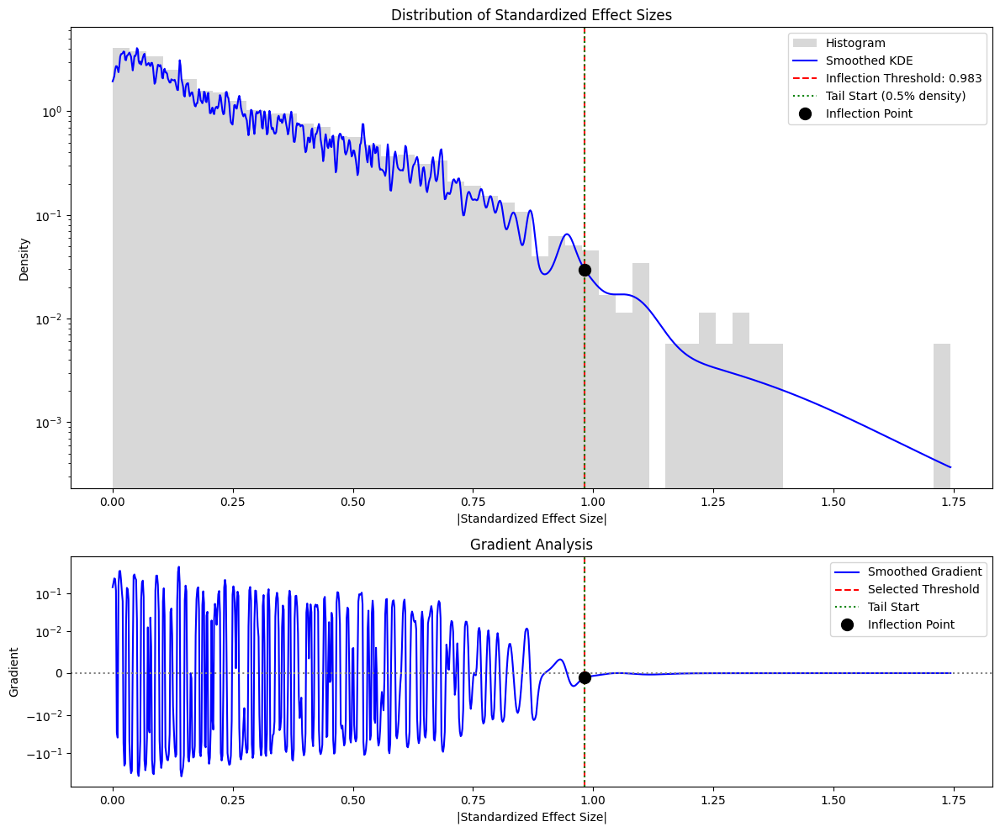

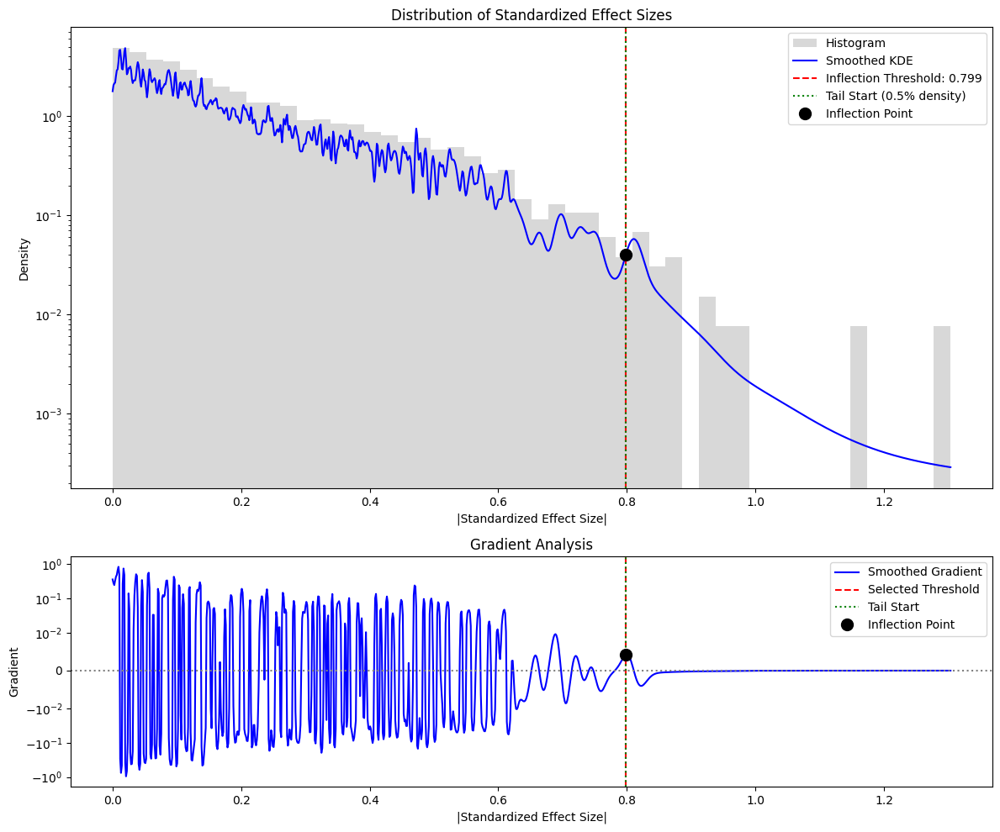

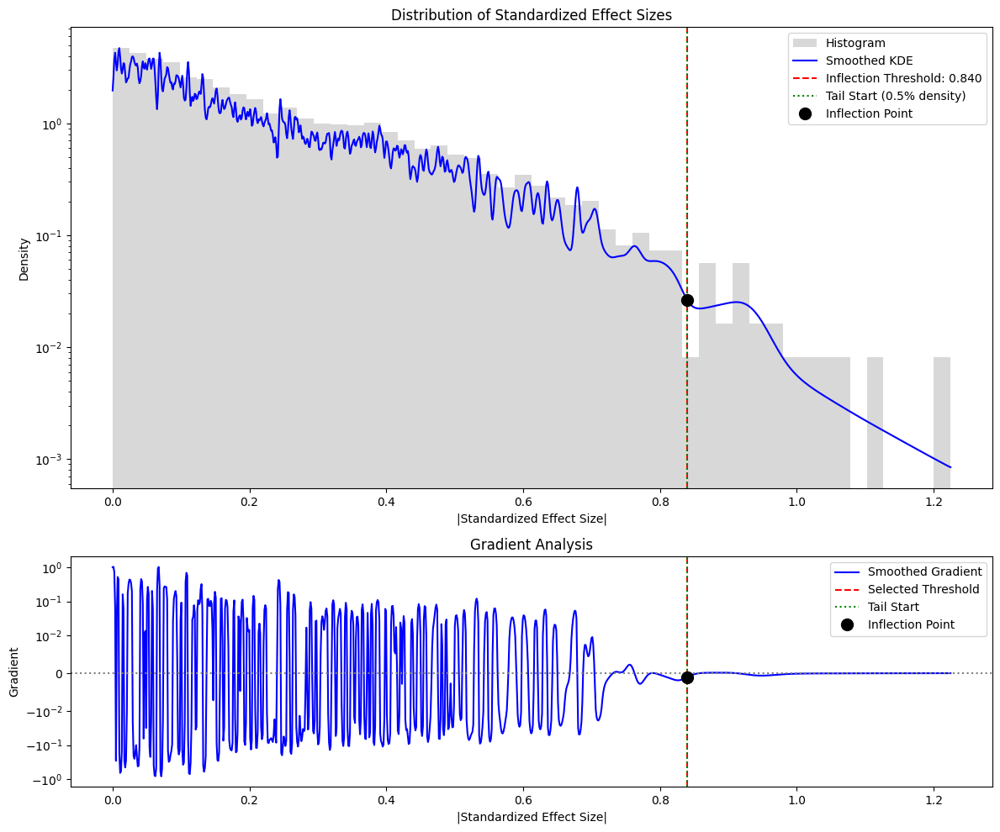

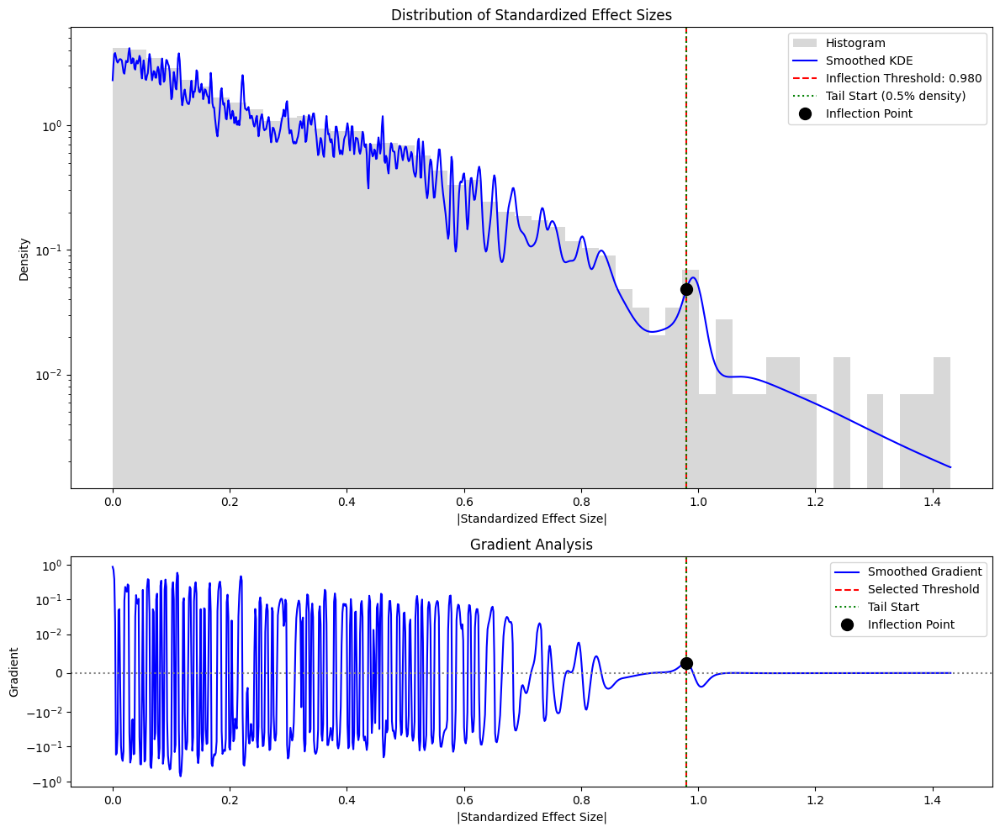

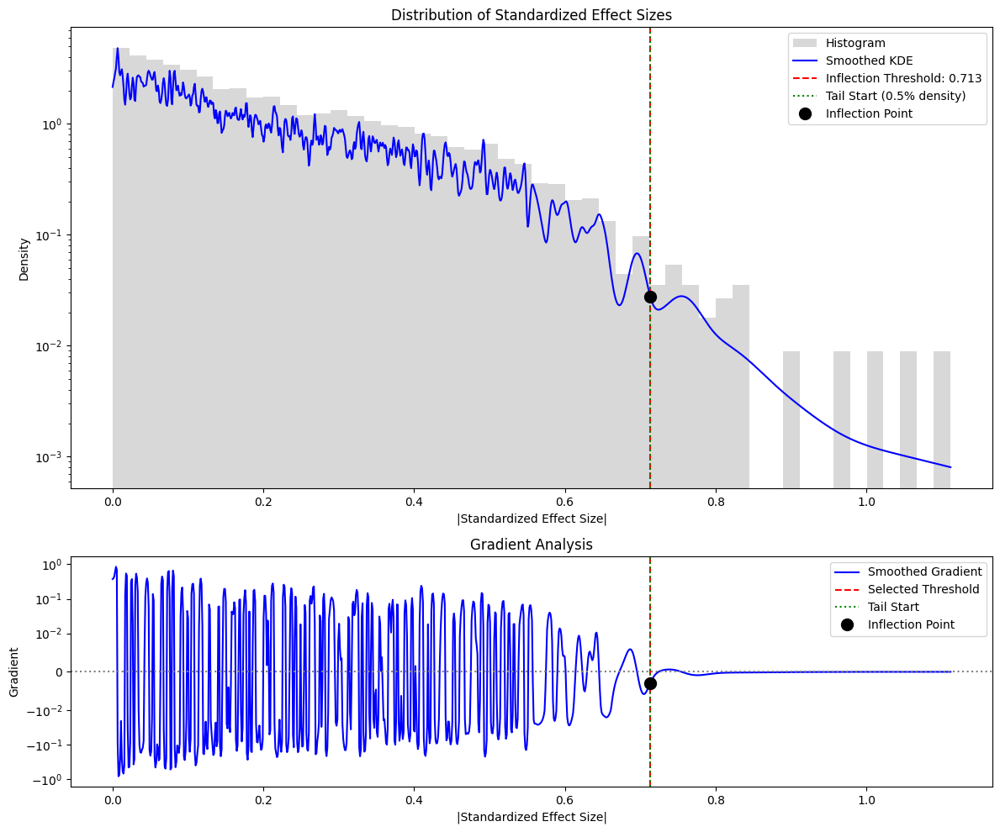

...

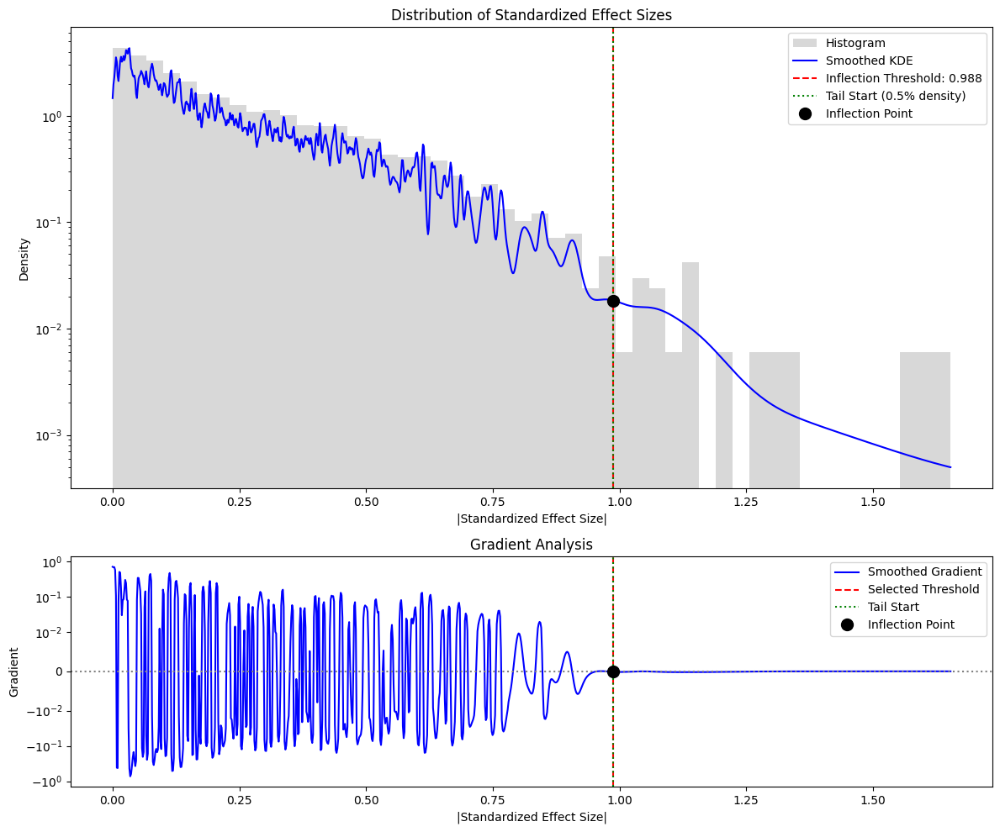

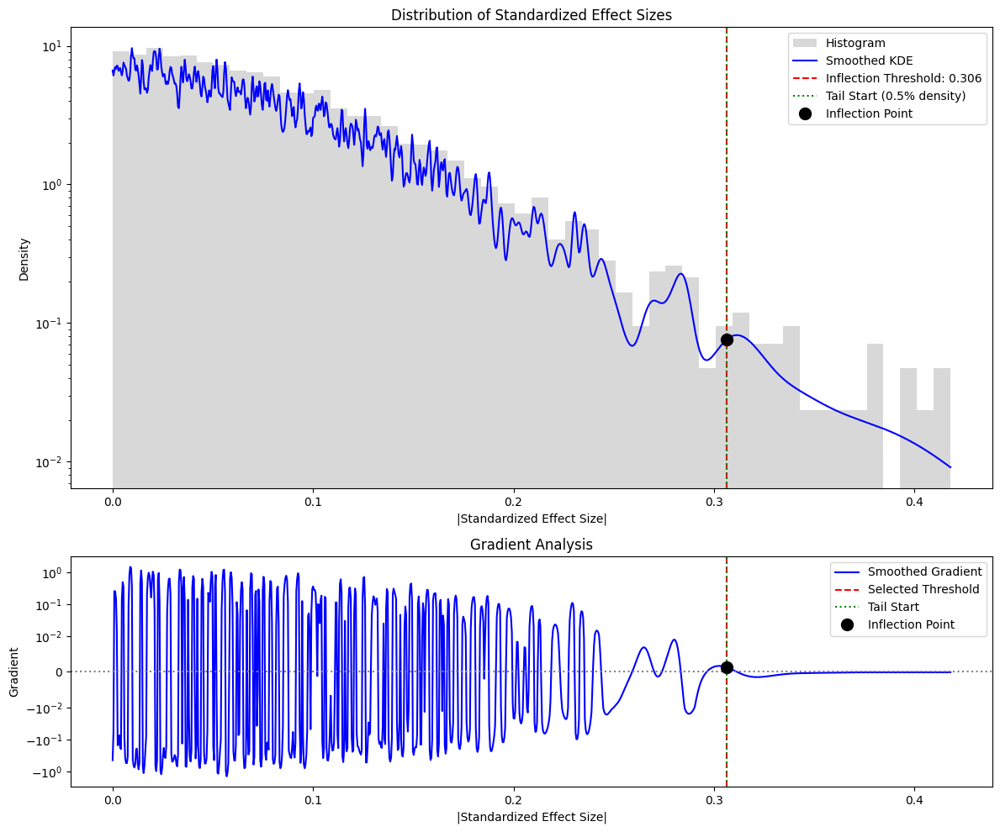

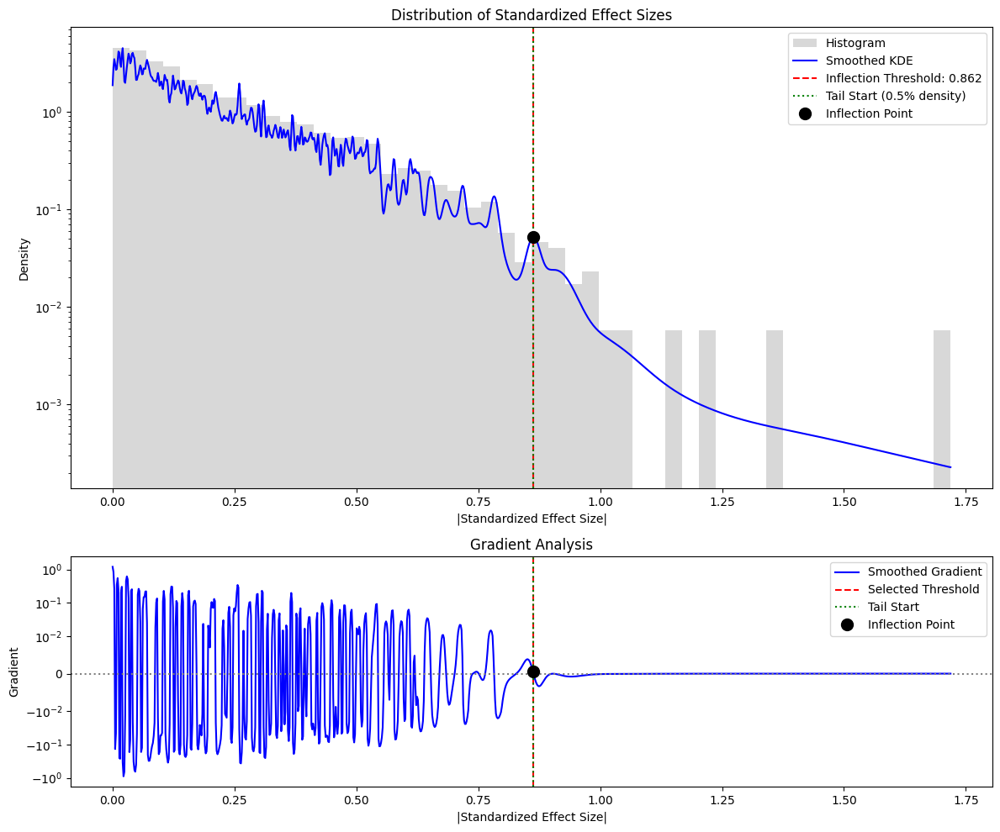

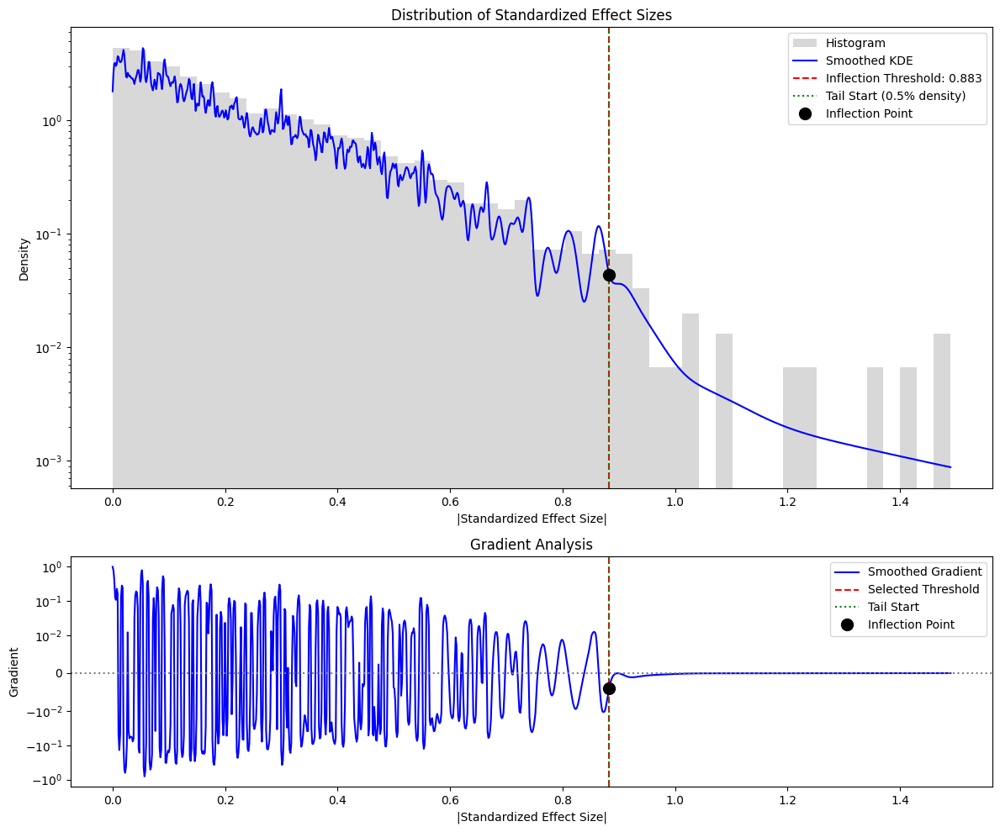

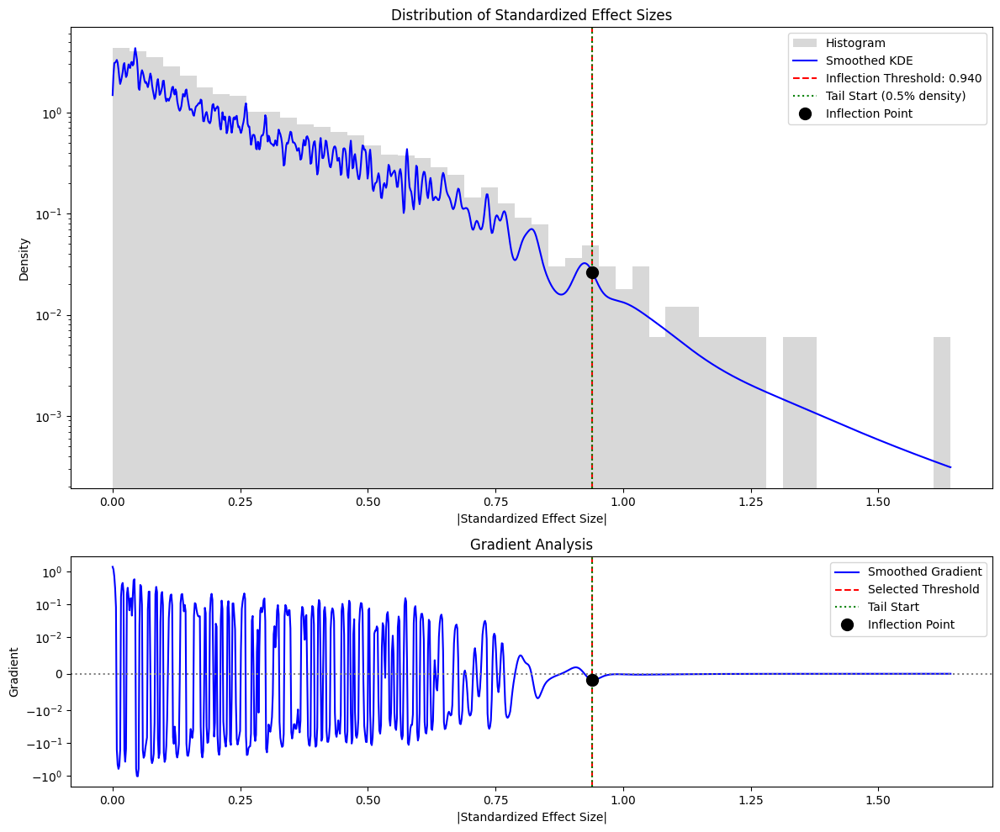

In [240]:
# Cell 3: Run One-vs-Rest Feature Selection Loop (Parallelized)
# Helper function for parallel execution
from joblib import Parallel, delayed
import torch # Need torch to check for CUDA
import gc
from scipy.sparse import issparse # Ensure issparse is imported

def process_sample(sample_key, sorted_adata, control_indices, selector_params, logger):
    """Processes a single sample key for OvR feature selection."""
    case_start_time = time.time()
    logger.info(f"--- Processing Case: {sample_key} ---")
    result = {'run_id': f"OvR_{sample_key}_{int(time.time())}"} # Define run_id early

    try:
        # 1. Get positive indices
        positive_indices = sorted_adata.obs.index[sorted_adata.obs['sample_prefix'] == sample_key]
        logger.debug(f"Found {len(positive_indices)} cells for case {sample_key}.")

        if positive_indices.empty:
            logger.warning(f"Skipping case {sample_key}: No positive cells found.")
            result.update({'status': 'skipped_no_positive_cells', 'error': None, 'fit_duration_seconds': 0})
            return sample_key, result

        # 2. Combine indices
        combined_indices = positive_indices.union(control_indices)
        logger.debug(f"Total cells for run ({sample_key} vs Controls): {len(combined_indices)}")

        # 3. Filter AnnData
        adata_subset = sorted_adata[combined_indices, :].copy()

        # 4. Prepare X and y
        logger.debug(f"Preparing X and y for {sample_key}...")
        if issparse(adata_subset.X):
            logger.warning(f"Sparse matrix found for {sample_key}. Converting to dense.")
            X_array = adata_subset.X.toarray()
        else:
            X_array = adata_subset.X

        expr_df = pd.DataFrame(X_array, index=adata_subset.obs.index, columns=adata_subset.var_names)
        y_series = pd.Series(0, index=adata_subset.obs.index, dtype=int)
        y_series.loc[positive_indices] = 1
        logger.debug(f"Target distribution for {sample_key}: {y_series.value_counts().to_dict()}")

        # 5. Instantiate and Fit Selector
        logger.debug(f"Instantiating selector with ID: {result['run_id']}")
        # NOTE: BayesianFeatureSelector handles device selection internally based on availability
        selector = BayesianFeatureSelector(unique_id=result['run_id'], **selector_params)

        logger.info(f"Fitting selector for case {sample_key}...")
        selector.fit(expr_df, y_series)
        fit_duration = time.time() - case_start_time
        logger.info(f"Fitting for {sample_key} completed in {fit_duration:.2f} seconds.")

        # 6. Store Results
        result.update({
            'status': 'success', 'error': None,
            'selected_features': selector.selected_features_.tolist(),
            'num_selected': len(selector.selected_features_),
            'selection_threshold': selector.selected_credible_interval,
            'feature_stats': selector.feature_stats.copy(),
            'fit_duration_seconds': fit_duration,
            'validation_results': getattr(selector, 'validation_results_', None).copy() if hasattr(selector, 'validation_results_') and selector.validation_results_ is not None else None
        })
        logger.info(f"Stored results for {sample_key}. Selected {len(selector.selected_features_)} features.")

    except Exception as e:
        fit_duration = time.time() - case_start_time
        logger.error(f"Fitting failed for case {sample_key} after {fit_duration:.2f} seconds: {e}", exc_info=True)
        result.update({
            'status': 'failed', 'error': str(e),
            'fit_duration_seconds': fit_duration
        })

    finally:
        # Clean up memory within the worker process
        del adata_subset, expr_df, y_series, selector, X_array
        gc.collect()

    return sample_key, result

# Cell 3: Run One-vs-Rest Feature Selection Loop (Parallelized)
if 'sorted_adata' in locals() and case_keys and not control_indices.empty:
    logger.info("Starting One-vs-Rest feature selection loop...")
    overall_start_time = time.time()

    # Determine n_jobs based on GPU availability to avoid OOM errors
    # If selector uses GPU, we MUST run sequentially on that GPU.
    # We assume the selector will try to use GPU if available.
    n_jobs = 1 if torch.cuda.is_available() else -1 # Use all CPU cores if no GPU, else 1
    backend = "loky" # Default multiprocessing backend
    # If n_jobs=1 was chosen due to GPU, prefer 'sequential' backend for clarity
    if n_jobs == 1 and torch.cuda.is_available():
        # Using 'sequential' avoids overhead of setting up parallel backend for single-job execution
        backend = 'sequential'
        logger.info("GPU detected. Running feature selection sequentially (n_jobs=1) to avoid GPU memory issues.")
    elif n_jobs == -1:
        logger.info("No GPU detected or selector forced to CPU. Running in parallel across CPU cores.")


    # Prepare list of tasks
    tasks = [delayed(process_sample)(key, sorted_adata, control_indices, SELECTOR_PARAMS, logger)
             for key in case_keys + control_keys]

    # Run in parallel (or sequentially if n_jobs=1)
    # Use verbose=10 for progress updates
    results_list = Parallel(n_jobs=n_jobs, backend=backend, verbose=10)(tasks)

    # Convert list of tuples back to dictionary
    ovr_results = dict(results_list)

    overall_duration = time.time() - overall_start_time
    logger.info(f"--- OvR Loop Finished in {overall_duration:.2f} seconds (using {backend} backend with n_jobs={n_jobs}) ---")

else:
    logger.warning("Skipping OvR loop: 'sorted_adata' object not found, no case keys identified, or no control cells found.")
    ovr_results = {}

# You can then access results like: ovr_results['some_sample_key']['selected_features']


In [95]:
ovr_results.keys()

NameError: name 'ovr_results' is not defined

In [96]:
ovr_results['AML1012-D0'].keys()

NameError: name 'ovr_results' is not defined

In [97]:
if ovr_results:
    logger.info("Analyzing One-vs-Rest Results...")

    # Convert results to a DataFrame for easier analysis
    results_list = []
    for case, data in ovr_results.items():
        row = {'case_key': case, **data}
        # Avoid trying to put large objects like DataFrames directly into the summary DF
        row.pop('feature_stats', None)
        row.pop('validation_results', None)
        row.pop('selected_features', None) # Can re-extract later if needed from feature_stats
        results_list.append(row)
    results_df = pd.DataFrame(results_list)

    print("Summary of OvR Runs:")
    print(results_df[['case_key', 'status', 'num_selected', 'selection_threshold', 'fit_duration_seconds', 'error']].to_string()) # Use to_string for better display

    # Example: Aggregate selected features
    all_selected_features = []
    successful_runs = 0
    feature_selection_counts = {}
    for case, data in ovr_results.items():
        if data['status'] == 'success' and 'selected_features' in data:
            successful_runs += 1
            # Ensure selected_features are hashable (e.g., strings)
            current_features = data['selected_features']
            all_selected_features.extend(current_features)
            for feature in current_features:
                 feature_selection_counts[feature] = feature_selection_counts.get(feature, 0) + 1


    if successful_runs > 0:
        print(f"\nAnalysis based on {successful_runs} successful runs:")
        # Top N most frequently selected features
        feature_counts_series = pd.Series(feature_selection_counts).sort_values(ascending=False)
        print("\nTop 20 most frequently selected features across all successful OvR runs:")
        print(feature_counts_series.head(20))

        # Example: Access feature stats for a specific case
        example_case = results_df[results_df['status']=='success']['case_key'].iloc[0]
        print(f"\nFeature statistics for case: {example_case}")
        # Check if stats exist before accessing
        if ovr_results[example_case]['feature_stats'] is not None:
             print(ovr_results[example_case]['feature_stats'].head())
        else:
             print("Feature statistics not available for this case.")

    else:
        print("\nNo successful runs to analyze features from.")

else:
    print("No OvR results available to analyze.")


NameError: name 'ovr_results' is not defined


Visualizing validation metrics for case: AML1012-D0


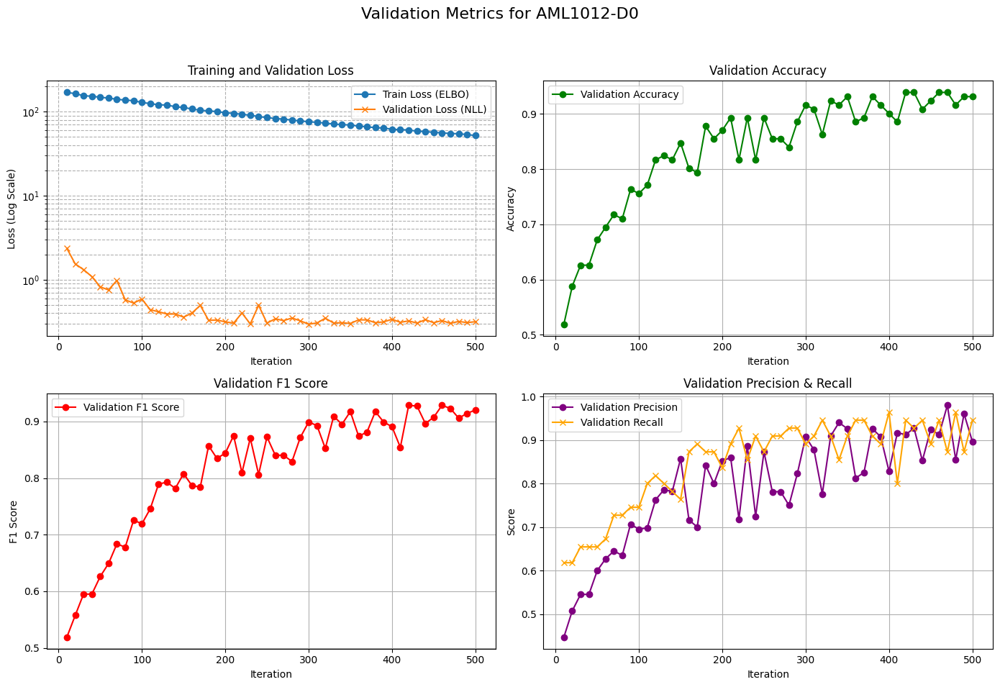

In [97]:
# --- Visualize Validation Metrics ---
import matplotlib.pyplot as plt
import pandas as pd

# Select a case to visualize (make sure this case exists and was successful)
case_to_visualize = 'AML1012-D0' # Example case key

if 'ovr_results' in locals() and ovr_results and case_to_visualize in ovr_results and ovr_results[case_to_visualize]['status'] == 'success':
    validation_data = ovr_results[case_to_visualize].get('validation_results')

    if validation_data:
        # Convert list of dictionaries to DataFrame
        val_df = pd.DataFrame(validation_data)

        if not val_df.empty and 'iteration' in val_df.columns:
            print(f"\nVisualizing validation metrics for case: {case_to_visualize}")

            fig, axes = plt.subplots(2, 2, figsize=(14, 10)) # Create a 2x2 grid of plots
            fig.suptitle(f'Validation Metrics for {case_to_visualize}', fontsize=16)

            # Plot 1: Losses
            plot_loss = ('train_loss (ELBO)' in val_df.columns or 'val_loss (NLL)' in val_df.columns)
            
            if 'train_loss (ELBO)' in val_df.columns:
                axes[0, 0].plot(val_df['iteration'], val_df['train_loss (ELBO)'], label='Train Loss (ELBO)', marker='o')
            if 'val_loss (NLL)' in val_df.columns:
                axes[0, 0].plot(val_df['iteration'], val_df['val_loss (NLL)'], label='Validation Loss (NLL)', marker='x')

            if plot_loss:
                axes[0, 0].set_xlabel('Iteration')
                axes[0, 0].set_ylabel('Loss (Log Scale)')
                axes[0, 0].set_yscale('log')
                axes[0, 0].set_title('Training and Validation Loss')
                axes[0, 0].legend()
                axes[0, 0].grid(True, which='both', linestyle='--')
            else:
                axes[0, 0].set_title('Training and Validation Loss (Not Plotted)')
                axes[0, 0].text(0.5, 0.5, 'Loss data not suitable for log scale or not found', horizontalalignment='center', verticalalignment='center', transform=axes[0, 0].transAxes)

            # Plot 2: Accuracy
            if 'val_accuracy' in val_df.columns:
                axes[0, 1].plot(val_df['iteration'], val_df['val_accuracy'], label='Validation Accuracy', marker='o', color='green')
                axes[0, 1].set_xlabel('Iteration')
                axes[0, 1].set_ylabel('Accuracy')
                axes[0, 1].set_title('Validation Accuracy')
                axes[0, 1].legend()
                axes[0, 1].grid(True)
            else:
                 axes[0, 1].set_title('Validation Accuracy (Not Available)')
                 axes[0, 1].text(0.5, 0.5, 'Data not found', horizontalalignment='center', verticalalignment='center', transform=axes[0, 1].transAxes)


            # Plot 3: F1 Score
            if 'val_f1' in val_df.columns:
                axes[1, 0].plot(val_df['iteration'], val_df['val_f1'], label='Validation F1 Score', marker='o', color='red')
                axes[1, 0].set_xlabel('Iteration')
                axes[1, 0].set_ylabel('F1 Score')
                axes[1, 0].set_title('Validation F1 Score')
                axes[1, 0].legend()
                axes[1, 0].grid(True)
            else:
                 axes[1, 0].set_title('Validation F1 Score (Not Available)')
                 axes[1, 0].text(0.5, 0.5, 'Data not found', horizontalalignment='center', verticalalignment='center', transform=axes[1, 0].transAxes)

            # Plot 4: Precision and Recall (Optional, if present)
            if 'val_precision' in val_df.columns and 'val_recall' in val_df.columns:
                axes[1, 1].plot(val_df['iteration'], val_df['val_precision'], label='Validation Precision', marker='o', color='purple')
                axes[1, 1].plot(val_df['iteration'], val_df['val_recall'], label='Validation Recall', marker='x', color='orange')
                axes[1, 1].set_xlabel('Iteration')
                axes[1, 1].set_ylabel('Score')
                axes[1, 1].set_title('Validation Precision & Recall')
                axes[1, 1].legend()
                axes[1, 1].grid(True)
            else:
                 axes[1, 1].set_title('Validation Precision & Recall (Not Available)')
                 axes[1, 1].text(0.5, 0.5, 'Data not found', horizontalalignment='center', verticalalignment='center', transform=axes[1, 1].transAxes)


            plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to prevent title overlap
            plt.show()

        else:
            print(f"Validation data for {case_to_visualize} is empty or missing 'iteration' column.")
    else:
        print(f"No 'validation_results' found for case: {case_to_visualize}")
else:
    # Check which condition failed
    if 'ovr_results' not in locals():
        print("Error: 'ovr_results' dictionary not found in the current scope.")
    elif not ovr_results:
         print("Error: 'ovr_results' dictionary is empty.")
    elif case_to_visualize not in ovr_results:
        print(f"Error: Case '{case_to_visualize}' not found in ovr_results keys.")
    elif ovr_results[case_to_visualize]['status'] != 'success':
         print(f"Error: Run for case '{case_to_visualize}' was not successful (status: {ovr_results[case_to_visualize]['status']}).")
    else:
         print(f"Could not visualize: An unknown issue occurred with case '{case_to_visualize}'.")


# healthy -> AML

In [98]:
all_perturbations = generate_perturbations(list(set(gears_wrapper.pert_list) & set(healthy_adata.var.gene_symbol.tolist())), generate_double_perts=False)

In [59]:
def evaluate_perturbations(condition_classifier, perturbation_list, scenario="aml_to_healthy", results_filename="healthyToAML"):
    """
    Evaluate perturbations using the generator-based evaluator and immediately write results to CSV.
    
    Parameters:
        perturbation_list (list): List of candidate perturbations.
        scenario (str, optional): Scenario to use.
                                  For example, "aml_to_healthy" means perturb healthy cells toward an AML-like state.
        results_filename (str, optional): Prefix for the CSV file to be written.
    
    Returns:
        csv_filename (str): The name of the CSV file that was written.
    """
    import csv
    from datetime import datetime

    # Determine which AnnData to use as the current (baseline) state.
    current_adata = healthy_adata if scenario == 'aml_to_healthy' else cancer_adata

    evaluator = perturbation_evaluator.PerturbationEvaluator(
        classifier=condition_classifier,
        reference_state=cancer_adata if scenario == 'aml_to_healthy' else healthy_adata,
        device=device,
        invert_classifier_score=True if scenario == 'aml_to_healthy' else False,
        gears_data_dir=f"{gears_data_dir}/model",
       # gene_subset=gene_subset,
        template_adata=gears_adata,
        output_predictions_path=f"{results_filename}_predictions.csv"
    )
    
    # Use the generator-based evaluation method to process perturbations in chunks.
    results_gen = evaluator.evaluate_perturbations(current_adata, perturbation_list, chunk_size=100)
    
    # Create a CSV filename with an appended timestamp.
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    csv_filename = f"{results_filename}_{timestamp}.csv"
    
    # Open the CSV file for writing and write a header.
    with open(csv_filename, "w", newline="") as csvfile:
        writer = csv.writer(csvfile)
        header = ["perturbation", "baseline_classifier", "classifier", "wasserstein", "stability", "density", "total"]
        writer.writerow(header)
        
        # Iterate over each result from the generator and write it to the CSV.
        for result in results_gen:
            scores = result.scores
            row = [
                result.perturbation,
                scores.get("baseline_classifier", None),
                scores.get("classifier", None),
                scores.get("wasserstein", None),
                scores.get("stability", None),
                scores.get("density", None),
                scores.get("total", None)
            ]
            writer.writerow(row)
    
    print(f"Results saved to {csv_filename}")
    return csv_filename

In [61]:
evaluation_result_path = evaluate_perturbations(selector,
                                                all_perturbations, 
                                                scenario="healthy_to_aml",
                                                results_filename="healthyToAML_allCases_allPerts")

# Load the CSV file containing the evaluation results.
results_df = pd.read_csv(evaluation_result_path)

if not results_df.empty:
    print("Perturbation Evaluation Results:")
    for idx, row in results_df.iterrows():
        print(f"\nPerturbation #{idx+1}:")
        print(f"  Perturbation: {row['perturbation']}")
        print(f"  Baseline Classifier Score: {float(row['baseline_classifier']):.4f}")
        print(f"  Predicted Classifier Score: {float(row['classifier']):.4f}")
        print(f"  Wasserstein Distance: {float(row['wasserstein']):.4f}")
        print(f"  Stability: {float(row['stability']):.4f}")
        print(f"  Density: {float(row['density']):.4f}")
        print(f"  Total Score: {float(row['total']):.4f}")
else:
    print("No valid perturbations found.")

Detected Resources: RAM Available: 40.11 GB, CPU Cores: 16, GPU Available: True, GPU Mem Available: 10.14 GB
Loading GEARS model and preparing PertData...


Found local copy...
Found local copy...
Creating pyg object for each cell in the data...
Creating dataset file...
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  1.26s/it]
Done!
Saving new dataset pyg object at GEARS/GEARS_data/model/pert_data_single_load/single_cell/data_pyg/cell_graphs.pkl
Done!
Local copy of split is detected. Loading...
Done!
Creating dataloaders....
Dataloaders created...


here1
GEARS wrapper and model loaded successfully.
Using user-provided chunk_size: 100
Dynamically setting batch_size based on GPU VRAM: 507
Opening prediction output file: healthyToAML_allCases_allPerts_predictions.csv
Processing chunk 1/31 with 100 perturbations...


Chunk 1 finished (100 total perts processed). Waiting 1s...
Processing chunk 2/31 with 100 perturbations...


Chunk 2 finished (200 total perts processed). Waiting 1s...
Processing chunk 3/31 with 100 perturbations...


Chunk 3 finished (300 total perts processed). Waiting 1s...
Processing chunk 4/31 with 100 perturbations...


Chunk 4 finished (400 total perts processed). Waiting 1s...
Processing chunk 5/31 with 100 perturbations...


Chunk 5 finished (500 total perts processed). Waiting 1s...
Processing chunk 6/31 with 100 perturbations...


Chunk 6 finished (600 total perts processed). Waiting 1s...
Processing chunk 7/31 with 100 perturbations...


Chunk 7 finished (700 total perts processed). Waiting 1s...
Processing chunk 8/31 with 100 perturbations...


Chunk 8 finished (800 total perts processed). Waiting 1s...
Processing chunk 9/31 with 100 perturbations...


Chunk 9 finished (900 total perts processed). Waiting 1s...
Processing chunk 10/31 with 100 perturbations...


Chunk 10 finished (1000 total perts processed). Waiting 1s...
Processing chunk 11/31 with 100 perturbations...


Chunk 11 finished (1100 total perts processed). Waiting 1s...
Processing chunk 12/31 with 100 perturbations...


Chunk 12 finished (1200 total perts processed). Waiting 1s...
Processing chunk 13/31 with 100 perturbations...


Chunk 13 finished (1300 total perts processed). Waiting 1s...
Processing chunk 14/31 with 100 perturbations...


Chunk 14 finished (1400 total perts processed). Waiting 1s...
Processing chunk 15/31 with 100 perturbations...


Chunk 15 finished (1500 total perts processed). Waiting 1s...
Processing chunk 16/31 with 100 perturbations...


Chunk 16 finished (1600 total perts processed). Waiting 1s...
Processing chunk 17/31 with 100 perturbations...


Chunk 17 finished (1700 total perts processed). Waiting 1s...
Processing chunk 18/31 with 100 perturbations...


Chunk 18 finished (1800 total perts processed). Waiting 1s...
Processing chunk 19/31 with 100 perturbations...


Chunk 19 finished (1900 total perts processed). Waiting 1s...
Processing chunk 20/31 with 100 perturbations...


Chunk 20 finished (2000 total perts processed). Waiting 1s...
Processing chunk 21/31 with 100 perturbations...


Chunk 21 finished (2100 total perts processed). Waiting 1s...
Processing chunk 22/31 with 100 perturbations...


Chunk 22 finished (2200 total perts processed). Waiting 1s...
Processing chunk 23/31 with 100 perturbations...


Chunk 23 finished (2300 total perts processed). Waiting 1s...
Processing chunk 24/31 with 100 perturbations...


Chunk 24 finished (2400 total perts processed). Waiting 1s...
Processing chunk 25/31 with 100 perturbations...


Chunk 25 finished (2500 total perts processed). Waiting 1s...
Processing chunk 26/31 with 100 perturbations...


Chunk 26 finished (2600 total perts processed). Waiting 1s...
Processing chunk 27/31 with 100 perturbations...


Chunk 27 finished (2700 total perts processed). Waiting 1s...
Processing chunk 28/31 with 100 perturbations...


Chunk 28 finished (2800 total perts processed). Waiting 1s...
Processing chunk 29/31 with 100 perturbations...


Chunk 29 finished (2900 total perts processed). Waiting 1s...
Processing chunk 30/31 with 100 perturbations...


Chunk 30 finished (3000 total perts processed). Waiting 1s...
Processing chunk 31/31 with 28 perturbations...


Closing prediction output file: healthyToAML_allCases_allPerts_predictions.csv
Finished evaluating 3028 perturbations.
Results saved to healthyToAML_allCases_allPerts_20250430_215937.csv
Perturbation Evaluation Results:

Perturbation #1:
  Perturbation: PDLIM7
  Baseline Classifier Score: nan
  Predicted Classifier Score: 1.0000
  Wasserstein Distance: 0.1537
  Stability: 0.7877
  Density: 0.3680
  Total Score: 0.2854

Perturbation #2:
  Perturbation: ZBTB1
  Baseline Classifier Score: nan
  Predicted Classifier Score: 1.0000
  Wasserstein Distance: 0.1684
  Stability: 0.7793
  Density: 0.3681
  Total Score: 0.2821

Perturbation #3:
  Perturbation: NFATC3
  Baseline Classifier Score: nan
  Predicted Classifier Score: 0.0000
  Wasserstein Distance: 0.1664
  Stability: 0.7786
  Density: 0.3680
  Total Score: 0.0000

Perturbation #4:
  Perturbation: RRP36
  Baseline Classifier Score: nan
  Predicted Classifier Score: 1.0000
  Wasserstein Distance: 0.1649
  Stability: 0.7816
  Density: 0.3

In [88]:
selected_perturbations = extract_perturbations_by_classifier_change(results_df)
evaluation_results = evaluate_perturbations(generate_perturbations([pert[0] for pert in selected_perturbations], generate_double_perts=True), 
                                            results_filename="healthyToAML_allCases_selectedPerts")
# Print results for each evaluation result in the list.
if evaluation_results:
    print("Perturbation Evaluation Results:")
    for idx, result in enumerate(evaluation_results, start=1):
        print(f"\nPerturbation #{idx}:")
        print(f"  Perturbation: {result.perturbation}")
        print(f"  Baseline Classifier Score: {result.scores['baseline_classifier']:.4f}")
        print(f"  Predicted Classifier Score: {result.scores['classifier']:.4f}")
        print(f"  Wasserstein Distance: {result.scores['wasserstein']:.4f}")
        print(f"  Stability: {result.scores['stability']:.4f}")
        print(f"  Density: {result.scores['density']:.4f}")
        print(f"  Total Score: {result.scores['total']:.4f}")
else:
    print("No valid perturbations found.")

del evaluation_results

Found local copy...
Found local copy...
Creating pyg object for each cell in the data...
Creating dataset file...
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20.66it/s]
Done!
Saving new dataset pyg object at GEARS_data/model/pert_data/single_cell/data_pyg/cell_graphs.pkl
Done!
Local copy of split is detected. Loading...
Done!
Creating dataloaders....
Dataloaders created...


here1
Processing chunk 1/1 with 6 perturbations...


Chunk 1/1: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 937.27it/s]


Results saved to healthyToAML_allCases_selectedPerts_20250423_203955.csv
Perturbation Evaluation Results:

Perturbation #1:


AttributeError: 'str' object has no attribute 'perturbation'

In [75]:
results_df.sort_values(by='wasserstein', ascending=False)

,perturbation,baseline_classifier,classifier,wasserstein,stability,density,total
2172,CEBPA,NaN,1.000000e+00,0.245037,0.729680,0.368288,2.622272e-01
2799,TP73,NaN,1.000000e+00,0.203314,0.753057,0.368036,2.715740e-01
1679,HOXC13,NaN,1.000000e+00,0.191718,0.767658,0.368199,2.772835e-01
2886,BCL7C,NaN,1.125988e-16,0.191205,0.766629,0.367996,3.116434e-17
482,ATL1,NaN,1.000000e+00,0.190882,0.772489,0.368150,2.790146e-01
...,...,...,...,...,...,...,...
844,EIF3G,NaN,4.091253e-05,0.118659,0.806051,0.368632,1.201320e-05
1841,C1orf35,NaN,2.000945e-15,0.117713,0.806191,0.369743,5.894688e-16
2484,MYLIP,NaN,2.439807e-08,0.117017,0.805841,0.369575,7.181670e-09
852,STRBP,NaN,3.338998e-18,0.115892,0.806730,0.369587,9.840750e-19


### per-individual perturbations

In [64]:
%load_ext autoreload
%autoreload 2

from GEARS.perturbation_evaluator import predict_and_save_per_cell_structured

adata_to_predict_on = healthy_adata # Or cancer_adata, depending on scenario
output_directory = "gears_per_cell_predictions"
perturbation_list = all_perturbations # Your list of perturbations
mapping_dict = ensembl_gene_mapping # Your mapping dictionary

predict_and_save_per_cell_structured(
    gears_wrapper=gears_wrapper,
    adata_to_predict=adata_to_predict_on,
    perturbations=perturbation_list[:100],
    output_base_dir=output_directory,
    sample_id_col='sample_id', # Make sure this column exists in adata_to_predict_on.obs
    batch_size=128, # Adjust as needed
    mapping=mapping_dict
)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Starting per-cell prediction and structured saving to: gears_per_cell_predictions
Found 430 cells across 4 samples.
Checking perturbation availability and mapping symbols...
Predicting for 100 perturbations...


Perturbations:   0%|                                                                                                      | 0/100 [00:00<?, ?it/s]

Perturbations:   4%|███▊                                                                                          | 4/100 [00:00<00:02, 36.94it/s]

  Processing perturbation: PDLIM7 (Predict ID: ['PDLIM7'])
  Processing perturbation: ZBTB1 (Predict ID: ['ZBTB1'])
  Processing perturbation: NFATC3 (Predict ID: ['NFATC3'])
  Processing perturbation: RRP36 (Predict ID: ['RRP36'])
  Processing perturbation: CCNB1IP1 (Predict ID: ['CCNB1IP1'])
  Processing perturbation: PTS (Predict ID: ['PTS'])
  Processing perturbation: BRD7 (Predict ID: ['BRD7'])
  Processing perturbation: GABRG3 (Predict ID: ['GABRG3'])
  Processing perturbation: SURF6 (Predict ID: ['SURF6'])


Perturbations:  14%|█████████████                                                                                | 14/100 [00:00<00:02, 39.90it/s]

  Processing perturbation: IFRD2 (Predict ID: ['IFRD2'])
  Processing perturbation: TBPL1 (Predict ID: ['TBPL1'])
  Processing perturbation: PITX1 (Predict ID: ['PITX1'])
  Processing perturbation: OARD1 (Predict ID: ['OARD1'])
  Processing perturbation: EBAG9 (Predict ID: ['EBAG9'])
  Processing perturbation: HSPA9 (Predict ID: ['HSPA9'])
  Processing perturbation: SCAF11 (Predict ID: ['SCAF11'])
  Processing perturbation: TIMM44 (Predict ID: ['TIMM44'])


Perturbations:  22%|████████████████████▍                                                                        | 22/100 [00:00<00:02, 38.87it/s]

  Processing perturbation: MAVS (Predict ID: ['MAVS'])
  Processing perturbation: USP48 (Predict ID: ['USP48'])
  Processing perturbation: GABPB1 (Predict ID: ['GABPB1'])
  Processing perturbation: ZNF610 (Predict ID: ['ZNF610'])
  Processing perturbation: LAMTOR1 (Predict ID: ['LAMTOR1'])
  Processing perturbation: WIPI2 (Predict ID: ['WIPI2'])
  Processing perturbation: AHCYL1 (Predict ID: ['AHCYL1'])


Perturbations:  24%|██████████████████████▎                                                                      | 24/100 [00:36<04:24,  3.47s/it]

  Processing perturbation: PPP4R2 (Predict ID: ['PPP4R2'])


Perturbations:  25%|███████████████████████▎                                                                     | 25/100 [00:53<06:28,  5.18s/it]

  Processing perturbation: PAK2 (Predict ID: ['PAK2'])


Perturbations:  26%|████████████████████████▏                                                                    | 26/100 [01:11<08:42,  7.06s/it]

  Processing perturbation: VAMP8 (Predict ID: ['VAMP8'])


Perturbations:  27%|█████████████████████████                                                                    | 27/100 [01:29<10:53,  8.95s/it]

  Processing perturbation: UBE2V2 (Predict ID: ['UBE2V2'])


Perturbations:  28%|██████████████████████████                                                                   | 28/100 [01:47<12:48, 10.67s/it]

  Processing perturbation: RNF130 (Predict ID: ['RNF130'])


Perturbations:  29%|██████████████████████████▉                                                                  | 29/100 [02:05<14:31, 12.27s/it]

  Processing perturbation: PCSK7 (Predict ID: ['PCSK7'])


Perturbations:  30%|███████████████████████████▉                                                                 | 30/100 [02:23<15:53, 13.63s/it]

  Processing perturbation: GYPC (Predict ID: ['GYPC'])


Perturbations:  31%|████████████████████████████▊                                                                | 31/100 [02:40<16:55, 14.72s/it]

  Processing perturbation: POLR2L (Predict ID: ['POLR2L'])


Perturbations:  32%|█████████████████████████████▊                                                               | 32/100 [02:58<17:32, 15.48s/it]

  Processing perturbation: AGPAT1 (Predict ID: ['AGPAT1'])


Perturbations:  33%|██████████████████████████████▋                                                              | 33/100 [03:16<18:01, 16.15s/it]

  Processing perturbation: RAB1A (Predict ID: ['RAB1A'])


Perturbations:  34%|███████████████████████████████▌                                                             | 34/100 [03:34<18:17, 16.63s/it]

  Processing perturbation: ARPC1B (Predict ID: ['ARPC1B'])


Perturbations:  35%|████████████████████████████████▌                                                            | 35/100 [03:52<18:25, 17.00s/it]

  Processing perturbation: RPL37 (Predict ID: ['RPL37'])


Perturbations:  36%|█████████████████████████████████▍                                                           | 36/100 [04:09<18:19, 17.18s/it]

  Processing perturbation: RMI2 (Predict ID: ['RMI2'])


Perturbations:  37%|██████████████████████████████████▍                                                          | 37/100 [04:27<18:15, 17.40s/it]

  Processing perturbation: PDIA3 (Predict ID: ['PDIA3'])


Perturbations:  38%|███████████████████████████████████▎                                                         | 38/100 [04:45<18:09, 17.58s/it]

  Processing perturbation: AIFM1 (Predict ID: ['AIFM1'])


Perturbations:  39%|████████████████████████████████████▎                                                        | 39/100 [05:03<17:52, 17.59s/it]

  Processing perturbation: GINS2 (Predict ID: ['GINS2'])


Perturbations:  40%|█████████████████████████████████████▏                                                       | 40/100 [05:21<17:42, 17.70s/it]

  Processing perturbation: MAP2K2 (Predict ID: ['MAP2K2'])


Perturbations:  41%|██████████████████████████████████████▏                                                      | 41/100 [05:39<17:27, 17.76s/it]

  Processing perturbation: TRA2B (Predict ID: ['TRA2B'])


Perturbations:  42%|███████████████████████████████████████                                                      | 42/100 [05:57<17:13, 17.81s/it]

  Processing perturbation: SMIM12 (Predict ID: ['SMIM12'])


Perturbations:  43%|███████████████████████████████████████▉                                                     | 43/100 [06:14<16:51, 17.75s/it]

  Processing perturbation: DIAPH1 (Predict ID: ['DIAPH1'])


Perturbations:  44%|████████████████████████████████████████▉                                                    | 44/100 [06:32<16:36, 17.80s/it]

  Processing perturbation: BLOC1S2 (Predict ID: ['BLOC1S2'])


Perturbations:  45%|█████████████████████████████████████████▊                                                   | 45/100 [06:50<16:21, 17.85s/it]

  Processing perturbation: KMT2C (Predict ID: ['KMT2C'])


Perturbations:  46%|██████████████████████████████████████████▊                                                  | 46/100 [07:08<16:05, 17.88s/it]

  Processing perturbation: CUX1 (Predict ID: ['CUX1'])


Perturbations:  47%|███████████████████████████████████████████▋                                                 | 47/100 [07:26<15:43, 17.79s/it]

  Processing perturbation: CMSS1 (Predict ID: ['CMSS1'])


Perturbations:  48%|████████████████████████████████████████████▋                                                | 48/100 [07:44<15:27, 17.84s/it]

  Processing perturbation: CCND3 (Predict ID: ['CCND3'])


Perturbations:  49%|█████████████████████████████████████████████▌                                               | 49/100 [08:01<15:10, 17.86s/it]

  Processing perturbation: CHMP4A (Predict ID: ['CHMP4A'])


Perturbations:  50%|██████████████████████████████████████████████▌                                              | 50/100 [08:19<14:49, 17.79s/it]

  Processing perturbation: LARP1B (Predict ID: ['LARP1B'])


Perturbations:  51%|███████████████████████████████████████████████▍                                             | 51/100 [08:37<14:34, 17.84s/it]

  Processing perturbation: LCP1 (Predict ID: ['LCP1'])


Perturbations:  52%|████████████████████████████████████████████████▎                                            | 52/100 [08:55<14:18, 17.88s/it]

  Processing perturbation: CTDSP1 (Predict ID: ['CTDSP1'])


Perturbations:  53%|█████████████████████████████████████████████████▎                                           | 53/100 [09:13<14:02, 17.93s/it]

  Processing perturbation: SUCLG1 (Predict ID: ['SUCLG1'])


Perturbations:  54%|██████████████████████████████████████████████████▏                                          | 54/100 [09:31<13:40, 17.84s/it]

  Processing perturbation: HCCS (Predict ID: ['HCCS'])


Perturbations:  55%|███████████████████████████████████████████████████▏                                         | 55/100 [09:49<13:24, 17.87s/it]

  Processing perturbation: PRSS21 (Predict ID: ['PRSS21'])


Perturbations:  56%|████████████████████████████████████████████████████                                         | 56/100 [10:07<13:07, 17.90s/it]

  Processing perturbation: NOL7 (Predict ID: ['NOL7'])


Perturbations:  57%|█████████████████████████████████████████████████████                                        | 57/100 [10:24<12:46, 17.82s/it]

  Processing perturbation: PSMD6 (Predict ID: ['PSMD6'])


Perturbations:  58%|█████████████████████████████████████████████████████▉                                       | 58/100 [10:42<12:29, 17.84s/it]

  Processing perturbation: MZT2A (Predict ID: ['MZT2A'])


Perturbations:  59%|██████████████████████████████████████████████████████▊                                      | 59/100 [11:00<12:12, 17.88s/it]

  Processing perturbation: CA11 (Predict ID: ['CA11'])


Perturbations:  60%|███████████████████████████████████████████████████████▊                                     | 60/100 [11:18<11:56, 17.90s/it]

  Processing perturbation: MRPL22 (Predict ID: ['MRPL22'])


Perturbations:  61%|████████████████████████████████████████████████████████▋                                    | 61/100 [11:36<11:34, 17.82s/it]

  Processing perturbation: REXO2 (Predict ID: ['REXO2'])


Perturbations:  62%|█████████████████████████████████████████████████████████▋                                   | 62/100 [11:54<11:18, 17.85s/it]

  Processing perturbation: HNRNPU (Predict ID: ['HNRNPU'])


Perturbations:  63%|██████████████████████████████████████████████████████████▌                                  | 63/100 [12:12<11:01, 17.87s/it]

  Processing perturbation: STAU1 (Predict ID: ['STAU1'])


Perturbations:  64%|███████████████████████████████████████████████████████████▌                                 | 64/100 [12:29<10:43, 17.88s/it]

  Processing perturbation: KCNH2 (Predict ID: ['KCNH2'])


Perturbations:  65%|████████████████████████████████████████████████████████████▍                                | 65/100 [12:47<10:22, 17.79s/it]

  Processing perturbation: SEC13 (Predict ID: ['SEC13'])


Perturbations:  66%|█████████████████████████████████████████████████████████████▍                               | 66/100 [13:05<10:06, 17.83s/it]

  Processing perturbation: TMEM141 (Predict ID: ['TMEM141'])


Perturbations:  67%|██████████████████████████████████████████████████████████████▎                              | 67/100 [13:23<09:48, 17.85s/it]

  Processing perturbation: SPAG7 (Predict ID: ['SPAG7'])


Perturbations:  68%|███████████████████████████████████████████████████████████████▏                             | 68/100 [13:40<09:28, 17.77s/it]

  Processing perturbation: DNMT1 (Predict ID: ['DNMT1'])


Perturbations:  69%|████████████████████████████████████████████████████████████████▏                            | 69/100 [13:58<09:12, 17.82s/it]

  Processing perturbation: EZR (Predict ID: ['EZR'])


Perturbations:  70%|█████████████████████████████████████████████████████████████████                            | 70/100 [14:16<08:55, 17.86s/it]

  Processing perturbation: NAXE (Predict ID: ['NAXE'])


Perturbations:  71%|██████████████████████████████████████████████████████████████████                           | 71/100 [14:34<08:38, 17.89s/it]

  Processing perturbation: PTBP3 (Predict ID: ['PTBP3'])


Perturbations:  72%|██████████████████████████████████████████████████████████████████▉                          | 72/100 [14:52<08:18, 17.81s/it]

  Processing perturbation: ESF1 (Predict ID: ['ESF1'])


Perturbations:  73%|███████████████████████████████████████████████████████████████████▉                         | 73/100 [15:10<08:02, 17.85s/it]

  Processing perturbation: SUMF2 (Predict ID: ['SUMF2'])


Perturbations:  74%|████████████████████████████████████████████████████████████████████▊                        | 74/100 [15:28<07:44, 17.87s/it]

  Processing perturbation: EIF1B (Predict ID: ['EIF1B'])


Perturbations:  75%|█████████████████████████████████████████████████████████████████████▊                       | 75/100 [15:45<07:24, 17.79s/it]

  Processing perturbation: SMIM19 (Predict ID: ['SMIM19'])


Perturbations:  76%|██████████████████████████████████████████████████████████████████████▋                      | 76/100 [16:03<07:08, 17.84s/it]

  Processing perturbation: RPL12 (Predict ID: ['RPL12'])


Perturbations:  77%|███████████████████████████████████████████████████████████████████████▌                     | 77/100 [16:21<06:50, 17.85s/it]

  Processing perturbation: HOXB9 (Predict ID: ['HOXB9'])


Perturbations:  78%|████████████████████████████████████████████████████████████████████████▌                    | 78/100 [16:39<06:33, 17.87s/it]

  Processing perturbation: GLRX5 (Predict ID: ['GLRX5'])


Perturbations:  79%|█████████████████████████████████████████████████████████████████████████▍                   | 79/100 [16:57<06:13, 17.79s/it]

  Processing perturbation: LSM1 (Predict ID: ['LSM1'])


Perturbations:  80%|██████████████████████████████████████████████████████████████████████████▍                  | 80/100 [17:15<05:56, 17.83s/it]

  Processing perturbation: SLC2A1 (Predict ID: ['SLC2A1'])


Perturbations:  81%|███████████████████████████████████████████████████████████████████████████▎                 | 81/100 [17:33<05:39, 17.85s/it]

  Processing perturbation: BMS1 (Predict ID: ['BMS1'])


Perturbations:  82%|████████████████████████████████████████████████████████████████████████████▎                | 82/100 [17:50<05:21, 17.87s/it]

  Processing perturbation: MAP4 (Predict ID: ['MAP4'])


Perturbations:  83%|█████████████████████████████████████████████████████████████████████████████▏               | 83/100 [18:08<05:02, 17.79s/it]

  Processing perturbation: RREB1 (Predict ID: ['RREB1'])


Perturbations:  84%|██████████████████████████████████████████████████████████████████████████████               | 84/100 [18:26<04:45, 17.83s/it]

  Processing perturbation: BIRC5 (Predict ID: ['BIRC5'])


Perturbations:  85%|███████████████████████████████████████████████████████████████████████████████              | 85/100 [18:44<04:27, 17.85s/it]

  Processing perturbation: UFC1 (Predict ID: ['UFC1'])


Perturbations:  86%|███████████████████████████████████████████████████████████████████████████████▉             | 86/100 [19:01<04:08, 17.77s/it]

  Processing perturbation: TXLNA (Predict ID: ['TXLNA'])


Perturbations:  87%|████████████████████████████████████████████████████████████████████████████████▉            | 87/100 [19:19<03:51, 17.81s/it]

  Processing perturbation: MPST (Predict ID: ['MPST'])


Perturbations:  88%|█████████████████████████████████████████████████████████████████████████████████▊           | 88/100 [19:37<03:34, 17.84s/it]

  Processing perturbation: PAIP1 (Predict ID: ['PAIP1'])


Perturbations:  89%|██████████████████████████████████████████████████████████████████████████████████▊          | 89/100 [19:55<03:16, 17.86s/it]

  Processing perturbation: HPF1 (Predict ID: ['HPF1'])


Perturbations:  90%|███████████████████████████████████████████████████████████████████████████████████▋         | 90/100 [20:13<02:57, 17.78s/it]

  Processing perturbation: SELENOW (Predict ID: ['SELENOW'])


Perturbations:  91%|████████████████████████████████████████████████████████████████████████████████████▋        | 91/100 [20:31<02:40, 17.82s/it]

  Processing perturbation: RNF126 (Predict ID: ['RNF126'])


Perturbations:  92%|█████████████████████████████████████████████████████████████████████████████████████▌       | 92/100 [20:49<02:22, 17.85s/it]

  Processing perturbation: BBX (Predict ID: ['BBX'])


Perturbations:  93%|██████████████████████████████████████████████████████████████████████████████████████▍      | 93/100 [21:07<02:05, 17.86s/it]

  Processing perturbation: DPY30 (Predict ID: ['DPY30'])


Perturbations:  94%|███████████████████████████████████████████████████████████████████████████████████████▍     | 94/100 [21:24<01:46, 17.78s/it]

  Processing perturbation: EXOSC5 (Predict ID: ['EXOSC5'])


Perturbations:  95%|████████████████████████████████████████████████████████████████████████████████████████▎    | 95/100 [21:42<01:29, 17.83s/it]

  Processing perturbation: ATP6V0E1 (Predict ID: ['ATP6V0E1'])


Perturbations:  96%|█████████████████████████████████████████████████████████████████████████████████████████▎   | 96/100 [22:00<01:11, 17.86s/it]

  Processing perturbation: CHAF1A (Predict ID: ['CHAF1A'])


Perturbations:  97%|██████████████████████████████████████████████████████████████████████████████████████████▏  | 97/100 [22:18<00:53, 17.79s/it]

  Processing perturbation: SPC24 (Predict ID: ['SPC24'])


Perturbations:  98%|███████████████████████████████████████████████████████████████████████████████████████████▏ | 98/100 [22:36<00:35, 17.84s/it]

  Processing perturbation: TGS1 (Predict ID: ['TGS1'])


Perturbations:  99%|████████████████████████████████████████████████████████████████████████████████████████████ | 99/100 [22:53<00:17, 17.87s/it]

  Processing perturbation: GABRE (Predict ID: ['GABRE'])


Perturbations: 100%|████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [23:11<00:00, 13.92s/it]

Finished per-cell prediction and structured saving.


In [35]:
# # First, prepare patient-specific datasets and train patient-specific classifiers
# patient_specific_classifiers = {}
# patient_specific_cancer_adata = {}

# # Split cancer data by patient
# for i, pid in enumerate(cancer_adata.obs['patient_id'].unique()):
#     # Get this patient's AML cells
#     patient_adata = cancer_adata[cancer_adata.obs['patient_id'] == pid].copy()
#     patient_specific_cancer_adata[pid] = patient_adata
    
#     # Create expression dataframe for this patient's cells and all control cells
#     patient_expr_df = pd.DataFrame(
#         np.vstack([
#             patient_adata.X.toarray() if issparse(patient_adata.X) else patient_adata.X,
#             healthy_adata.X.toarray() if issparse(healthy_adata.X) else healthy_adata.X
#         ]),
#         columns=patient_adata.var_names
#     )
    
#     # Create labels (1 for patient's AML cells, 0 for control cells)
#     patient_labels = pd.Series(
#         [1] * patient_adata.n_obs + [0] * healthy_adata.n_obs,
#         index=range(len(patient_expr_df))
#     )
    
#     # Train a patient-specific classifier
#     print(f"\nTraining classifier for patient {pid}...")
#     patient_selector = BayesianFeatureSelector(
#         unique_id=hash(pid) % 10000,  # Create a unique ID based on patient ID
#         verbose=True,
#         lr=0.0001,
#         max_features=1000,
#         base_sensitivity=0.05,
#         base_cumulative_density_threshold=0.05
#     )
#     patient_selector.fit(patient_expr_df, patient_labels)
#     patient_specific_classifiers[pid] = patient_selector

# # Now create patient-specific evaluators using the patient-specific classifiers
# evaluators_by_patient = {}
# for pid, patient_adata in patient_specific_cancer_adata.items():
#     evaluator = perturbation_evaluator.PerturbationEvaluator(
#         classifier=patient_specific_classifiers[pid],  # Use patient-specific classifier
#         reference_state=patient_adata,
#         device=device,
#         invert_classifier_score=True,
#         gears_data_dir=f"{gears_data_dir}/model",
#         template_adata=patient_adata
#     )
#     evaluators_by_patient[pid] = evaluator

# print("\nCreated per-patient evaluators with patient-specific classifiers.")

NameError: name 'cancer_adata' is not defined

In [36]:
# Perform perturbation evaluation for each patient using the generator-based evaluation.
# Here, we apply the perturbations to healthy_adata (as our baseline state), letting each evaluator
# compute scores based on how the healthy cells, after perturbation, compare to that patient's AML reference.
evaluation_results_by_patient = {}

for pid, evaluator in evaluators_by_patient.items():
    print(f"\nEvaluating perturbations for patient {pid} ...")
    
    # Evaluate all candidate perturbations, streaming results directly to CSV.
    csv_all = evaluate_perturbations(
        perturbation_list=all_perturbations,
        scenario="aml_to_healthy",
        results_filename=f"{pid}_allPerts"
    )
    
    # Store the CSV filename (or, if desired, load the CSV into a DataFrame).
    evaluation_results_by_patient[pid] = csv_all
    print(f"All-perturbation results for patient {pid} saved to {csv_all}")
    
    # Load the CSV to extract selected perturbations.
    df_all = pd.read_csv(csv_all)
    # Depending on your extract_perturbations_by_classifier_change function,
    # you might need it to work on a DataFrame (one option is to convert the DataFrame rows into a list).
    selected_perturbations = extract_perturbations_by_classifier_change(df_all)
    
    # Generate the list of (double) perturbations for selected ones.
    # (Assuming generate_perturbations accepts a list of perturbations as input.)
    selected_perts = generate_perturbations(
        [pert[0] for pert in selected_perturbations],
        generate_double_perts=True
    )
    
    # Evaluate the selected perturbations using the generator-based method.
    csv_selected = evaluate_perturbations(
        perturbation_list=selected_perts,
        scenario="aml_to_healthy",
        results_filename=f"{pid}_selectedPerts"
    )
    print(f"Selected perturbation results for patient {pid} saved to {csv_selected}")

NameError: name 'evaluators_by_patient' is not defined

In [ ]:
# Summarize the best perturbation (highest composite total score) per patient.
import pandas as pd

summary_records = []
for pid, results in evaluation_results_by_patient.items():
    if results:  # if any valid perturbation evaluation is returned
        best_result = results[0]  # results are sorted in descending order of total score
        summary_records.append({
            'patient_id': pid,
            'best_perturbation': best_result.perturbation,
            'total_score': best_result.scores['total'],
            'classifier_score': best_result.scores['classifier'],
            'wasserstein': best_result.scores['wasserstein'],
            'stability': best_result.scores['stability'],
            'density': best_result.scores['density']
        })

summary_df = pd.DataFrame(summary_records)

print("\nBest perturbations per patient:")
print(summary_df)

## AML -> healthy

In [53]:
len(generate_perturbations(filtered_perturbations))

2850

In [37]:
# Instantiate the evaluator.
# Here, since we perturb healthy cells into an AML state (i.e., higher classifier scores are desirable),
# we set invert_classifier_score=False.
evaluator = perturbation_evaluator.PerturbationEvaluator(
    classifier=selector,
    reference_state=healthy_adata,  # optional: your healthy reference states
    device=device,
    invert_classifier_score=True,
    gears_data_dir=f"{gears_data_dir}/model",
    template_adata=patient_adata,
    output_predictions_path=f"{pid}_predictions.csv"
)
# Evaluate all the candidate perturbations in a single batched call.
evaluation_results = evaluator.evaluate_perturbations(cancer_adata, generate_perturbations(filtered_perturbations))

# Sort the evaluation results by the total score (highest score first)
evaluation_results.sort(key=lambda x: x.scores['total'], reverse=True)

if evaluation_results:
    best_result = evaluation_results[0]
    print("\nBest Single-Step Perturbation:")
    print(f"Perturbation: {best_result.perturbation}")
    print(f"Baseline Classifier Score: {best_result.scores['baseline_classifier']:.4f}")
    print(f"Classifier Score: {best_result.scores['classifier']:.4f}")
    print(f"Wasserstein Distance: {best_result.scores['wasserstein']:.4f}")
    print(f"Stability: {best_result.scores['stability']:.4f}")
    print(f"Density: {best_result.scores['density']:.4f}")
    print(f"Total Score: {best_result.scores['total']:.4f}")
else:
    print("No valid perturbations found.")

NameError: name 'perturbation_evaluator' is not defined

In [81]:
good_cells

Index(['AML707B-D0_AACATTACGTTA-0', 'AML707B-D0_AACCGCCAAAGA-0',
       'AML707B-D0_AAGGCCGGTGCA-0', 'AML707B-D0_ACCCGGAGATCC-0',
       'AML707B-D0_ACCGCGGACTCT-0', 'AML707B-D0_ACTGTTTCCCAT-0',
       'AML707B-D0_ACTTAGACACGC-0', 'AML707B-D0_ACTTTCAGCCAN-0',
       'AML707B-D0_AGACGCGGTTCG-0', 'AML707B-D0_AGCGCCCGCACT-0',
       ...
       'BM5-34p_GGCCCCTAGCAG-19', 'BM5-34p_GGCGAGGCGAGT-19',
       'BM5-34p_GGGATGACAATA-19', 'BM5-34p_TATGGGAACCGC-19',
       'BM5-34p_TCACTTGATTAC-19', 'BM5-34p_TGATGGCAGACC-19',
       'BM5-34p_TTCACCAGGACG-19', 'BM5-34p_TTTCATTATAGC-19',
       'BM5-34p_CACATTTTAGAA-19', 'BM5-34p_GACCCCCCGTGA-19'],
      dtype='object', name='Cell', length=1774)

In [82]:
def count_patients_and_cells(good_cells):
    """
    Given a pandas Index of cell IDs (with the first substring before '_' representing the patient ID),
    returns the number of unique patients and a Pandas Series with the number of cells per patient.
    
    Parameters:
        good_cells (pd.Index): Cell IDs
    
    Returns:
        num_patients (int): Number of unique patients
        cells_per_patient (pd.Series): Count of cells per patient
    """
    # Extract the patient ID from each cell id
    patient_ids = [cell.split('_')[0] for cell in good_cells]
    
    # Count cells per patient using value_counts
    cells_per_patient = pd.Series(patient_ids).value_counts()
    
    # Number of unique patients
    num_patients = cells_per_patient.shape[0]
    
    return num_patients, cells_per_patient

num_patients, cells_per_patient = count_patients_and_cells(good_cells)
print(f"Number of unique patients: {num_patients}\n")
print("Cells per patient:")
print(cells_per_patient)

Number of unique patients: 16

Cells per patient:
AML921A-D0    526
BM5-34p       226
AML1012-D0    224
AML707B-D0    119
BM3           107
AML328-D0     103
AML556-D0     101
AML916-D0      97
BM4            86
AML329-D0      51
AML420B-D0     49
AML210A-D0     35
AML870-D0      25
AML419A-D0     17
AML475-D0       7
BM1             1
Name: count, dtype: int64
